# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'



"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

  Using cached https://files.pythonhosted.org/packages/2c/69/362c0a5eca37225c7d451e6c57f07c4fee85a5b6cb3aedf16fe649f411ea/matplotlib-2.0.2-cp27-cp27mu-manylinux1_x86_64.whl
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
Exception:
Traceback (most recent call last):
  File "/usr/local/lib/python2.7/dist-packages/pip/basecommand.py", line 215, in main
    status = self.run(options, args)
  File "/usr/local/lib/python2.7/dist-packages/pip/commands/install.py", line 342, in run
    prefix=options.prefix_path,
  File "/usr/local/lib/python2.7/dist-packages/pip/req/req_set.py", line 778, in install
    requirement.uninstall(auto_confirm=True)
  File "/usr/local/lib/python2.7/dist-packages/pip/req/req_install.py", line 754, in uninstall
    paths_to_remove.remove(auto_confirm)
  File "/usr/local/lib/python2.7/dist-packages/pip/req/req_uninstall.py", line 115, in remove
    renames(path, new_path)
  File "/usr/local/lib/python2.7/dist-packages/pip/utils/__in

## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

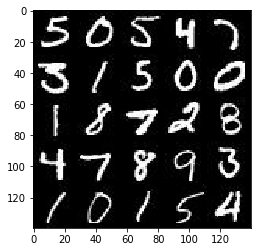

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

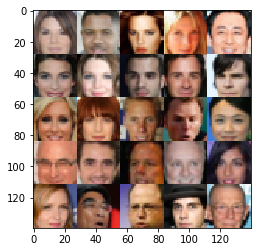

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels],name='inputs')
    z = tf.placeholder(tf.float32, [None,z_dim], name='z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')
    
    return (inputs, z, learning_rate)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False,alpha=0.1):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    with tf.variable_scope('discriminator',reuse=reuse):
        
        #input is (28,28,3) ((28,28,1) in Mnist)
        
        conv1 = tf.layers.conv2d(images,128,5,strides=2,padding='same')
        #conv1 = tf.layers.batch_normalization(conv1,training=True) *no normalization in first layer
        conv1 = tf.maximum(alpha * conv1, conv1)
        #shape is (14,14,128)
        
        conv2 = tf.layers.conv2d(conv1,256,5,strides=2,padding='same')
        conv2 = tf.layers.batch_normalization(conv2,training=True)
        conv2 = tf.layers.dropout(conv2,0.2)
        conv2 = tf.maximum(alpha * conv2, conv2)
        #shape is (7,7,256)
        
        conv3 = tf.layers.conv2d(conv2,512,5,strides=2,padding='same')
        conv3 = tf.layers.batch_normalization(conv3,training=True)
        conv3 = tf.layers.dropout(conv3,0.2)
        conv3 = tf.maximum(alpha * conv3, conv3)
        #shape is (4,4,512)
        
        layer = tf.reshape(conv3,(-1,4*4*512))
        logits = tf.layers.dense(layer,1)
        out = tf.sigmoid(logits)
        return logits, out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.1):
    """ 
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator',reuse=(not is_train)):
        #z is 1d vector
        
        x1 = tf.layers.dense(z,2*2*1024)
        #x1 = tf.layers.dropout(x1, 0.2)
        x1 = tf.reshape(x1,(-1,2,2,1024))
        x1 = tf.layers.batch_normalization(x1,training=is_train)
        x1 = tf.layers.dropout(x1,0.2)
        x1 = tf.maximum(alpha * x1, x1)
        #shape is (2,2,1024)
        
        x2 = tf.layers.conv2d_transpose(x1, 512, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2,training=is_train)
        x2 = tf.layers.dropout(x2,0.2)
        x2 = tf.maximum(alpha * x2, x2)
        #shape is (4,4,512)
        
        x3 = tf.layers.conv2d_transpose(x2, 256, 4, strides=1, padding='valid')
        x3 = tf.layers.batch_normalization(x3,training=is_train)
        x3 = tf.layers.dropout(x3,0.2)
        x3 = tf.maximum(alpha * x3, x3)
        #shape is (7,7,256)
        
        x4 = tf.layers.conv2d_transpose(x3, 128, 5, strides=2, padding='same')
        x4 = tf.layers.batch_normalization(x4,training=is_train)
        x4 = tf.maximum(alpha * x4, x4)
        #shape is (14,14,512)
        
        logits = tf.layers.conv2d_transpose(x4, out_channel_dim, 5, strides=2, padding='same')
        
        out = tf.tanh(logits)
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_out = generator(input_z,out_channel_dim,alpha=alpha,is_train=True)
    d_real_logits, d_real_out = discriminator(input_real, reuse=False, alpha=alpha)
    d_fake_logits, d_fake_out = discriminator(g_out, reuse=True, alpha=alpha)
    
    d_real_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_real_logits,labels=tf.ones_like(d_real_logits)))
    d_fake_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_fake_logits,labels=tf.zeros_like(d_fake_logits)))
    d_loss = d_real_loss + d_fake_loss
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_fake_logits,labels=tf.ones_like(d_fake_logits)))
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    variables = tf.trainable_variables()
    d_variables = [var for var in variables if var.name.startswith('discriminator')]
    g_variables = [var for var in variables if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_variables)
        g_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_variables)
    
    return d_opt, g_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
import time

def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode, alpha = 0.1):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    image_channels=1 if data_image_mode=='L' else 3
    input_real, input_z, learningrate = model_inputs(data_shape[1],data_shape[2],image_channels,z_dim)
    d_loss,g_loss = model_loss(input_real,input_z,image_channels,alpha=alpha)
    d_opt, g_opt = model_opt(d_loss, g_loss, learningrate, beta1)
    
    saver = tf.train.Saver()
    losses = []
    
    start_time = time.time()
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            steps=0
            for batch_images in get_batches(batch_size):
                steps+=1
                batch_images = batch_images *2 # change to -1 ~ 1
                
                batch_z = np.random.uniform(-1,1,size=(batch_size,z_dim))
                _ = sess.run(d_opt, feed_dict = {input_real:batch_images, input_z:batch_z, learningrate:learning_rate})
                _ = sess.run(g_opt, feed_dict = {input_real:batch_images,input_z:batch_z, learningrate:learning_rate})
                _ = sess.run(g_opt, feed_dict = {input_real:batch_images,input_z:batch_z, learningrate:learning_rate})
                
                if steps%10 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Batch {}/{}".format(steps,data_shape[0]/int(batch_size)),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps%100 == 0:
                    show_generator_output(sess,25,input_z,image_channels,data_image_mode)
        saver.save(sess, './checkpoints/generator.ckpt')
        
        duration = time.time() - start_time
        
        return losses, duration
                
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Batch 10/937.5 Discriminator Loss: 1.4873... Generator Loss: 10.4977
Epoch 1/2... Batch 20/937.5 Discriminator Loss: 0.0789... Generator Loss: 11.5394
Epoch 1/2... Batch 30/937.5 Discriminator Loss: 0.9341... Generator Loss: 2.9322
Epoch 1/2... Batch 40/937.5 Discriminator Loss: 1.9763... Generator Loss: 0.9175
Epoch 1/2... Batch 50/937.5 Discriminator Loss: 2.1676... Generator Loss: 0.2520
Epoch 1/2... Batch 60/937.5 Discriminator Loss: 1.3444... Generator Loss: 1.0609
Epoch 1/2... Batch 70/937.5 Discriminator Loss: 2.9204... Generator Loss: 0.0693
Epoch 1/2... Batch 80/937.5 Discriminator Loss: 2.4457... Generator Loss: 0.7875
Epoch 1/2... Batch 90/937.5 Discriminator Loss: 4.1518... Generator Loss: 0.0234
Epoch 1/2... Batch 100/937.5 Discriminator Loss: 0.9666... Generator Loss: 1.8574


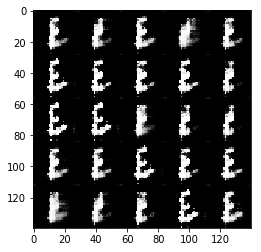

Epoch 1/2... Batch 110/937.5 Discriminator Loss: 1.5912... Generator Loss: 1.5546
Epoch 1/2... Batch 120/937.5 Discriminator Loss: 1.6894... Generator Loss: 9.0620
Epoch 1/2... Batch 130/937.5 Discriminator Loss: 1.0768... Generator Loss: 0.5673
Epoch 1/2... Batch 140/937.5 Discriminator Loss: 2.2680... Generator Loss: 1.3141
Epoch 1/2... Batch 150/937.5 Discriminator Loss: 1.2830... Generator Loss: 9.6682
Epoch 1/2... Batch 160/937.5 Discriminator Loss: 1.0028... Generator Loss: 1.5470
Epoch 1/2... Batch 170/937.5 Discriminator Loss: 0.3539... Generator Loss: 2.5996
Epoch 1/2... Batch 180/937.5 Discriminator Loss: 1.4464... Generator Loss: 0.7808
Epoch 1/2... Batch 190/937.5 Discriminator Loss: 2.9499... Generator Loss: 0.2498
Epoch 1/2... Batch 200/937.5 Discriminator Loss: 2.0959... Generator Loss: 0.2851


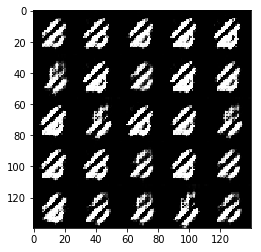

Epoch 1/2... Batch 210/937.5 Discriminator Loss: 2.0707... Generator Loss: 1.0712
Epoch 1/2... Batch 220/937.5 Discriminator Loss: 0.2891... Generator Loss: 1.8029
Epoch 1/2... Batch 230/937.5 Discriminator Loss: 0.2742... Generator Loss: 4.3543
Epoch 1/2... Batch 240/937.5 Discriminator Loss: 0.7259... Generator Loss: 0.8364
Epoch 1/2... Batch 250/937.5 Discriminator Loss: 0.9043... Generator Loss: 5.7396
Epoch 1/2... Batch 260/937.5 Discriminator Loss: 2.9697... Generator Loss: 3.5579
Epoch 1/2... Batch 270/937.5 Discriminator Loss: 0.5121... Generator Loss: 1.5424
Epoch 1/2... Batch 280/937.5 Discriminator Loss: 3.2084... Generator Loss: 0.0955
Epoch 1/2... Batch 290/937.5 Discriminator Loss: 0.7774... Generator Loss: 4.0743
Epoch 1/2... Batch 300/937.5 Discriminator Loss: 0.4631... Generator Loss: 5.0264


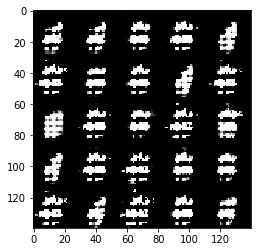

Epoch 1/2... Batch 310/937.5 Discriminator Loss: 0.9330... Generator Loss: 2.3301
Epoch 1/2... Batch 320/937.5 Discriminator Loss: 1.5297... Generator Loss: 1.7190
Epoch 1/2... Batch 330/937.5 Discriminator Loss: 0.8513... Generator Loss: 1.5190
Epoch 1/2... Batch 340/937.5 Discriminator Loss: 0.8325... Generator Loss: 2.4536
Epoch 1/2... Batch 350/937.5 Discriminator Loss: 0.7937... Generator Loss: 1.4989
Epoch 1/2... Batch 360/937.5 Discriminator Loss: 1.1520... Generator Loss: 1.3396
Epoch 1/2... Batch 370/937.5 Discriminator Loss: 0.8359... Generator Loss: 0.9807
Epoch 1/2... Batch 380/937.5 Discriminator Loss: 1.0989... Generator Loss: 1.6899
Epoch 1/2... Batch 390/937.5 Discriminator Loss: 1.3080... Generator Loss: 0.5272
Epoch 1/2... Batch 400/937.5 Discriminator Loss: 0.7330... Generator Loss: 1.2535


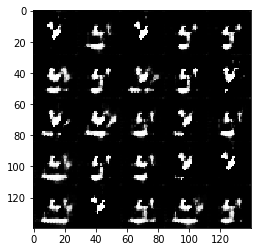

Epoch 1/2... Batch 410/937.5 Discriminator Loss: 0.7898... Generator Loss: 2.0798
Epoch 1/2... Batch 420/937.5 Discriminator Loss: 2.2841... Generator Loss: 0.1873
Epoch 1/2... Batch 430/937.5 Discriminator Loss: 0.8764... Generator Loss: 0.9488
Epoch 1/2... Batch 440/937.5 Discriminator Loss: 2.1357... Generator Loss: 0.2803
Epoch 1/2... Batch 450/937.5 Discriminator Loss: 2.6818... Generator Loss: 1.5785
Epoch 1/2... Batch 460/937.5 Discriminator Loss: 1.1709... Generator Loss: 1.9969
Epoch 1/2... Batch 470/937.5 Discriminator Loss: 0.6695... Generator Loss: 1.3704
Epoch 1/2... Batch 480/937.5 Discriminator Loss: 0.7698... Generator Loss: 0.9434
Epoch 1/2... Batch 490/937.5 Discriminator Loss: 1.4701... Generator Loss: 0.4148
Epoch 1/2... Batch 500/937.5 Discriminator Loss: 0.7576... Generator Loss: 1.1842


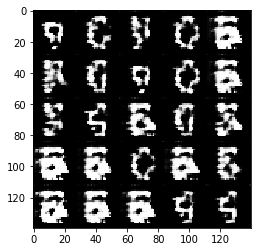

Epoch 1/2... Batch 510/937.5 Discriminator Loss: 0.9066... Generator Loss: 0.9441
Epoch 1/2... Batch 520/937.5 Discriminator Loss: 1.4286... Generator Loss: 0.4845
Epoch 1/2... Batch 530/937.5 Discriminator Loss: 1.1102... Generator Loss: 2.2303
Epoch 1/2... Batch 540/937.5 Discriminator Loss: 1.2433... Generator Loss: 0.5920
Epoch 1/2... Batch 550/937.5 Discriminator Loss: 1.4153... Generator Loss: 1.7773
Epoch 1/2... Batch 560/937.5 Discriminator Loss: 1.0957... Generator Loss: 2.2232
Epoch 1/2... Batch 570/937.5 Discriminator Loss: 1.2898... Generator Loss: 1.2640
Epoch 1/2... Batch 580/937.5 Discriminator Loss: 1.1635... Generator Loss: 1.2399
Epoch 1/2... Batch 590/937.5 Discriminator Loss: 1.0245... Generator Loss: 0.8148
Epoch 1/2... Batch 600/937.5 Discriminator Loss: 1.2484... Generator Loss: 0.6608


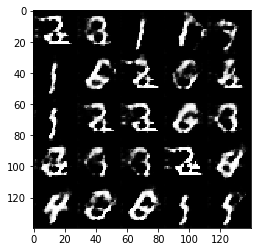

Epoch 1/2... Batch 610/937.5 Discriminator Loss: 0.8211... Generator Loss: 0.9220
Epoch 1/2... Batch 620/937.5 Discriminator Loss: 1.3116... Generator Loss: 1.1024
Epoch 1/2... Batch 630/937.5 Discriminator Loss: 1.0454... Generator Loss: 1.8178
Epoch 1/2... Batch 640/937.5 Discriminator Loss: 1.4739... Generator Loss: 0.4555
Epoch 1/2... Batch 650/937.5 Discriminator Loss: 1.0765... Generator Loss: 0.8824
Epoch 1/2... Batch 660/937.5 Discriminator Loss: 1.7769... Generator Loss: 2.1706
Epoch 1/2... Batch 670/937.5 Discriminator Loss: 1.1123... Generator Loss: 0.7004
Epoch 1/2... Batch 680/937.5 Discriminator Loss: 1.9762... Generator Loss: 0.2004
Epoch 1/2... Batch 690/937.5 Discriminator Loss: 1.4269... Generator Loss: 1.0431
Epoch 1/2... Batch 700/937.5 Discriminator Loss: 0.9614... Generator Loss: 0.6754


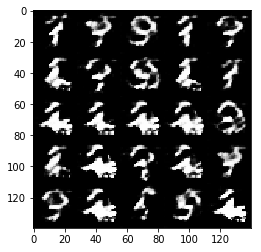

Epoch 1/2... Batch 710/937.5 Discriminator Loss: 0.7843... Generator Loss: 1.3666
Epoch 1/2... Batch 720/937.5 Discriminator Loss: 1.2292... Generator Loss: 0.7885
Epoch 1/2... Batch 730/937.5 Discriminator Loss: 1.4557... Generator Loss: 0.4793
Epoch 1/2... Batch 740/937.5 Discriminator Loss: 1.2728... Generator Loss: 0.8177
Epoch 1/2... Batch 750/937.5 Discriminator Loss: 1.0093... Generator Loss: 1.9030
Epoch 1/2... Batch 760/937.5 Discriminator Loss: 1.0415... Generator Loss: 0.7915
Epoch 1/2... Batch 770/937.5 Discriminator Loss: 1.0996... Generator Loss: 1.4395
Epoch 1/2... Batch 780/937.5 Discriminator Loss: 0.8402... Generator Loss: 1.0362
Epoch 1/2... Batch 790/937.5 Discriminator Loss: 1.4281... Generator Loss: 2.2084
Epoch 1/2... Batch 800/937.5 Discriminator Loss: 1.2055... Generator Loss: 0.6637


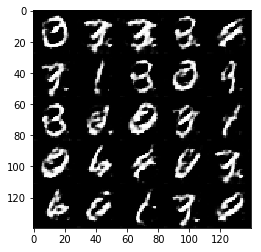

Epoch 1/2... Batch 810/937.5 Discriminator Loss: 1.4896... Generator Loss: 0.3970
Epoch 1/2... Batch 820/937.5 Discriminator Loss: 1.2586... Generator Loss: 2.0728
Epoch 1/2... Batch 830/937.5 Discriminator Loss: 1.1488... Generator Loss: 1.8982
Epoch 1/2... Batch 840/937.5 Discriminator Loss: 1.4225... Generator Loss: 0.4159
Epoch 1/2... Batch 850/937.5 Discriminator Loss: 0.8088... Generator Loss: 1.5711
Epoch 1/2... Batch 860/937.5 Discriminator Loss: 2.5942... Generator Loss: 0.1135
Epoch 1/2... Batch 870/937.5 Discriminator Loss: 1.2077... Generator Loss: 0.7404
Epoch 1/2... Batch 880/937.5 Discriminator Loss: 1.0890... Generator Loss: 1.7079
Epoch 1/2... Batch 890/937.5 Discriminator Loss: 1.6620... Generator Loss: 0.3674
Epoch 1/2... Batch 900/937.5 Discriminator Loss: 1.7578... Generator Loss: 0.2661


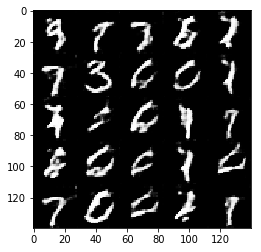

Epoch 1/2... Batch 910/937.5 Discriminator Loss: 1.2208... Generator Loss: 0.8694
Epoch 1/2... Batch 920/937.5 Discriminator Loss: 1.6735... Generator Loss: 0.3131
Epoch 1/2... Batch 930/937.5 Discriminator Loss: 1.1971... Generator Loss: 0.5442
Epoch 2/2... Batch 10/937.5 Discriminator Loss: 1.1125... Generator Loss: 2.2360
Epoch 2/2... Batch 20/937.5 Discriminator Loss: 1.3706... Generator Loss: 0.4363
Epoch 2/2... Batch 30/937.5 Discriminator Loss: 0.7306... Generator Loss: 1.4356
Epoch 2/2... Batch 40/937.5 Discriminator Loss: 1.2296... Generator Loss: 0.5706
Epoch 2/2... Batch 50/937.5 Discriminator Loss: 1.3910... Generator Loss: 2.2709
Epoch 2/2... Batch 60/937.5 Discriminator Loss: 1.4075... Generator Loss: 2.0493
Epoch 2/2... Batch 70/937.5 Discriminator Loss: 1.3298... Generator Loss: 1.3974
Epoch 2/2... Batch 80/937.5 Discriminator Loss: 2.4190... Generator Loss: 3.3017
Epoch 2/2... Batch 90/937.5 Discriminator Loss: 1.1612... Generator Loss: 1.4789
Epoch 2/2... Batch 100/93

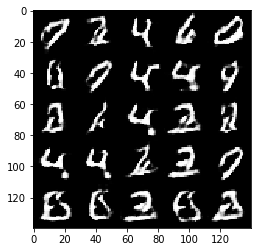

Epoch 2/2... Batch 110/937.5 Discriminator Loss: 1.3414... Generator Loss: 0.5350
Epoch 2/2... Batch 120/937.5 Discriminator Loss: 0.8890... Generator Loss: 0.9740
Epoch 2/2... Batch 130/937.5 Discriminator Loss: 0.8627... Generator Loss: 1.5841
Epoch 2/2... Batch 140/937.5 Discriminator Loss: 1.2894... Generator Loss: 1.3151
Epoch 2/2... Batch 150/937.5 Discriminator Loss: 1.4437... Generator Loss: 0.6063
Epoch 2/2... Batch 160/937.5 Discriminator Loss: 1.7369... Generator Loss: 0.3059
Epoch 2/2... Batch 170/937.5 Discriminator Loss: 1.4209... Generator Loss: 0.5299
Epoch 2/2... Batch 180/937.5 Discriminator Loss: 1.2203... Generator Loss: 0.6781
Epoch 2/2... Batch 190/937.5 Discriminator Loss: 1.3421... Generator Loss: 1.5922
Epoch 2/2... Batch 200/937.5 Discriminator Loss: 1.1472... Generator Loss: 0.9236


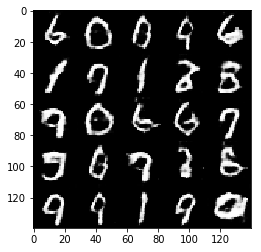

Epoch 2/2... Batch 210/937.5 Discriminator Loss: 0.9317... Generator Loss: 1.0540
Epoch 2/2... Batch 220/937.5 Discriminator Loss: 0.8367... Generator Loss: 1.3721
Epoch 2/2... Batch 230/937.5 Discriminator Loss: 1.1618... Generator Loss: 2.1658
Epoch 2/2... Batch 240/937.5 Discriminator Loss: 0.8659... Generator Loss: 0.9954
Epoch 2/2... Batch 250/937.5 Discriminator Loss: 0.9484... Generator Loss: 1.2227
Epoch 2/2... Batch 260/937.5 Discriminator Loss: 1.3291... Generator Loss: 1.4820
Epoch 2/2... Batch 270/937.5 Discriminator Loss: 1.2277... Generator Loss: 0.5262
Epoch 2/2... Batch 280/937.5 Discriminator Loss: 1.1451... Generator Loss: 2.1522
Epoch 2/2... Batch 290/937.5 Discriminator Loss: 1.3439... Generator Loss: 2.6311
Epoch 2/2... Batch 300/937.5 Discriminator Loss: 1.2770... Generator Loss: 0.7424


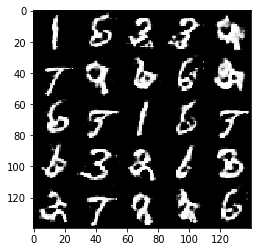

Epoch 2/2... Batch 310/937.5 Discriminator Loss: 1.1367... Generator Loss: 1.1098
Epoch 2/2... Batch 320/937.5 Discriminator Loss: 1.6552... Generator Loss: 2.3407
Epoch 2/2... Batch 330/937.5 Discriminator Loss: 1.1450... Generator Loss: 0.6435
Epoch 2/2... Batch 340/937.5 Discriminator Loss: 1.8912... Generator Loss: 0.2614
Epoch 2/2... Batch 350/937.5 Discriminator Loss: 0.9509... Generator Loss: 1.1455
Epoch 2/2... Batch 360/937.5 Discriminator Loss: 1.2733... Generator Loss: 0.6295
Epoch 2/2... Batch 370/937.5 Discriminator Loss: 1.1199... Generator Loss: 1.0864
Epoch 2/2... Batch 380/937.5 Discriminator Loss: 1.2949... Generator Loss: 0.5357
Epoch 2/2... Batch 390/937.5 Discriminator Loss: 1.0334... Generator Loss: 0.8910
Epoch 2/2... Batch 400/937.5 Discriminator Loss: 1.1566... Generator Loss: 0.7597


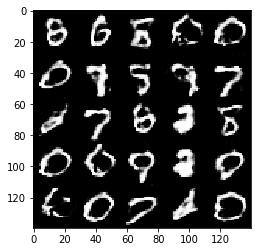

Epoch 2/2... Batch 410/937.5 Discriminator Loss: 1.1218... Generator Loss: 0.8836
Epoch 2/2... Batch 420/937.5 Discriminator Loss: 1.2467... Generator Loss: 0.6919
Epoch 2/2... Batch 430/937.5 Discriminator Loss: 1.2383... Generator Loss: 0.7154
Epoch 2/2... Batch 440/937.5 Discriminator Loss: 2.7441... Generator Loss: 0.1182
Epoch 2/2... Batch 450/937.5 Discriminator Loss: 1.5230... Generator Loss: 0.3935
Epoch 2/2... Batch 460/937.5 Discriminator Loss: 1.6465... Generator Loss: 0.2700
Epoch 2/2... Batch 470/937.5 Discriminator Loss: 1.0359... Generator Loss: 1.0248
Epoch 2/2... Batch 480/937.5 Discriminator Loss: 1.1013... Generator Loss: 1.5905
Epoch 2/2... Batch 490/937.5 Discriminator Loss: 1.1285... Generator Loss: 0.6716
Epoch 2/2... Batch 500/937.5 Discriminator Loss: 1.9693... Generator Loss: 0.1972


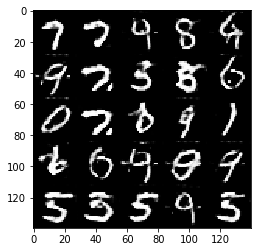

Epoch 2/2... Batch 510/937.5 Discriminator Loss: 1.4693... Generator Loss: 0.5027
Epoch 2/2... Batch 520/937.5 Discriminator Loss: 1.2262... Generator Loss: 1.0384
Epoch 2/2... Batch 530/937.5 Discriminator Loss: 1.7678... Generator Loss: 0.3099
Epoch 2/2... Batch 540/937.5 Discriminator Loss: 1.4045... Generator Loss: 0.7108
Epoch 2/2... Batch 550/937.5 Discriminator Loss: 1.0058... Generator Loss: 0.8937
Epoch 2/2... Batch 560/937.5 Discriminator Loss: 1.0729... Generator Loss: 0.9894
Epoch 2/2... Batch 570/937.5 Discriminator Loss: 1.0982... Generator Loss: 0.6800
Epoch 2/2... Batch 580/937.5 Discriminator Loss: 1.3519... Generator Loss: 0.6095
Epoch 2/2... Batch 590/937.5 Discriminator Loss: 1.4893... Generator Loss: 0.5142
Epoch 2/2... Batch 600/937.5 Discriminator Loss: 1.6009... Generator Loss: 1.2579


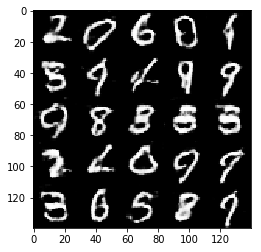

Epoch 2/2... Batch 610/937.5 Discriminator Loss: 1.3061... Generator Loss: 0.7436
Epoch 2/2... Batch 620/937.5 Discriminator Loss: 1.5514... Generator Loss: 1.0408
Epoch 2/2... Batch 630/937.5 Discriminator Loss: 1.2336... Generator Loss: 0.6374
Epoch 2/2... Batch 640/937.5 Discriminator Loss: 1.9356... Generator Loss: 0.2709
Epoch 2/2... Batch 650/937.5 Discriminator Loss: 1.0450... Generator Loss: 0.8637
Epoch 2/2... Batch 660/937.5 Discriminator Loss: 1.7121... Generator Loss: 0.2786
Epoch 2/2... Batch 670/937.5 Discriminator Loss: 1.3655... Generator Loss: 0.4926
Epoch 2/2... Batch 680/937.5 Discriminator Loss: 1.2578... Generator Loss: 1.5131
Epoch 2/2... Batch 690/937.5 Discriminator Loss: 1.8233... Generator Loss: 0.2924
Epoch 2/2... Batch 700/937.5 Discriminator Loss: 1.6178... Generator Loss: 0.9652


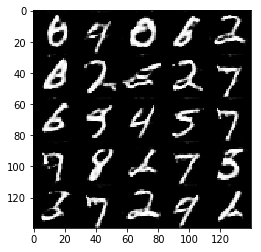

Epoch 2/2... Batch 710/937.5 Discriminator Loss: 1.5439... Generator Loss: 1.0334
Epoch 2/2... Batch 720/937.5 Discriminator Loss: 1.5267... Generator Loss: 0.4672
Epoch 2/2... Batch 730/937.5 Discriminator Loss: 1.2545... Generator Loss: 0.8243
Epoch 2/2... Batch 740/937.5 Discriminator Loss: 1.4274... Generator Loss: 0.4662
Epoch 2/2... Batch 750/937.5 Discriminator Loss: 1.2414... Generator Loss: 1.5871
Epoch 2/2... Batch 760/937.5 Discriminator Loss: 1.4338... Generator Loss: 0.7664
Epoch 2/2... Batch 770/937.5 Discriminator Loss: 1.0596... Generator Loss: 0.8997
Epoch 2/2... Batch 780/937.5 Discriminator Loss: 1.2444... Generator Loss: 0.8953
Epoch 2/2... Batch 790/937.5 Discriminator Loss: 1.2541... Generator Loss: 0.6285
Epoch 2/2... Batch 800/937.5 Discriminator Loss: 1.4772... Generator Loss: 0.4847


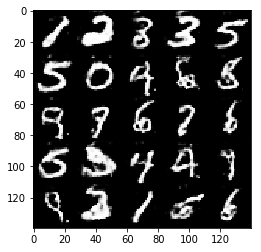

Epoch 2/2... Batch 810/937.5 Discriminator Loss: 1.3163... Generator Loss: 1.4167
Epoch 2/2... Batch 820/937.5 Discriminator Loss: 1.2897... Generator Loss: 1.6535
Epoch 2/2... Batch 830/937.5 Discriminator Loss: 2.1072... Generator Loss: 0.1639
Epoch 2/2... Batch 840/937.5 Discriminator Loss: 1.4554... Generator Loss: 0.4771
Epoch 2/2... Batch 850/937.5 Discriminator Loss: 1.4772... Generator Loss: 1.2255
Epoch 2/2... Batch 860/937.5 Discriminator Loss: 1.1623... Generator Loss: 0.8161
Epoch 2/2... Batch 870/937.5 Discriminator Loss: 2.1882... Generator Loss: 0.1741
Epoch 2/2... Batch 880/937.5 Discriminator Loss: 1.7144... Generator Loss: 0.3893
Epoch 2/2... Batch 890/937.5 Discriminator Loss: 1.8303... Generator Loss: 0.3020
Epoch 2/2... Batch 900/937.5 Discriminator Loss: 1.1862... Generator Loss: 0.7523


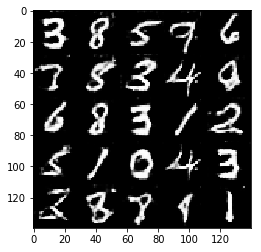

Epoch 2/2... Batch 910/937.5 Discriminator Loss: 1.4313... Generator Loss: 0.9048
Epoch 2/2... Batch 920/937.5 Discriminator Loss: 2.2867... Generator Loss: 0.1558
Epoch 2/2... Batch 930/937.5 Discriminator Loss: 1.3662... Generator Loss: 0.7350


In [18]:
batch_size = 64
z_dim = 128
learning_rate = 0.003
beta1 = 0.6

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Batch 10/12662.4375 Discriminator Loss: 4.1553... Generator Loss: 0.0267
Epoch 1/1... Batch 20/12662.4375 Discriminator Loss: 3.4026... Generator Loss: 0.0919
Epoch 1/1... Batch 30/12662.4375 Discriminator Loss: 3.5148... Generator Loss: 0.2356
Epoch 1/1... Batch 40/12662.4375 Discriminator Loss: 1.4051... Generator Loss: 0.8152
Epoch 1/1... Batch 50/12662.4375 Discriminator Loss: 1.3392... Generator Loss: 0.7356
Epoch 1/1... Batch 60/12662.4375 Discriminator Loss: 1.4812... Generator Loss: 0.8031
Epoch 1/1... Batch 70/12662.4375 Discriminator Loss: 1.2973... Generator Loss: 1.0091
Epoch 1/1... Batch 80/12662.4375 Discriminator Loss: 1.5198... Generator Loss: 0.9252
Epoch 1/1... Batch 90/12662.4375 Discriminator Loss: 0.8775... Generator Loss: 1.3702
Epoch 1/1... Batch 100/12662.4375 Discriminator Loss: 0.4515... Generator Loss: 1.7539


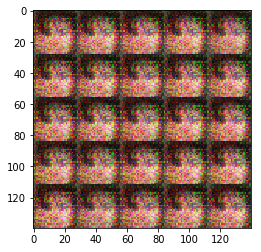

Epoch 1/1... Batch 110/12662.4375 Discriminator Loss: 1.1833... Generator Loss: 1.0037
Epoch 1/1... Batch 120/12662.4375 Discriminator Loss: 1.1128... Generator Loss: 1.4329
Epoch 1/1... Batch 130/12662.4375 Discriminator Loss: 1.0697... Generator Loss: 1.2092
Epoch 1/1... Batch 140/12662.4375 Discriminator Loss: 1.1013... Generator Loss: 1.3225
Epoch 1/1... Batch 150/12662.4375 Discriminator Loss: 0.6902... Generator Loss: 1.6279
Epoch 1/1... Batch 160/12662.4375 Discriminator Loss: 0.3558... Generator Loss: 1.6022
Epoch 1/1... Batch 170/12662.4375 Discriminator Loss: 0.7766... Generator Loss: 1.3247
Epoch 1/1... Batch 180/12662.4375 Discriminator Loss: 0.4001... Generator Loss: 1.7013
Epoch 1/1... Batch 190/12662.4375 Discriminator Loss: 1.2543... Generator Loss: 1.3668
Epoch 1/1... Batch 200/12662.4375 Discriminator Loss: 0.7212... Generator Loss: 1.3482


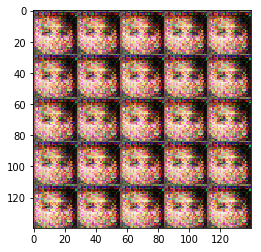

Epoch 1/1... Batch 210/12662.4375 Discriminator Loss: 0.3984... Generator Loss: 1.7717
Epoch 1/1... Batch 220/12662.4375 Discriminator Loss: 1.2423... Generator Loss: 1.3485
Epoch 1/1... Batch 230/12662.4375 Discriminator Loss: 1.2410... Generator Loss: 1.4070
Epoch 1/1... Batch 240/12662.4375 Discriminator Loss: 0.2451... Generator Loss: 2.1051
Epoch 1/1... Batch 250/12662.4375 Discriminator Loss: 0.7483... Generator Loss: 1.3146
Epoch 1/1... Batch 260/12662.4375 Discriminator Loss: 0.4546... Generator Loss: 1.7107
Epoch 1/1... Batch 270/12662.4375 Discriminator Loss: 0.3890... Generator Loss: 1.8344
Epoch 1/1... Batch 280/12662.4375 Discriminator Loss: 0.3948... Generator Loss: 1.3797
Epoch 1/1... Batch 290/12662.4375 Discriminator Loss: 0.2170... Generator Loss: 2.1330
Epoch 1/1... Batch 300/12662.4375 Discriminator Loss: 0.4483... Generator Loss: 1.9972


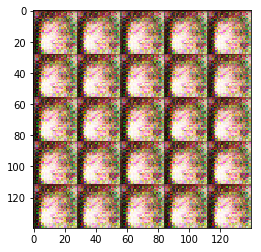

Epoch 1/1... Batch 310/12662.4375 Discriminator Loss: 0.2546... Generator Loss: 1.9341
Epoch 1/1... Batch 320/12662.4375 Discriminator Loss: 0.8105... Generator Loss: 1.2810
Epoch 1/1... Batch 330/12662.4375 Discriminator Loss: 0.3410... Generator Loss: 2.1792
Epoch 1/1... Batch 340/12662.4375 Discriminator Loss: 0.9294... Generator Loss: 1.6609
Epoch 1/1... Batch 350/12662.4375 Discriminator Loss: 0.6728... Generator Loss: 1.8682
Epoch 1/1... Batch 360/12662.4375 Discriminator Loss: 0.8441... Generator Loss: 1.2790
Epoch 1/1... Batch 370/12662.4375 Discriminator Loss: 0.2281... Generator Loss: 2.0811
Epoch 1/1... Batch 380/12662.4375 Discriminator Loss: 0.1314... Generator Loss: 2.7254
Epoch 1/1... Batch 390/12662.4375 Discriminator Loss: 0.3516... Generator Loss: 2.2161
Epoch 1/1... Batch 400/12662.4375 Discriminator Loss: 0.1108... Generator Loss: 2.4534


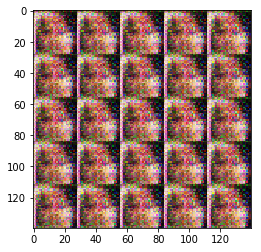

Epoch 1/1... Batch 410/12662.4375 Discriminator Loss: 0.3449... Generator Loss: 1.9220
Epoch 1/1... Batch 420/12662.4375 Discriminator Loss: 0.1938... Generator Loss: 1.9523
Epoch 1/1... Batch 430/12662.4375 Discriminator Loss: 0.1740... Generator Loss: 2.3455
Epoch 1/1... Batch 440/12662.4375 Discriminator Loss: 0.2618... Generator Loss: 2.3098
Epoch 1/1... Batch 450/12662.4375 Discriminator Loss: 0.1759... Generator Loss: 2.7148
Epoch 1/1... Batch 460/12662.4375 Discriminator Loss: 0.2606... Generator Loss: 2.2316
Epoch 1/1... Batch 470/12662.4375 Discriminator Loss: 0.1355... Generator Loss: 2.2792
Epoch 1/1... Batch 480/12662.4375 Discriminator Loss: 0.1317... Generator Loss: 2.3862
Epoch 1/1... Batch 490/12662.4375 Discriminator Loss: 0.1835... Generator Loss: 2.6702
Epoch 1/1... Batch 500/12662.4375 Discriminator Loss: 0.3227... Generator Loss: 2.1365


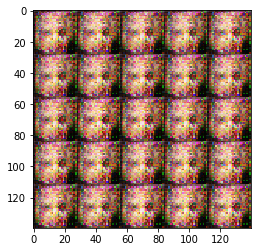

Epoch 1/1... Batch 510/12662.4375 Discriminator Loss: 0.4367... Generator Loss: 2.3112
Epoch 1/1... Batch 520/12662.4375 Discriminator Loss: 0.2095... Generator Loss: 2.4195
Epoch 1/1... Batch 530/12662.4375 Discriminator Loss: 0.2084... Generator Loss: 2.3388
Epoch 1/1... Batch 540/12662.4375 Discriminator Loss: 0.1060... Generator Loss: 2.7414
Epoch 1/1... Batch 550/12662.4375 Discriminator Loss: 0.1801... Generator Loss: 2.2564
Epoch 1/1... Batch 560/12662.4375 Discriminator Loss: 0.2015... Generator Loss: 2.6514
Epoch 1/1... Batch 570/12662.4375 Discriminator Loss: 0.2350... Generator Loss: 2.1058
Epoch 1/1... Batch 580/12662.4375 Discriminator Loss: 0.0701... Generator Loss: 3.0417
Epoch 1/1... Batch 590/12662.4375 Discriminator Loss: 0.0865... Generator Loss: 3.1887
Epoch 1/1... Batch 600/12662.4375 Discriminator Loss: 0.2489... Generator Loss: 2.4069


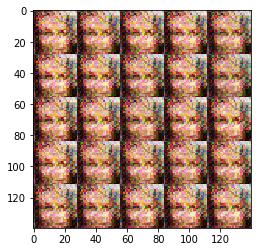

Epoch 1/1... Batch 610/12662.4375 Discriminator Loss: 0.1488... Generator Loss: 2.8781
Epoch 1/1... Batch 620/12662.4375 Discriminator Loss: 1.4375... Generator Loss: 0.4347
Epoch 1/1... Batch 630/12662.4375 Discriminator Loss: 1.8970... Generator Loss: 0.4759
Epoch 1/1... Batch 640/12662.4375 Discriminator Loss: 1.5362... Generator Loss: 0.6808
Epoch 1/1... Batch 650/12662.4375 Discriminator Loss: 2.0841... Generator Loss: 0.4849
Epoch 1/1... Batch 660/12662.4375 Discriminator Loss: 1.1454... Generator Loss: 0.7964
Epoch 1/1... Batch 670/12662.4375 Discriminator Loss: 1.3317... Generator Loss: 0.8355
Epoch 1/1... Batch 680/12662.4375 Discriminator Loss: 2.1379... Generator Loss: 0.4303
Epoch 1/1... Batch 690/12662.4375 Discriminator Loss: 1.0464... Generator Loss: 1.0675
Epoch 1/1... Batch 700/12662.4375 Discriminator Loss: 1.5479... Generator Loss: 0.6609


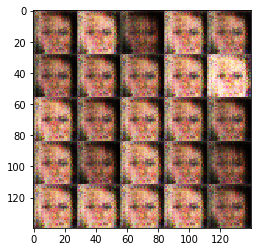

Epoch 1/1... Batch 710/12662.4375 Discriminator Loss: 0.9563... Generator Loss: 0.9273
Epoch 1/1... Batch 720/12662.4375 Discriminator Loss: 1.1546... Generator Loss: 0.7694
Epoch 1/1... Batch 730/12662.4375 Discriminator Loss: 1.2550... Generator Loss: 0.7900
Epoch 1/1... Batch 740/12662.4375 Discriminator Loss: 0.9704... Generator Loss: 1.1757
Epoch 1/1... Batch 750/12662.4375 Discriminator Loss: 0.9481... Generator Loss: 1.1402
Epoch 1/1... Batch 760/12662.4375 Discriminator Loss: 1.2228... Generator Loss: 1.1402
Epoch 1/1... Batch 770/12662.4375 Discriminator Loss: 1.2264... Generator Loss: 0.8511
Epoch 1/1... Batch 780/12662.4375 Discriminator Loss: 1.1557... Generator Loss: 0.8020
Epoch 1/1... Batch 790/12662.4375 Discriminator Loss: 1.5980... Generator Loss: 0.5880
Epoch 1/1... Batch 800/12662.4375 Discriminator Loss: 1.5015... Generator Loss: 0.6012


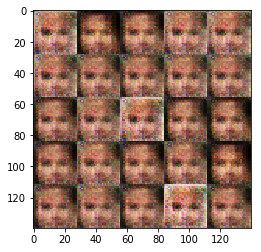

Epoch 1/1... Batch 810/12662.4375 Discriminator Loss: 2.3580... Generator Loss: 0.2278
Epoch 1/1... Batch 820/12662.4375 Discriminator Loss: 1.7282... Generator Loss: 0.6127
Epoch 1/1... Batch 830/12662.4375 Discriminator Loss: 1.1424... Generator Loss: 0.7692
Epoch 1/1... Batch 840/12662.4375 Discriminator Loss: 1.3940... Generator Loss: 0.7166
Epoch 1/1... Batch 850/12662.4375 Discriminator Loss: 1.5581... Generator Loss: 0.5661
Epoch 1/1... Batch 860/12662.4375 Discriminator Loss: 1.7214... Generator Loss: 0.7255
Epoch 1/1... Batch 870/12662.4375 Discriminator Loss: 1.1094... Generator Loss: 1.0418
Epoch 1/1... Batch 880/12662.4375 Discriminator Loss: 0.9299... Generator Loss: 1.1405
Epoch 1/1... Batch 890/12662.4375 Discriminator Loss: 1.2304... Generator Loss: 0.7446
Epoch 1/1... Batch 900/12662.4375 Discriminator Loss: 1.0265... Generator Loss: 0.8371


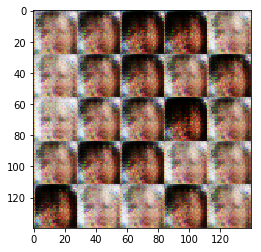

Epoch 1/1... Batch 910/12662.4375 Discriminator Loss: 1.2947... Generator Loss: 1.1008
Epoch 1/1... Batch 920/12662.4375 Discriminator Loss: 1.5716... Generator Loss: 0.3940
Epoch 1/1... Batch 930/12662.4375 Discriminator Loss: 1.1647... Generator Loss: 0.9638
Epoch 1/1... Batch 940/12662.4375 Discriminator Loss: 1.4818... Generator Loss: 0.8343
Epoch 1/1... Batch 950/12662.4375 Discriminator Loss: 0.8868... Generator Loss: 1.1776
Epoch 1/1... Batch 960/12662.4375 Discriminator Loss: 1.3705... Generator Loss: 0.7533
Epoch 1/1... Batch 970/12662.4375 Discriminator Loss: 1.3771... Generator Loss: 0.6388
Epoch 1/1... Batch 980/12662.4375 Discriminator Loss: 2.0860... Generator Loss: 0.3850
Epoch 1/1... Batch 990/12662.4375 Discriminator Loss: 1.0318... Generator Loss: 0.6668
Epoch 1/1... Batch 1000/12662.4375 Discriminator Loss: 0.8758... Generator Loss: 1.1389


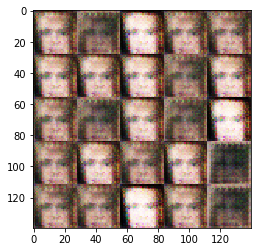

Epoch 1/1... Batch 1010/12662.4375 Discriminator Loss: 0.8376... Generator Loss: 0.9872
Epoch 1/1... Batch 1020/12662.4375 Discriminator Loss: 0.7446... Generator Loss: 1.0890
Epoch 1/1... Batch 1030/12662.4375 Discriminator Loss: 0.3935... Generator Loss: 1.7164
Epoch 1/1... Batch 1040/12662.4375 Discriminator Loss: 0.8929... Generator Loss: 1.0447
Epoch 1/1... Batch 1050/12662.4375 Discriminator Loss: 0.7084... Generator Loss: 1.3578
Epoch 1/1... Batch 1060/12662.4375 Discriminator Loss: 1.3540... Generator Loss: 0.8302
Epoch 1/1... Batch 1070/12662.4375 Discriminator Loss: 1.0573... Generator Loss: 0.9141
Epoch 1/1... Batch 1080/12662.4375 Discriminator Loss: 0.9919... Generator Loss: 1.0654
Epoch 1/1... Batch 1090/12662.4375 Discriminator Loss: 0.6790... Generator Loss: 1.1814
Epoch 1/1... Batch 1100/12662.4375 Discriminator Loss: 0.6434... Generator Loss: 1.6323


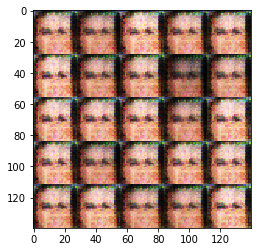

Epoch 1/1... Batch 1110/12662.4375 Discriminator Loss: 0.3373... Generator Loss: 1.7173
Epoch 1/1... Batch 1120/12662.4375 Discriminator Loss: 1.1338... Generator Loss: 0.8262
Epoch 1/1... Batch 1130/12662.4375 Discriminator Loss: 0.7023... Generator Loss: 1.1566
Epoch 1/1... Batch 1140/12662.4375 Discriminator Loss: 0.6220... Generator Loss: 1.1951
Epoch 1/1... Batch 1150/12662.4375 Discriminator Loss: 0.6868... Generator Loss: 1.2730
Epoch 1/1... Batch 1160/12662.4375 Discriminator Loss: 0.9298... Generator Loss: 1.1025
Epoch 1/1... Batch 1170/12662.4375 Discriminator Loss: 0.9371... Generator Loss: 1.1271
Epoch 1/1... Batch 1180/12662.4375 Discriminator Loss: 1.3337... Generator Loss: 0.5936
Epoch 1/1... Batch 1190/12662.4375 Discriminator Loss: 1.2978... Generator Loss: 0.6404
Epoch 1/1... Batch 1200/12662.4375 Discriminator Loss: 0.6384... Generator Loss: 1.3467


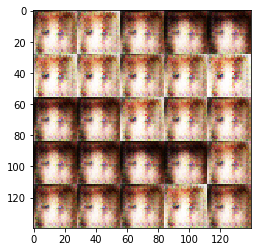

Epoch 1/1... Batch 1210/12662.4375 Discriminator Loss: 0.9286... Generator Loss: 1.0551
Epoch 1/1... Batch 1220/12662.4375 Discriminator Loss: 2.1242... Generator Loss: 0.5483
Epoch 1/1... Batch 1230/12662.4375 Discriminator Loss: 1.0901... Generator Loss: 1.0024
Epoch 1/1... Batch 1240/12662.4375 Discriminator Loss: 1.2575... Generator Loss: 0.8009
Epoch 1/1... Batch 1250/12662.4375 Discriminator Loss: 0.9299... Generator Loss: 0.8585
Epoch 1/1... Batch 1260/12662.4375 Discriminator Loss: 1.8566... Generator Loss: 0.5597
Epoch 1/1... Batch 1270/12662.4375 Discriminator Loss: 1.5812... Generator Loss: 1.3925
Epoch 1/1... Batch 1280/12662.4375 Discriminator Loss: 1.7689... Generator Loss: 0.5602
Epoch 1/1... Batch 1290/12662.4375 Discriminator Loss: 1.0737... Generator Loss: 0.9435
Epoch 1/1... Batch 1300/12662.4375 Discriminator Loss: 0.7903... Generator Loss: 1.2283


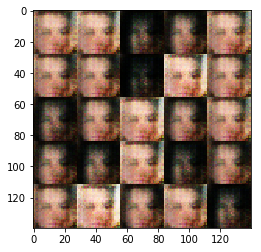

Epoch 1/1... Batch 1310/12662.4375 Discriminator Loss: 0.8861... Generator Loss: 1.1435
Epoch 1/1... Batch 1320/12662.4375 Discriminator Loss: 0.5627... Generator Loss: 1.7347
Epoch 1/1... Batch 1330/12662.4375 Discriminator Loss: 1.6805... Generator Loss: 0.6465
Epoch 1/1... Batch 1340/12662.4375 Discriminator Loss: 1.2352... Generator Loss: 0.9523
Epoch 1/1... Batch 1350/12662.4375 Discriminator Loss: 1.0308... Generator Loss: 0.8654
Epoch 1/1... Batch 1360/12662.4375 Discriminator Loss: 0.9930... Generator Loss: 0.7845
Epoch 1/1... Batch 1370/12662.4375 Discriminator Loss: 1.4664... Generator Loss: 0.7199
Epoch 1/1... Batch 1380/12662.4375 Discriminator Loss: 0.7315... Generator Loss: 1.3075
Epoch 1/1... Batch 1390/12662.4375 Discriminator Loss: 0.7464... Generator Loss: 1.2426
Epoch 1/1... Batch 1400/12662.4375 Discriminator Loss: 0.8269... Generator Loss: 1.2489


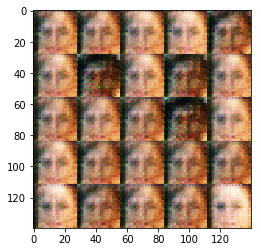

Epoch 1/1... Batch 1410/12662.4375 Discriminator Loss: 0.9932... Generator Loss: 0.8755
Epoch 1/1... Batch 1420/12662.4375 Discriminator Loss: 1.0887... Generator Loss: 1.3356
Epoch 1/1... Batch 1430/12662.4375 Discriminator Loss: 1.1425... Generator Loss: 0.7533
Epoch 1/1... Batch 1440/12662.4375 Discriminator Loss: 0.2518... Generator Loss: 2.1339
Epoch 1/1... Batch 1450/12662.4375 Discriminator Loss: 0.6880... Generator Loss: 1.0390
Epoch 1/1... Batch 1460/12662.4375 Discriminator Loss: 0.8887... Generator Loss: 0.9133
Epoch 1/1... Batch 1470/12662.4375 Discriminator Loss: 0.9574... Generator Loss: 0.8465
Epoch 1/1... Batch 1480/12662.4375 Discriminator Loss: 1.9064... Generator Loss: 0.5154
Epoch 1/1... Batch 1490/12662.4375 Discriminator Loss: 1.4658... Generator Loss: 0.4732
Epoch 1/1... Batch 1500/12662.4375 Discriminator Loss: 1.2443... Generator Loss: 0.8166


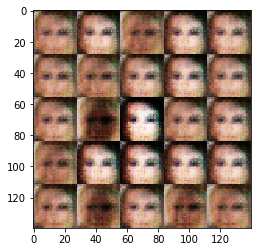

Epoch 1/1... Batch 1510/12662.4375 Discriminator Loss: 1.2420... Generator Loss: 0.8102
Epoch 1/1... Batch 1520/12662.4375 Discriminator Loss: 0.7654... Generator Loss: 1.3011
Epoch 1/1... Batch 1530/12662.4375 Discriminator Loss: 0.7599... Generator Loss: 1.2259
Epoch 1/1... Batch 1540/12662.4375 Discriminator Loss: 0.8849... Generator Loss: 1.1503
Epoch 1/1... Batch 1550/12662.4375 Discriminator Loss: 0.2924... Generator Loss: 1.6794
Epoch 1/1... Batch 1560/12662.4375 Discriminator Loss: 0.9100... Generator Loss: 1.1037
Epoch 1/1... Batch 1570/12662.4375 Discriminator Loss: 0.5140... Generator Loss: 1.7248
Epoch 1/1... Batch 1580/12662.4375 Discriminator Loss: 0.7334... Generator Loss: 1.1249
Epoch 1/1... Batch 1590/12662.4375 Discriminator Loss: 0.6569... Generator Loss: 1.3723
Epoch 1/1... Batch 1600/12662.4375 Discriminator Loss: 1.2844... Generator Loss: 0.8459


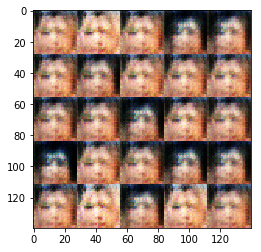

Epoch 1/1... Batch 1610/12662.4375 Discriminator Loss: 0.8067... Generator Loss: 1.1970
Epoch 1/1... Batch 1620/12662.4375 Discriminator Loss: 1.1137... Generator Loss: 0.9187
Epoch 1/1... Batch 1630/12662.4375 Discriminator Loss: 1.2461... Generator Loss: 1.0361
Epoch 1/1... Batch 1640/12662.4375 Discriminator Loss: 1.1741... Generator Loss: 0.6436
Epoch 1/1... Batch 1650/12662.4375 Discriminator Loss: 0.7923... Generator Loss: 0.9498
Epoch 1/1... Batch 1660/12662.4375 Discriminator Loss: 1.0976... Generator Loss: 0.9613
Epoch 1/1... Batch 1670/12662.4375 Discriminator Loss: 0.7364... Generator Loss: 1.2078
Epoch 1/1... Batch 1680/12662.4375 Discriminator Loss: 0.6563... Generator Loss: 1.4036
Epoch 1/1... Batch 1690/12662.4375 Discriminator Loss: 0.6671... Generator Loss: 1.3750
Epoch 1/1... Batch 1700/12662.4375 Discriminator Loss: 0.2287... Generator Loss: 2.1341


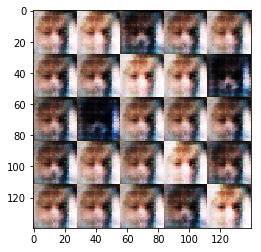

Epoch 1/1... Batch 1710/12662.4375 Discriminator Loss: 0.5466... Generator Loss: 1.4820
Epoch 1/1... Batch 1720/12662.4375 Discriminator Loss: 0.7770... Generator Loss: 1.1733
Epoch 1/1... Batch 1730/12662.4375 Discriminator Loss: 1.0503... Generator Loss: 0.8762
Epoch 1/1... Batch 1740/12662.4375 Discriminator Loss: 0.9201... Generator Loss: 1.0666
Epoch 1/1... Batch 1750/12662.4375 Discriminator Loss: 0.9522... Generator Loss: 0.8592
Epoch 1/1... Batch 1760/12662.4375 Discriminator Loss: 0.8059... Generator Loss: 1.4504
Epoch 1/1... Batch 1770/12662.4375 Discriminator Loss: 1.4517... Generator Loss: 1.0499
Epoch 1/1... Batch 1780/12662.4375 Discriminator Loss: 1.7917... Generator Loss: 0.8244
Epoch 1/1... Batch 1790/12662.4375 Discriminator Loss: 1.4921... Generator Loss: 0.9008
Epoch 1/1... Batch 1800/12662.4375 Discriminator Loss: 1.1117... Generator Loss: 0.9216


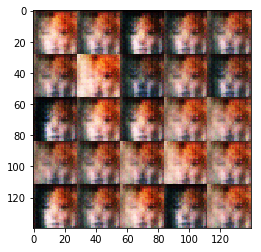

Epoch 1/1... Batch 1810/12662.4375 Discriminator Loss: 0.4436... Generator Loss: 1.6006
Epoch 1/1... Batch 1820/12662.4375 Discriminator Loss: 1.2326... Generator Loss: 0.7107
Epoch 1/1... Batch 1830/12662.4375 Discriminator Loss: 1.9226... Generator Loss: 0.6901
Epoch 1/1... Batch 1840/12662.4375 Discriminator Loss: 1.7944... Generator Loss: 0.6511
Epoch 1/1... Batch 1850/12662.4375 Discriminator Loss: 1.6510... Generator Loss: 0.5054
Epoch 1/1... Batch 1860/12662.4375 Discriminator Loss: 1.5521... Generator Loss: 0.5957
Epoch 1/1... Batch 1870/12662.4375 Discriminator Loss: 1.1903... Generator Loss: 0.6609
Epoch 1/1... Batch 1880/12662.4375 Discriminator Loss: 1.3300... Generator Loss: 0.6937
Epoch 1/1... Batch 1890/12662.4375 Discriminator Loss: 1.3112... Generator Loss: 1.1590
Epoch 1/1... Batch 1900/12662.4375 Discriminator Loss: 1.1747... Generator Loss: 1.0131


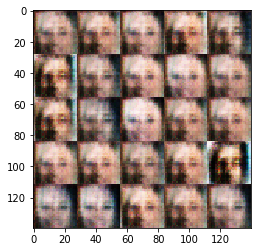

Epoch 1/1... Batch 1910/12662.4375 Discriminator Loss: 1.5493... Generator Loss: 0.5723
Epoch 1/1... Batch 1920/12662.4375 Discriminator Loss: 1.4515... Generator Loss: 0.6577
Epoch 1/1... Batch 1930/12662.4375 Discriminator Loss: 1.9217... Generator Loss: 0.7679
Epoch 1/1... Batch 1940/12662.4375 Discriminator Loss: 1.4992... Generator Loss: 0.8411
Epoch 1/1... Batch 1950/12662.4375 Discriminator Loss: 1.2989... Generator Loss: 0.7007
Epoch 1/1... Batch 1960/12662.4375 Discriminator Loss: 1.2200... Generator Loss: 0.7863
Epoch 1/1... Batch 1970/12662.4375 Discriminator Loss: 1.1814... Generator Loss: 0.9206
Epoch 1/1... Batch 1980/12662.4375 Discriminator Loss: 1.4185... Generator Loss: 0.7302
Epoch 1/1... Batch 1990/12662.4375 Discriminator Loss: 1.0416... Generator Loss: 0.9359
Epoch 1/1... Batch 2000/12662.4375 Discriminator Loss: 1.5730... Generator Loss: 0.6189


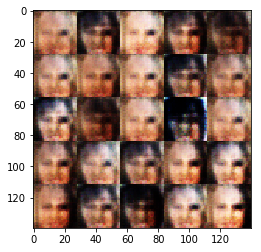

Epoch 1/1... Batch 2010/12662.4375 Discriminator Loss: 1.4343... Generator Loss: 0.6723
Epoch 1/1... Batch 2020/12662.4375 Discriminator Loss: 1.5775... Generator Loss: 0.7709
Epoch 1/1... Batch 2030/12662.4375 Discriminator Loss: 1.5094... Generator Loss: 0.5234
Epoch 1/1... Batch 2040/12662.4375 Discriminator Loss: 1.2776... Generator Loss: 0.5667
Epoch 1/1... Batch 2050/12662.4375 Discriminator Loss: 1.0546... Generator Loss: 0.7885
Epoch 1/1... Batch 2060/12662.4375 Discriminator Loss: 1.1143... Generator Loss: 1.2072
Epoch 1/1... Batch 2070/12662.4375 Discriminator Loss: 1.0627... Generator Loss: 1.2010
Epoch 1/1... Batch 2080/12662.4375 Discriminator Loss: 1.1694... Generator Loss: 0.8821
Epoch 1/1... Batch 2090/12662.4375 Discriminator Loss: 1.0522... Generator Loss: 1.1005
Epoch 1/1... Batch 2100/12662.4375 Discriminator Loss: 1.0149... Generator Loss: 1.2813


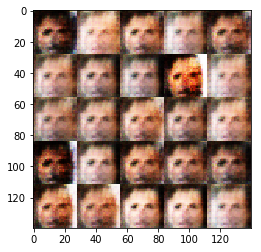

Epoch 1/1... Batch 2110/12662.4375 Discriminator Loss: 1.4135... Generator Loss: 0.7741
Epoch 1/1... Batch 2120/12662.4375 Discriminator Loss: 0.9794... Generator Loss: 1.1451
Epoch 1/1... Batch 2130/12662.4375 Discriminator Loss: 0.8038... Generator Loss: 1.1110
Epoch 1/1... Batch 2140/12662.4375 Discriminator Loss: 1.5266... Generator Loss: 0.6140
Epoch 1/1... Batch 2150/12662.4375 Discriminator Loss: 1.2896... Generator Loss: 0.7367
Epoch 1/1... Batch 2160/12662.4375 Discriminator Loss: 1.5939... Generator Loss: 0.6473
Epoch 1/1... Batch 2170/12662.4375 Discriminator Loss: 1.4778... Generator Loss: 0.6135
Epoch 1/1... Batch 2180/12662.4375 Discriminator Loss: 1.0594... Generator Loss: 0.9933
Epoch 1/1... Batch 2190/12662.4375 Discriminator Loss: 1.2552... Generator Loss: 0.9619
Epoch 1/1... Batch 2200/12662.4375 Discriminator Loss: 1.3129... Generator Loss: 0.7366


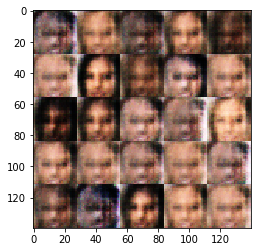

Epoch 1/1... Batch 2210/12662.4375 Discriminator Loss: 1.3436... Generator Loss: 0.6462
Epoch 1/1... Batch 2220/12662.4375 Discriminator Loss: 1.2661... Generator Loss: 0.8311
Epoch 1/1... Batch 2230/12662.4375 Discriminator Loss: 1.1961... Generator Loss: 0.7355
Epoch 1/1... Batch 2240/12662.4375 Discriminator Loss: 1.6254... Generator Loss: 0.4934
Epoch 1/1... Batch 2250/12662.4375 Discriminator Loss: 1.7186... Generator Loss: 0.6156
Epoch 1/1... Batch 2260/12662.4375 Discriminator Loss: 0.8590... Generator Loss: 0.9928
Epoch 1/1... Batch 2270/12662.4375 Discriminator Loss: 1.1198... Generator Loss: 0.8298
Epoch 1/1... Batch 2280/12662.4375 Discriminator Loss: 1.7502... Generator Loss: 0.6735
Epoch 1/1... Batch 2290/12662.4375 Discriminator Loss: 1.4495... Generator Loss: 0.6988
Epoch 1/1... Batch 2300/12662.4375 Discriminator Loss: 1.9411... Generator Loss: 0.4404


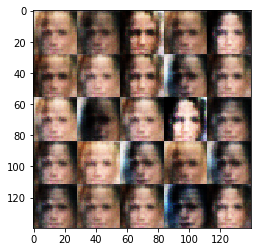

Epoch 1/1... Batch 2310/12662.4375 Discriminator Loss: 1.6092... Generator Loss: 0.6407
Epoch 1/1... Batch 2320/12662.4375 Discriminator Loss: 1.4428... Generator Loss: 0.6655
Epoch 1/1... Batch 2330/12662.4375 Discriminator Loss: 1.1655... Generator Loss: 0.8223
Epoch 1/1... Batch 2340/12662.4375 Discriminator Loss: 1.4576... Generator Loss: 0.7466
Epoch 1/1... Batch 2350/12662.4375 Discriminator Loss: 1.6471... Generator Loss: 0.5217
Epoch 1/1... Batch 2360/12662.4375 Discriminator Loss: 1.3685... Generator Loss: 0.7989
Epoch 1/1... Batch 2370/12662.4375 Discriminator Loss: 1.2870... Generator Loss: 0.7460
Epoch 1/1... Batch 2380/12662.4375 Discriminator Loss: 1.3203... Generator Loss: 0.7357
Epoch 1/1... Batch 2390/12662.4375 Discriminator Loss: 1.1939... Generator Loss: 0.6958
Epoch 1/1... Batch 2400/12662.4375 Discriminator Loss: 1.1859... Generator Loss: 0.6378


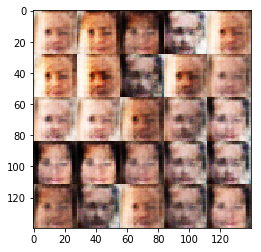

Epoch 1/1... Batch 2410/12662.4375 Discriminator Loss: 1.3487... Generator Loss: 0.5886
Epoch 1/1... Batch 2420/12662.4375 Discriminator Loss: 1.2910... Generator Loss: 0.8598
Epoch 1/1... Batch 2430/12662.4375 Discriminator Loss: 1.3506... Generator Loss: 0.8624
Epoch 1/1... Batch 2440/12662.4375 Discriminator Loss: 1.7511... Generator Loss: 0.5504
Epoch 1/1... Batch 2450/12662.4375 Discriminator Loss: 1.4216... Generator Loss: 0.6425
Epoch 1/1... Batch 2460/12662.4375 Discriminator Loss: 1.4822... Generator Loss: 0.6073
Epoch 1/1... Batch 2470/12662.4375 Discriminator Loss: 1.5662... Generator Loss: 0.6228
Epoch 1/1... Batch 2480/12662.4375 Discriminator Loss: 1.6384... Generator Loss: 0.6323
Epoch 1/1... Batch 2490/12662.4375 Discriminator Loss: 1.0444... Generator Loss: 0.9995
Epoch 1/1... Batch 2500/12662.4375 Discriminator Loss: 1.1590... Generator Loss: 0.8395


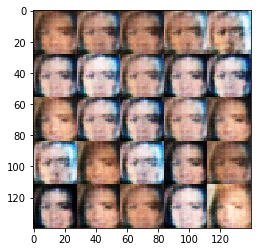

Epoch 1/1... Batch 2510/12662.4375 Discriminator Loss: 1.5531... Generator Loss: 0.6540
Epoch 1/1... Batch 2520/12662.4375 Discriminator Loss: 1.5612... Generator Loss: 0.6058
Epoch 1/1... Batch 2530/12662.4375 Discriminator Loss: 1.2506... Generator Loss: 0.7614
Epoch 1/1... Batch 2540/12662.4375 Discriminator Loss: 1.2144... Generator Loss: 0.6783
Epoch 1/1... Batch 2550/12662.4375 Discriminator Loss: 1.1735... Generator Loss: 0.7408
Epoch 1/1... Batch 2560/12662.4375 Discriminator Loss: 1.2493... Generator Loss: 0.8320
Epoch 1/1... Batch 2570/12662.4375 Discriminator Loss: 1.3549... Generator Loss: 0.6518
Epoch 1/1... Batch 2580/12662.4375 Discriminator Loss: 1.2091... Generator Loss: 0.9555
Epoch 1/1... Batch 2590/12662.4375 Discriminator Loss: 1.2954... Generator Loss: 0.8449
Epoch 1/1... Batch 2600/12662.4375 Discriminator Loss: 1.0257... Generator Loss: 0.8877


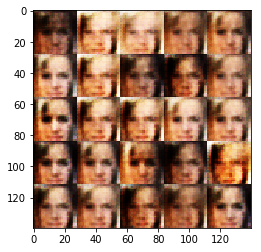

Epoch 1/1... Batch 2610/12662.4375 Discriminator Loss: 1.5080... Generator Loss: 0.6805
Epoch 1/1... Batch 2620/12662.4375 Discriminator Loss: 1.3670... Generator Loss: 0.7187
Epoch 1/1... Batch 2630/12662.4375 Discriminator Loss: 0.9274... Generator Loss: 0.9775
Epoch 1/1... Batch 2640/12662.4375 Discriminator Loss: 1.7318... Generator Loss: 0.6257
Epoch 1/1... Batch 2650/12662.4375 Discriminator Loss: 1.5165... Generator Loss: 0.6873
Epoch 1/1... Batch 2660/12662.4375 Discriminator Loss: 1.1327... Generator Loss: 1.0022
Epoch 1/1... Batch 2670/12662.4375 Discriminator Loss: 1.2149... Generator Loss: 0.6946
Epoch 1/1... Batch 2680/12662.4375 Discriminator Loss: 1.1622... Generator Loss: 0.7727
Epoch 1/1... Batch 2690/12662.4375 Discriminator Loss: 1.8923... Generator Loss: 0.7079
Epoch 1/1... Batch 2700/12662.4375 Discriminator Loss: 1.3200... Generator Loss: 0.6776


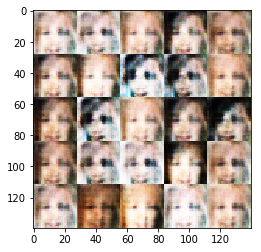

Epoch 1/1... Batch 2710/12662.4375 Discriminator Loss: 1.2247... Generator Loss: 0.7853
Epoch 1/1... Batch 2720/12662.4375 Discriminator Loss: 1.7142... Generator Loss: 0.4567
Epoch 1/1... Batch 2730/12662.4375 Discriminator Loss: 1.4120... Generator Loss: 0.6637
Epoch 1/1... Batch 2740/12662.4375 Discriminator Loss: 1.4162... Generator Loss: 0.5937
Epoch 1/1... Batch 2750/12662.4375 Discriminator Loss: 1.4015... Generator Loss: 0.6977
Epoch 1/1... Batch 2760/12662.4375 Discriminator Loss: 1.0018... Generator Loss: 0.7807
Epoch 1/1... Batch 2770/12662.4375 Discriminator Loss: 1.3995... Generator Loss: 0.6879
Epoch 1/1... Batch 2780/12662.4375 Discriminator Loss: 1.1943... Generator Loss: 0.7618
Epoch 1/1... Batch 2790/12662.4375 Discriminator Loss: 1.3149... Generator Loss: 0.5738
Epoch 1/1... Batch 2800/12662.4375 Discriminator Loss: 1.3797... Generator Loss: 0.6583


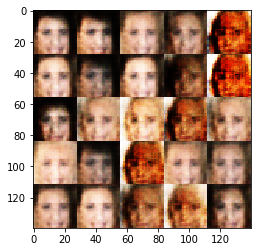

Epoch 1/1... Batch 2810/12662.4375 Discriminator Loss: 1.0719... Generator Loss: 0.7792
Epoch 1/1... Batch 2820/12662.4375 Discriminator Loss: 1.3638... Generator Loss: 0.6071
Epoch 1/1... Batch 2830/12662.4375 Discriminator Loss: 1.4839... Generator Loss: 0.4911
Epoch 1/1... Batch 2840/12662.4375 Discriminator Loss: 1.2918... Generator Loss: 0.6686
Epoch 1/1... Batch 2850/12662.4375 Discriminator Loss: 0.9051... Generator Loss: 0.8539
Epoch 1/1... Batch 2860/12662.4375 Discriminator Loss: 1.7285... Generator Loss: 0.5111
Epoch 1/1... Batch 2870/12662.4375 Discriminator Loss: 1.2801... Generator Loss: 0.7022
Epoch 1/1... Batch 2880/12662.4375 Discriminator Loss: 1.0429... Generator Loss: 0.8793
Epoch 1/1... Batch 2890/12662.4375 Discriminator Loss: 1.7685... Generator Loss: 0.5217
Epoch 1/1... Batch 2900/12662.4375 Discriminator Loss: 1.5206... Generator Loss: 0.6170


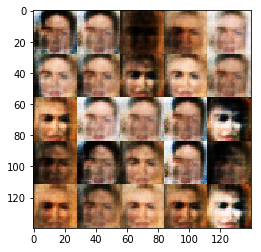

Epoch 1/1... Batch 2910/12662.4375 Discriminator Loss: 1.4407... Generator Loss: 0.7077
Epoch 1/1... Batch 2920/12662.4375 Discriminator Loss: 1.4988... Generator Loss: 0.6013
Epoch 1/1... Batch 2930/12662.4375 Discriminator Loss: 1.5971... Generator Loss: 0.5727
Epoch 1/1... Batch 2940/12662.4375 Discriminator Loss: 1.3442... Generator Loss: 0.5841
Epoch 1/1... Batch 2950/12662.4375 Discriminator Loss: 1.2986... Generator Loss: 0.6174
Epoch 1/1... Batch 2960/12662.4375 Discriminator Loss: 1.6400... Generator Loss: 0.6287
Epoch 1/1... Batch 2970/12662.4375 Discriminator Loss: 1.2539... Generator Loss: 0.8913
Epoch 1/1... Batch 2980/12662.4375 Discriminator Loss: 1.3273... Generator Loss: 0.6971
Epoch 1/1... Batch 2990/12662.4375 Discriminator Loss: 1.6388... Generator Loss: 0.6202
Epoch 1/1... Batch 3000/12662.4375 Discriminator Loss: 1.2006... Generator Loss: 0.8564


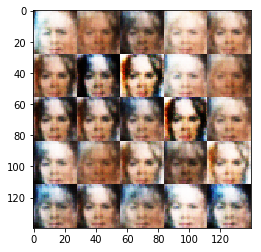

Epoch 1/1... Batch 3010/12662.4375 Discriminator Loss: 1.2065... Generator Loss: 0.6660
Epoch 1/1... Batch 3020/12662.4375 Discriminator Loss: 1.0420... Generator Loss: 0.8256
Epoch 1/1... Batch 3030/12662.4375 Discriminator Loss: 1.5761... Generator Loss: 0.5418
Epoch 1/1... Batch 3040/12662.4375 Discriminator Loss: 1.3510... Generator Loss: 0.6908
Epoch 1/1... Batch 3050/12662.4375 Discriminator Loss: 1.4733... Generator Loss: 0.6820
Epoch 1/1... Batch 3060/12662.4375 Discriminator Loss: 1.6954... Generator Loss: 0.4714
Epoch 1/1... Batch 3070/12662.4375 Discriminator Loss: 1.5949... Generator Loss: 0.5363
Epoch 1/1... Batch 3080/12662.4375 Discriminator Loss: 1.3221... Generator Loss: 0.6658
Epoch 1/1... Batch 3090/12662.4375 Discriminator Loss: 1.6687... Generator Loss: 0.5999
Epoch 1/1... Batch 3100/12662.4375 Discriminator Loss: 1.2143... Generator Loss: 0.7444


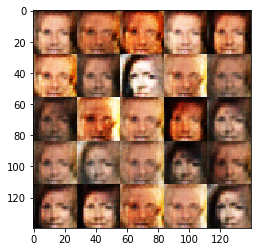

Epoch 1/1... Batch 3110/12662.4375 Discriminator Loss: 1.8124... Generator Loss: 0.6430
Epoch 1/1... Batch 3120/12662.4375 Discriminator Loss: 1.2065... Generator Loss: 0.7049
Epoch 1/1... Batch 3130/12662.4375 Discriminator Loss: 1.3089... Generator Loss: 0.6502
Epoch 1/1... Batch 3140/12662.4375 Discriminator Loss: 1.0864... Generator Loss: 0.7994
Epoch 1/1... Batch 3150/12662.4375 Discriminator Loss: 2.0904... Generator Loss: 0.4315
Epoch 1/1... Batch 3160/12662.4375 Discriminator Loss: 1.3951... Generator Loss: 0.6713
Epoch 1/1... Batch 3170/12662.4375 Discriminator Loss: 1.2121... Generator Loss: 0.6939
Epoch 1/1... Batch 3180/12662.4375 Discriminator Loss: 1.4189... Generator Loss: 0.6328
Epoch 1/1... Batch 3190/12662.4375 Discriminator Loss: 1.3959... Generator Loss: 0.7908
Epoch 1/1... Batch 3200/12662.4375 Discriminator Loss: 1.5598... Generator Loss: 0.5139


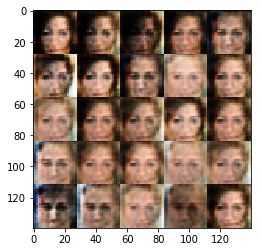

Epoch 1/1... Batch 3210/12662.4375 Discriminator Loss: 1.3693... Generator Loss: 0.6895
Epoch 1/1... Batch 3220/12662.4375 Discriminator Loss: 1.3765... Generator Loss: 0.8489
Epoch 1/1... Batch 3230/12662.4375 Discriminator Loss: 1.4073... Generator Loss: 0.5207
Epoch 1/1... Batch 3240/12662.4375 Discriminator Loss: 1.4771... Generator Loss: 0.6640
Epoch 1/1... Batch 3250/12662.4375 Discriminator Loss: 1.8372... Generator Loss: 0.4592
Epoch 1/1... Batch 3260/12662.4375 Discriminator Loss: 1.8958... Generator Loss: 0.4895
Epoch 1/1... Batch 3270/12662.4375 Discriminator Loss: 1.3917... Generator Loss: 0.6127
Epoch 1/1... Batch 3280/12662.4375 Discriminator Loss: 1.7619... Generator Loss: 0.4487
Epoch 1/1... Batch 3290/12662.4375 Discriminator Loss: 1.7621... Generator Loss: 0.5325
Epoch 1/1... Batch 3300/12662.4375 Discriminator Loss: 1.4051... Generator Loss: 0.6416


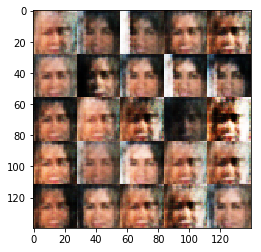

Epoch 1/1... Batch 3310/12662.4375 Discriminator Loss: 1.2569... Generator Loss: 0.7449
Epoch 1/1... Batch 3320/12662.4375 Discriminator Loss: 1.1702... Generator Loss: 0.7644
Epoch 1/1... Batch 3330/12662.4375 Discriminator Loss: 1.2171... Generator Loss: 0.7820
Epoch 1/1... Batch 3340/12662.4375 Discriminator Loss: 1.5065... Generator Loss: 0.6376
Epoch 1/1... Batch 3350/12662.4375 Discriminator Loss: 1.1478... Generator Loss: 0.7828
Epoch 1/1... Batch 3360/12662.4375 Discriminator Loss: 1.2239... Generator Loss: 0.7785
Epoch 1/1... Batch 3370/12662.4375 Discriminator Loss: 1.3259... Generator Loss: 0.6637
Epoch 1/1... Batch 3380/12662.4375 Discriminator Loss: 1.2918... Generator Loss: 0.7790
Epoch 1/1... Batch 3390/12662.4375 Discriminator Loss: 1.3178... Generator Loss: 0.6387
Epoch 1/1... Batch 3400/12662.4375 Discriminator Loss: 1.2473... Generator Loss: 0.6375


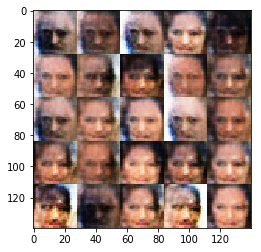

Epoch 1/1... Batch 3410/12662.4375 Discriminator Loss: 1.3159... Generator Loss: 0.8563
Epoch 1/1... Batch 3420/12662.4375 Discriminator Loss: 1.6661... Generator Loss: 0.6548
Epoch 1/1... Batch 3430/12662.4375 Discriminator Loss: 1.4161... Generator Loss: 0.6177
Epoch 1/1... Batch 3440/12662.4375 Discriminator Loss: 1.2371... Generator Loss: 0.8880
Epoch 1/1... Batch 3450/12662.4375 Discriminator Loss: 1.6188... Generator Loss: 0.5412
Epoch 1/1... Batch 3460/12662.4375 Discriminator Loss: 1.5848... Generator Loss: 0.6216
Epoch 1/1... Batch 3470/12662.4375 Discriminator Loss: 1.4420... Generator Loss: 0.7693
Epoch 1/1... Batch 3480/12662.4375 Discriminator Loss: 1.4951... Generator Loss: 0.6127
Epoch 1/1... Batch 3490/12662.4375 Discriminator Loss: 1.8285... Generator Loss: 0.6476
Epoch 1/1... Batch 3500/12662.4375 Discriminator Loss: 1.6467... Generator Loss: 0.6518


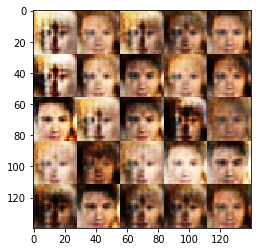

Epoch 1/1... Batch 3510/12662.4375 Discriminator Loss: 1.2832... Generator Loss: 0.6702
Epoch 1/1... Batch 3520/12662.4375 Discriminator Loss: 1.4116... Generator Loss: 0.7002
Epoch 1/1... Batch 3530/12662.4375 Discriminator Loss: 1.6290... Generator Loss: 0.4756
Epoch 1/1... Batch 3540/12662.4375 Discriminator Loss: 1.7063... Generator Loss: 0.5764
Epoch 1/1... Batch 3550/12662.4375 Discriminator Loss: 1.5327... Generator Loss: 0.6829
Epoch 1/1... Batch 3560/12662.4375 Discriminator Loss: 1.4148... Generator Loss: 0.6657
Epoch 1/1... Batch 3570/12662.4375 Discriminator Loss: 1.4341... Generator Loss: 0.6535
Epoch 1/1... Batch 3580/12662.4375 Discriminator Loss: 1.4029... Generator Loss: 0.6028
Epoch 1/1... Batch 3590/12662.4375 Discriminator Loss: 1.2804... Generator Loss: 0.8209
Epoch 1/1... Batch 3600/12662.4375 Discriminator Loss: 1.7229... Generator Loss: 0.5195


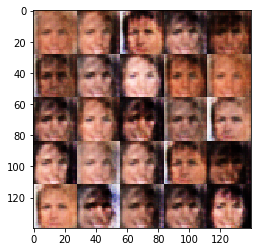

Epoch 1/1... Batch 3610/12662.4375 Discriminator Loss: 1.6639... Generator Loss: 0.5960
Epoch 1/1... Batch 3620/12662.4375 Discriminator Loss: 1.7732... Generator Loss: 0.6167
Epoch 1/1... Batch 3630/12662.4375 Discriminator Loss: 1.6722... Generator Loss: 0.6949
Epoch 1/1... Batch 3640/12662.4375 Discriminator Loss: 1.6939... Generator Loss: 0.5882
Epoch 1/1... Batch 3650/12662.4375 Discriminator Loss: 1.7508... Generator Loss: 0.4687
Epoch 1/1... Batch 3660/12662.4375 Discriminator Loss: 1.3397... Generator Loss: 0.6719
Epoch 1/1... Batch 3670/12662.4375 Discriminator Loss: 1.3264... Generator Loss: 0.7366
Epoch 1/1... Batch 3680/12662.4375 Discriminator Loss: 1.1900... Generator Loss: 0.7893
Epoch 1/1... Batch 3690/12662.4375 Discriminator Loss: 1.6218... Generator Loss: 0.5030
Epoch 1/1... Batch 3700/12662.4375 Discriminator Loss: 1.2007... Generator Loss: 0.6730


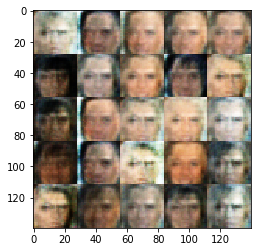

Epoch 1/1... Batch 3710/12662.4375 Discriminator Loss: 1.1865... Generator Loss: 0.7303
Epoch 1/1... Batch 3720/12662.4375 Discriminator Loss: 1.4253... Generator Loss: 0.5478
Epoch 1/1... Batch 3730/12662.4375 Discriminator Loss: 1.5941... Generator Loss: 0.6214
Epoch 1/1... Batch 3740/12662.4375 Discriminator Loss: 1.0468... Generator Loss: 0.9122
Epoch 1/1... Batch 3750/12662.4375 Discriminator Loss: 1.3176... Generator Loss: 0.6457
Epoch 1/1... Batch 3760/12662.4375 Discriminator Loss: 1.4162... Generator Loss: 0.7264
Epoch 1/1... Batch 3770/12662.4375 Discriminator Loss: 1.2933... Generator Loss: 0.6293
Epoch 1/1... Batch 3780/12662.4375 Discriminator Loss: 1.3250... Generator Loss: 0.6989
Epoch 1/1... Batch 3790/12662.4375 Discriminator Loss: 1.3699... Generator Loss: 0.7535
Epoch 1/1... Batch 3800/12662.4375 Discriminator Loss: 0.9874... Generator Loss: 0.9261


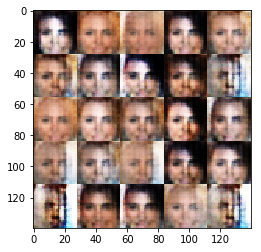

Epoch 1/1... Batch 3810/12662.4375 Discriminator Loss: 1.8097... Generator Loss: 0.4257
Epoch 1/1... Batch 3820/12662.4375 Discriminator Loss: 1.5318... Generator Loss: 0.5960
Epoch 1/1... Batch 3830/12662.4375 Discriminator Loss: 1.4611... Generator Loss: 0.6718
Epoch 1/1... Batch 3840/12662.4375 Discriminator Loss: 1.8871... Generator Loss: 0.4463
Epoch 1/1... Batch 3850/12662.4375 Discriminator Loss: 1.5385... Generator Loss: 0.5844
Epoch 1/1... Batch 3860/12662.4375 Discriminator Loss: 1.2764... Generator Loss: 0.6712
Epoch 1/1... Batch 3870/12662.4375 Discriminator Loss: 1.5367... Generator Loss: 0.5470
Epoch 1/1... Batch 3880/12662.4375 Discriminator Loss: 1.6228... Generator Loss: 0.5006
Epoch 1/1... Batch 3890/12662.4375 Discriminator Loss: 1.3865... Generator Loss: 0.5992
Epoch 1/1... Batch 3900/12662.4375 Discriminator Loss: 1.6086... Generator Loss: 0.5867


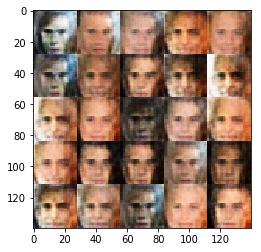

Epoch 1/1... Batch 3910/12662.4375 Discriminator Loss: 1.7270... Generator Loss: 0.5168
Epoch 1/1... Batch 3920/12662.4375 Discriminator Loss: 1.5698... Generator Loss: 0.5561
Epoch 1/1... Batch 3930/12662.4375 Discriminator Loss: 1.3112... Generator Loss: 0.6396
Epoch 1/1... Batch 3940/12662.4375 Discriminator Loss: 1.2641... Generator Loss: 0.7188
Epoch 1/1... Batch 3950/12662.4375 Discriminator Loss: 1.3184... Generator Loss: 0.7794
Epoch 1/1... Batch 3960/12662.4375 Discriminator Loss: 1.6302... Generator Loss: 0.5982
Epoch 1/1... Batch 3970/12662.4375 Discriminator Loss: 1.2262... Generator Loss: 0.7120
Epoch 1/1... Batch 3980/12662.4375 Discriminator Loss: 1.4114... Generator Loss: 0.6614
Epoch 1/1... Batch 3990/12662.4375 Discriminator Loss: 1.4114... Generator Loss: 0.6767
Epoch 1/1... Batch 4000/12662.4375 Discriminator Loss: 1.2060... Generator Loss: 0.7488


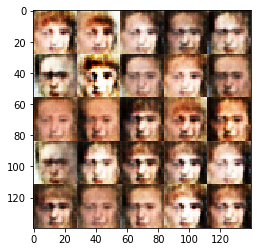

Epoch 1/1... Batch 4010/12662.4375 Discriminator Loss: 1.3331... Generator Loss: 0.6803
Epoch 1/1... Batch 4020/12662.4375 Discriminator Loss: 1.4974... Generator Loss: 0.5759
Epoch 1/1... Batch 4030/12662.4375 Discriminator Loss: 1.7054... Generator Loss: 0.5395
Epoch 1/1... Batch 4040/12662.4375 Discriminator Loss: 1.6996... Generator Loss: 0.5404
Epoch 1/1... Batch 4050/12662.4375 Discriminator Loss: 1.5544... Generator Loss: 0.6147
Epoch 1/1... Batch 4060/12662.4375 Discriminator Loss: 1.3629... Generator Loss: 0.6653
Epoch 1/1... Batch 4070/12662.4375 Discriminator Loss: 1.3947... Generator Loss: 0.6524
Epoch 1/1... Batch 4080/12662.4375 Discriminator Loss: 1.2714... Generator Loss: 0.7552
Epoch 1/1... Batch 4090/12662.4375 Discriminator Loss: 1.5018... Generator Loss: 0.5652
Epoch 1/1... Batch 4100/12662.4375 Discriminator Loss: 1.2460... Generator Loss: 0.8326


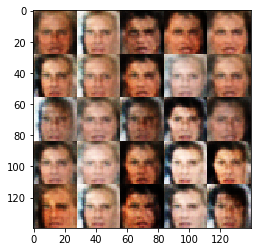

Epoch 1/1... Batch 4110/12662.4375 Discriminator Loss: 1.3128... Generator Loss: 0.7206
Epoch 1/1... Batch 4120/12662.4375 Discriminator Loss: 1.4790... Generator Loss: 0.6214
Epoch 1/1... Batch 4130/12662.4375 Discriminator Loss: 1.7869... Generator Loss: 0.5340
Epoch 1/1... Batch 4140/12662.4375 Discriminator Loss: 1.3684... Generator Loss: 0.6503
Epoch 1/1... Batch 4150/12662.4375 Discriminator Loss: 1.4955... Generator Loss: 0.6545
Epoch 1/1... Batch 4160/12662.4375 Discriminator Loss: 1.6191... Generator Loss: 0.6076
Epoch 1/1... Batch 4170/12662.4375 Discriminator Loss: 1.6433... Generator Loss: 0.5590
Epoch 1/1... Batch 4180/12662.4375 Discriminator Loss: 1.6902... Generator Loss: 0.4810
Epoch 1/1... Batch 4190/12662.4375 Discriminator Loss: 1.4787... Generator Loss: 0.5688
Epoch 1/1... Batch 4200/12662.4375 Discriminator Loss: 1.2260... Generator Loss: 0.7981


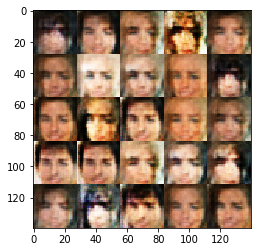

Epoch 1/1... Batch 4210/12662.4375 Discriminator Loss: 1.4603... Generator Loss: 0.6469
Epoch 1/1... Batch 4220/12662.4375 Discriminator Loss: 1.7358... Generator Loss: 0.5634
Epoch 1/1... Batch 4230/12662.4375 Discriminator Loss: 1.9312... Generator Loss: 0.4243
Epoch 1/1... Batch 4240/12662.4375 Discriminator Loss: 1.5284... Generator Loss: 0.5942
Epoch 1/1... Batch 4250/12662.4375 Discriminator Loss: 1.6459... Generator Loss: 0.4946
Epoch 1/1... Batch 4260/12662.4375 Discriminator Loss: 1.5396... Generator Loss: 0.6155
Epoch 1/1... Batch 4270/12662.4375 Discriminator Loss: 1.6945... Generator Loss: 0.6768
Epoch 1/1... Batch 4280/12662.4375 Discriminator Loss: 1.2924... Generator Loss: 0.7575
Epoch 1/1... Batch 4290/12662.4375 Discriminator Loss: 1.4248... Generator Loss: 0.6854
Epoch 1/1... Batch 4300/12662.4375 Discriminator Loss: 1.5040... Generator Loss: 0.6768


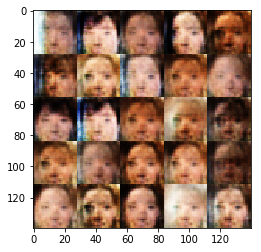

Epoch 1/1... Batch 4310/12662.4375 Discriminator Loss: 1.3095... Generator Loss: 0.7129
Epoch 1/1... Batch 4320/12662.4375 Discriminator Loss: 1.4884... Generator Loss: 0.6581
Epoch 1/1... Batch 4330/12662.4375 Discriminator Loss: 1.9686... Generator Loss: 0.4736
Epoch 1/1... Batch 4340/12662.4375 Discriminator Loss: 1.3258... Generator Loss: 0.7145
Epoch 1/1... Batch 4350/12662.4375 Discriminator Loss: 1.7168... Generator Loss: 0.4237
Epoch 1/1... Batch 4360/12662.4375 Discriminator Loss: 1.4379... Generator Loss: 0.6842
Epoch 1/1... Batch 4370/12662.4375 Discriminator Loss: 1.6519... Generator Loss: 0.6415
Epoch 1/1... Batch 4380/12662.4375 Discriminator Loss: 1.5235... Generator Loss: 0.6359
Epoch 1/1... Batch 4390/12662.4375 Discriminator Loss: 1.3592... Generator Loss: 0.7016
Epoch 1/1... Batch 4400/12662.4375 Discriminator Loss: 1.7523... Generator Loss: 0.4910


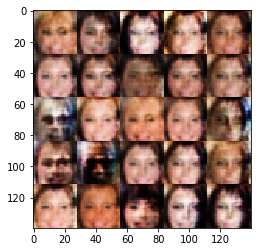

Epoch 1/1... Batch 4410/12662.4375 Discriminator Loss: 1.3426... Generator Loss: 0.6800
Epoch 1/1... Batch 4420/12662.4375 Discriminator Loss: 1.6755... Generator Loss: 0.5610
Epoch 1/1... Batch 4430/12662.4375 Discriminator Loss: 1.4649... Generator Loss: 0.6623
Epoch 1/1... Batch 4440/12662.4375 Discriminator Loss: 1.3774... Generator Loss: 0.6630
Epoch 1/1... Batch 4450/12662.4375 Discriminator Loss: 1.4382... Generator Loss: 0.5861
Epoch 1/1... Batch 4460/12662.4375 Discriminator Loss: 1.6048... Generator Loss: 0.5610
Epoch 1/1... Batch 4470/12662.4375 Discriminator Loss: 1.5392... Generator Loss: 0.6833
Epoch 1/1... Batch 4480/12662.4375 Discriminator Loss: 1.3087... Generator Loss: 0.6255
Epoch 1/1... Batch 4490/12662.4375 Discriminator Loss: 1.4368... Generator Loss: 0.6590
Epoch 1/1... Batch 4500/12662.4375 Discriminator Loss: 1.3612... Generator Loss: 0.5694


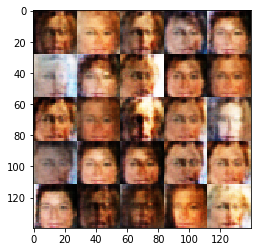

Epoch 1/1... Batch 4510/12662.4375 Discriminator Loss: 1.4096... Generator Loss: 0.5933
Epoch 1/1... Batch 4520/12662.4375 Discriminator Loss: 1.5619... Generator Loss: 0.5797
Epoch 1/1... Batch 4530/12662.4375 Discriminator Loss: 1.4028... Generator Loss: 0.6170
Epoch 1/1... Batch 4540/12662.4375 Discriminator Loss: 1.5781... Generator Loss: 0.5784
Epoch 1/1... Batch 4550/12662.4375 Discriminator Loss: 1.4038... Generator Loss: 0.6353
Epoch 1/1... Batch 4560/12662.4375 Discriminator Loss: 1.5067... Generator Loss: 0.5929
Epoch 1/1... Batch 4570/12662.4375 Discriminator Loss: 1.6916... Generator Loss: 0.5588
Epoch 1/1... Batch 4580/12662.4375 Discriminator Loss: 1.4389... Generator Loss: 0.5236
Epoch 1/1... Batch 4590/12662.4375 Discriminator Loss: 1.5760... Generator Loss: 0.5911
Epoch 1/1... Batch 4600/12662.4375 Discriminator Loss: 1.1025... Generator Loss: 0.7744


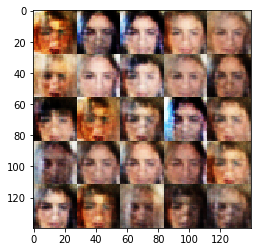

Epoch 1/1... Batch 4610/12662.4375 Discriminator Loss: 1.3825... Generator Loss: 0.6849
Epoch 1/1... Batch 4620/12662.4375 Discriminator Loss: 1.3889... Generator Loss: 0.6083
Epoch 1/1... Batch 4630/12662.4375 Discriminator Loss: 1.4679... Generator Loss: 0.5943
Epoch 1/1... Batch 4640/12662.4375 Discriminator Loss: 1.4174... Generator Loss: 0.6468
Epoch 1/1... Batch 4650/12662.4375 Discriminator Loss: 1.4983... Generator Loss: 0.5918
Epoch 1/1... Batch 4660/12662.4375 Discriminator Loss: 1.6799... Generator Loss: 0.5464
Epoch 1/1... Batch 4670/12662.4375 Discriminator Loss: 1.3035... Generator Loss: 0.6707
Epoch 1/1... Batch 4680/12662.4375 Discriminator Loss: 1.5545... Generator Loss: 0.5009
Epoch 1/1... Batch 4690/12662.4375 Discriminator Loss: 1.5350... Generator Loss: 0.5351
Epoch 1/1... Batch 4700/12662.4375 Discriminator Loss: 1.3304... Generator Loss: 0.6719


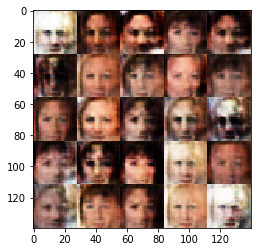

Epoch 1/1... Batch 4710/12662.4375 Discriminator Loss: 1.6046... Generator Loss: 0.5817
Epoch 1/1... Batch 4720/12662.4375 Discriminator Loss: 1.4803... Generator Loss: 0.5853
Epoch 1/1... Batch 4730/12662.4375 Discriminator Loss: 1.6942... Generator Loss: 0.6322
Epoch 1/1... Batch 4740/12662.4375 Discriminator Loss: 1.5305... Generator Loss: 0.6102
Epoch 1/1... Batch 4750/12662.4375 Discriminator Loss: 1.6410... Generator Loss: 0.5318
Epoch 1/1... Batch 4760/12662.4375 Discriminator Loss: 1.3478... Generator Loss: 0.6109
Epoch 1/1... Batch 4770/12662.4375 Discriminator Loss: 1.6429... Generator Loss: 0.5002
Epoch 1/1... Batch 4780/12662.4375 Discriminator Loss: 1.3330... Generator Loss: 0.6928
Epoch 1/1... Batch 4790/12662.4375 Discriminator Loss: 1.6912... Generator Loss: 0.5587
Epoch 1/1... Batch 4800/12662.4375 Discriminator Loss: 1.5394... Generator Loss: 0.6445


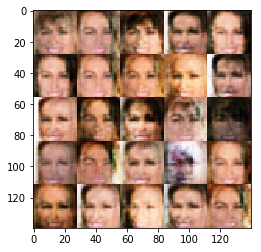

Epoch 1/1... Batch 4810/12662.4375 Discriminator Loss: 1.5307... Generator Loss: 0.5647
Epoch 1/1... Batch 4820/12662.4375 Discriminator Loss: 1.3741... Generator Loss: 0.6866
Epoch 1/1... Batch 4830/12662.4375 Discriminator Loss: 1.3532... Generator Loss: 0.6686
Epoch 1/1... Batch 4840/12662.4375 Discriminator Loss: 1.3735... Generator Loss: 0.6588
Epoch 1/1... Batch 4850/12662.4375 Discriminator Loss: 1.7479... Generator Loss: 0.5473
Epoch 1/1... Batch 4860/12662.4375 Discriminator Loss: 1.3576... Generator Loss: 0.7690
Epoch 1/1... Batch 4870/12662.4375 Discriminator Loss: 1.6863... Generator Loss: 0.5658
Epoch 1/1... Batch 4880/12662.4375 Discriminator Loss: 1.3158... Generator Loss: 0.6840
Epoch 1/1... Batch 4890/12662.4375 Discriminator Loss: 1.3758... Generator Loss: 0.6783
Epoch 1/1... Batch 4900/12662.4375 Discriminator Loss: 1.5882... Generator Loss: 0.5729


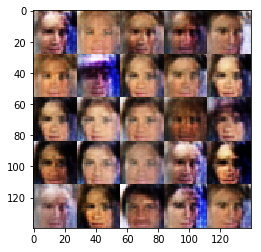

Epoch 1/1... Batch 4910/12662.4375 Discriminator Loss: 1.6778... Generator Loss: 0.5575
Epoch 1/1... Batch 4920/12662.4375 Discriminator Loss: 1.6643... Generator Loss: 0.5327
Epoch 1/1... Batch 4930/12662.4375 Discriminator Loss: 1.3057... Generator Loss: 0.7626
Epoch 1/1... Batch 4940/12662.4375 Discriminator Loss: 1.4227... Generator Loss: 0.5751
Epoch 1/1... Batch 4950/12662.4375 Discriminator Loss: 1.5773... Generator Loss: 0.5000
Epoch 1/1... Batch 4960/12662.4375 Discriminator Loss: 1.5265... Generator Loss: 0.5660
Epoch 1/1... Batch 4970/12662.4375 Discriminator Loss: 1.6219... Generator Loss: 0.6167
Epoch 1/1... Batch 4980/12662.4375 Discriminator Loss: 1.4194... Generator Loss: 0.6884
Epoch 1/1... Batch 4990/12662.4375 Discriminator Loss: 1.5457... Generator Loss: 0.6429
Epoch 1/1... Batch 5000/12662.4375 Discriminator Loss: 1.5328... Generator Loss: 0.6009


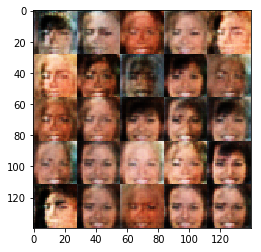

Epoch 1/1... Batch 5010/12662.4375 Discriminator Loss: 1.5309... Generator Loss: 0.5665
Epoch 1/1... Batch 5020/12662.4375 Discriminator Loss: 1.5050... Generator Loss: 0.5745
Epoch 1/1... Batch 5030/12662.4375 Discriminator Loss: 1.7198... Generator Loss: 0.5302
Epoch 1/1... Batch 5040/12662.4375 Discriminator Loss: 1.3642... Generator Loss: 0.6626
Epoch 1/1... Batch 5050/12662.4375 Discriminator Loss: 1.3817... Generator Loss: 0.6072
Epoch 1/1... Batch 5060/12662.4375 Discriminator Loss: 1.3463... Generator Loss: 0.6949
Epoch 1/1... Batch 5070/12662.4375 Discriminator Loss: 1.5726... Generator Loss: 0.5315
Epoch 1/1... Batch 5080/12662.4375 Discriminator Loss: 1.6850... Generator Loss: 0.5730
Epoch 1/1... Batch 5090/12662.4375 Discriminator Loss: 1.6856... Generator Loss: 0.5957
Epoch 1/1... Batch 5100/12662.4375 Discriminator Loss: 1.8089... Generator Loss: 0.5771


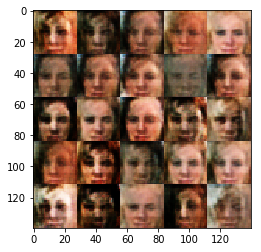

Epoch 1/1... Batch 5110/12662.4375 Discriminator Loss: 1.3362... Generator Loss: 0.7507
Epoch 1/1... Batch 5120/12662.4375 Discriminator Loss: 1.6557... Generator Loss: 0.5542
Epoch 1/1... Batch 5130/12662.4375 Discriminator Loss: 1.4354... Generator Loss: 0.6340
Epoch 1/1... Batch 5140/12662.4375 Discriminator Loss: 1.3829... Generator Loss: 0.5566
Epoch 1/1... Batch 5150/12662.4375 Discriminator Loss: 1.4338... Generator Loss: 0.5771
Epoch 1/1... Batch 5160/12662.4375 Discriminator Loss: 1.4514... Generator Loss: 0.6575
Epoch 1/1... Batch 5170/12662.4375 Discriminator Loss: 1.4632... Generator Loss: 0.6294
Epoch 1/1... Batch 5180/12662.4375 Discriminator Loss: 1.3745... Generator Loss: 0.7057
Epoch 1/1... Batch 5190/12662.4375 Discriminator Loss: 1.4777... Generator Loss: 0.5853
Epoch 1/1... Batch 5200/12662.4375 Discriminator Loss: 1.5589... Generator Loss: 0.5501


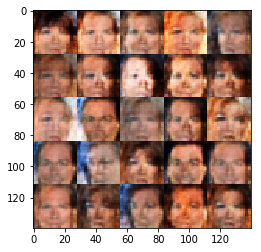

Epoch 1/1... Batch 5210/12662.4375 Discriminator Loss: 1.5741... Generator Loss: 0.6018
Epoch 1/1... Batch 5220/12662.4375 Discriminator Loss: 1.5783... Generator Loss: 0.5997
Epoch 1/1... Batch 5230/12662.4375 Discriminator Loss: 1.4601... Generator Loss: 0.6051
Epoch 1/1... Batch 5240/12662.4375 Discriminator Loss: 1.6240... Generator Loss: 0.6562
Epoch 1/1... Batch 5250/12662.4375 Discriminator Loss: 1.7137... Generator Loss: 0.5047
Epoch 1/1... Batch 5260/12662.4375 Discriminator Loss: 1.3141... Generator Loss: 0.6953
Epoch 1/1... Batch 5270/12662.4375 Discriminator Loss: 1.1817... Generator Loss: 0.6848
Epoch 1/1... Batch 5280/12662.4375 Discriminator Loss: 1.4335... Generator Loss: 0.5775
Epoch 1/1... Batch 5290/12662.4375 Discriminator Loss: 1.5565... Generator Loss: 0.5542
Epoch 1/1... Batch 5300/12662.4375 Discriminator Loss: 1.5456... Generator Loss: 0.5596


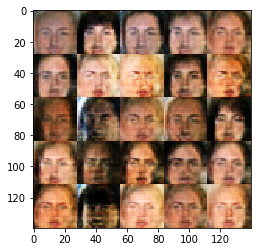

Epoch 1/1... Batch 5310/12662.4375 Discriminator Loss: 1.5968... Generator Loss: 0.6013
Epoch 1/1... Batch 5320/12662.4375 Discriminator Loss: 1.6184... Generator Loss: 0.6037
Epoch 1/1... Batch 5330/12662.4375 Discriminator Loss: 1.4452... Generator Loss: 0.6187
Epoch 1/1... Batch 5340/12662.4375 Discriminator Loss: 1.2177... Generator Loss: 0.7112
Epoch 1/1... Batch 5350/12662.4375 Discriminator Loss: 1.3522... Generator Loss: 0.5818
Epoch 1/1... Batch 5360/12662.4375 Discriminator Loss: 1.3614... Generator Loss: 0.7098
Epoch 1/1... Batch 5370/12662.4375 Discriminator Loss: 1.4476... Generator Loss: 0.7203
Epoch 1/1... Batch 5380/12662.4375 Discriminator Loss: 1.4426... Generator Loss: 0.5808
Epoch 1/1... Batch 5390/12662.4375 Discriminator Loss: 1.5022... Generator Loss: 0.5875
Epoch 1/1... Batch 5400/12662.4375 Discriminator Loss: 1.5587... Generator Loss: 0.5805


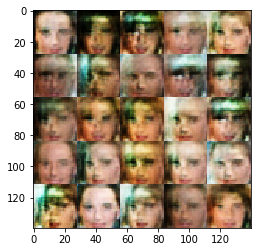

Epoch 1/1... Batch 5410/12662.4375 Discriminator Loss: 1.3806... Generator Loss: 0.6317
Epoch 1/1... Batch 5420/12662.4375 Discriminator Loss: 1.8255... Generator Loss: 0.4647
Epoch 1/1... Batch 5430/12662.4375 Discriminator Loss: 1.7913... Generator Loss: 0.4935
Epoch 1/1... Batch 5440/12662.4375 Discriminator Loss: 1.3461... Generator Loss: 0.6757
Epoch 1/1... Batch 5450/12662.4375 Discriminator Loss: 1.3304... Generator Loss: 0.6129
Epoch 1/1... Batch 5460/12662.4375 Discriminator Loss: 1.3553... Generator Loss: 0.6813
Epoch 1/1... Batch 5470/12662.4375 Discriminator Loss: 1.1916... Generator Loss: 0.6864
Epoch 1/1... Batch 5480/12662.4375 Discriminator Loss: 1.3765... Generator Loss: 0.5830
Epoch 1/1... Batch 5490/12662.4375 Discriminator Loss: 1.5295... Generator Loss: 0.6069
Epoch 1/1... Batch 5500/12662.4375 Discriminator Loss: 1.3505... Generator Loss: 0.6422


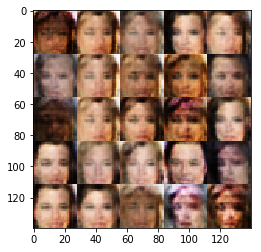

Epoch 1/1... Batch 5510/12662.4375 Discriminator Loss: 1.6106... Generator Loss: 0.5257
Epoch 1/1... Batch 5520/12662.4375 Discriminator Loss: 1.4221... Generator Loss: 0.7073
Epoch 1/1... Batch 5530/12662.4375 Discriminator Loss: 1.3668... Generator Loss: 0.7296
Epoch 1/1... Batch 5540/12662.4375 Discriminator Loss: 1.5128... Generator Loss: 0.6293
Epoch 1/1... Batch 5550/12662.4375 Discriminator Loss: 1.4772... Generator Loss: 0.6066
Epoch 1/1... Batch 5560/12662.4375 Discriminator Loss: 1.3751... Generator Loss: 0.5929
Epoch 1/1... Batch 5570/12662.4375 Discriminator Loss: 1.3404... Generator Loss: 0.6530
Epoch 1/1... Batch 5580/12662.4375 Discriminator Loss: 1.2987... Generator Loss: 0.6526
Epoch 1/1... Batch 5590/12662.4375 Discriminator Loss: 1.3092... Generator Loss: 0.6839
Epoch 1/1... Batch 5600/12662.4375 Discriminator Loss: 1.5594... Generator Loss: 0.5400


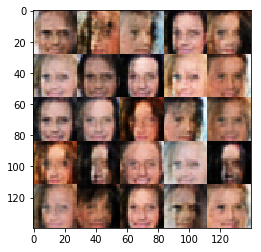

Epoch 1/1... Batch 5610/12662.4375 Discriminator Loss: 1.5167... Generator Loss: 0.5627
Epoch 1/1... Batch 5620/12662.4375 Discriminator Loss: 1.3456... Generator Loss: 0.6587
Epoch 1/1... Batch 5630/12662.4375 Discriminator Loss: 1.5429... Generator Loss: 0.6346
Epoch 1/1... Batch 5640/12662.4375 Discriminator Loss: 1.6083... Generator Loss: 0.6363
Epoch 1/1... Batch 5650/12662.4375 Discriminator Loss: 1.3593... Generator Loss: 0.6554
Epoch 1/1... Batch 5660/12662.4375 Discriminator Loss: 1.5957... Generator Loss: 0.5727
Epoch 1/1... Batch 5670/12662.4375 Discriminator Loss: 1.2688... Generator Loss: 0.6871
Epoch 1/1... Batch 5680/12662.4375 Discriminator Loss: 1.6269... Generator Loss: 0.5264
Epoch 1/1... Batch 5690/12662.4375 Discriminator Loss: 1.4920... Generator Loss: 0.5421
Epoch 1/1... Batch 5700/12662.4375 Discriminator Loss: 1.4292... Generator Loss: 0.6068


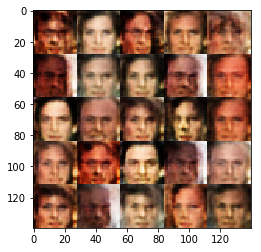

Epoch 1/1... Batch 5710/12662.4375 Discriminator Loss: 1.5107... Generator Loss: 0.6492
Epoch 1/1... Batch 5720/12662.4375 Discriminator Loss: 1.4273... Generator Loss: 0.6840
Epoch 1/1... Batch 5730/12662.4375 Discriminator Loss: 1.3528... Generator Loss: 0.5867
Epoch 1/1... Batch 5740/12662.4375 Discriminator Loss: 1.2072... Generator Loss: 0.6820
Epoch 1/1... Batch 5750/12662.4375 Discriminator Loss: 1.6691... Generator Loss: 0.5501
Epoch 1/1... Batch 5760/12662.4375 Discriminator Loss: 1.1362... Generator Loss: 0.7585
Epoch 1/1... Batch 5770/12662.4375 Discriminator Loss: 1.4496... Generator Loss: 0.5520
Epoch 1/1... Batch 5780/12662.4375 Discriminator Loss: 1.6036... Generator Loss: 0.5904
Epoch 1/1... Batch 5790/12662.4375 Discriminator Loss: 1.4191... Generator Loss: 0.6224
Epoch 1/1... Batch 5800/12662.4375 Discriminator Loss: 1.3394... Generator Loss: 0.7294


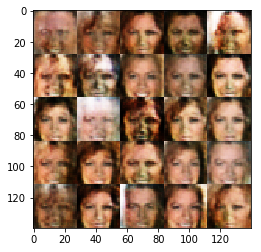

Epoch 1/1... Batch 5810/12662.4375 Discriminator Loss: 1.3165... Generator Loss: 0.6485
Epoch 1/1... Batch 5820/12662.4375 Discriminator Loss: 1.4902... Generator Loss: 0.6251
Epoch 1/1... Batch 5830/12662.4375 Discriminator Loss: 1.5904... Generator Loss: 0.6028
Epoch 1/1... Batch 5840/12662.4375 Discriminator Loss: 1.4367... Generator Loss: 0.6398
Epoch 1/1... Batch 5850/12662.4375 Discriminator Loss: 1.3507... Generator Loss: 0.6781
Epoch 1/1... Batch 5860/12662.4375 Discriminator Loss: 1.4173... Generator Loss: 0.6281
Epoch 1/1... Batch 5870/12662.4375 Discriminator Loss: 1.4229... Generator Loss: 0.6882
Epoch 1/1... Batch 5880/12662.4375 Discriminator Loss: 1.1068... Generator Loss: 0.7099
Epoch 1/1... Batch 5890/12662.4375 Discriminator Loss: 1.6336... Generator Loss: 0.5672
Epoch 1/1... Batch 5900/12662.4375 Discriminator Loss: 1.4574... Generator Loss: 0.6079


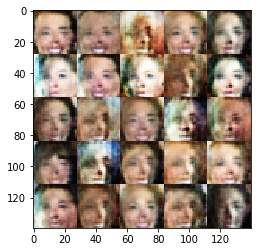

Epoch 1/1... Batch 5910/12662.4375 Discriminator Loss: 1.4012... Generator Loss: 0.5646
Epoch 1/1... Batch 5920/12662.4375 Discriminator Loss: 1.5787... Generator Loss: 0.5936
Epoch 1/1... Batch 5930/12662.4375 Discriminator Loss: 1.5294... Generator Loss: 0.5891
Epoch 1/1... Batch 5940/12662.4375 Discriminator Loss: 1.4980... Generator Loss: 0.6136
Epoch 1/1... Batch 5950/12662.4375 Discriminator Loss: 1.6201... Generator Loss: 0.5347
Epoch 1/1... Batch 5960/12662.4375 Discriminator Loss: 1.4948... Generator Loss: 0.5952
Epoch 1/1... Batch 5970/12662.4375 Discriminator Loss: 1.2009... Generator Loss: 0.7970
Epoch 1/1... Batch 5980/12662.4375 Discriminator Loss: 1.3375... Generator Loss: 0.6516
Epoch 1/1... Batch 5990/12662.4375 Discriminator Loss: 1.7721... Generator Loss: 0.4743
Epoch 1/1... Batch 6000/12662.4375 Discriminator Loss: 1.3691... Generator Loss: 0.6601


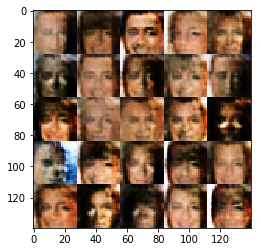

Epoch 1/1... Batch 6010/12662.4375 Discriminator Loss: 1.4904... Generator Loss: 0.5860
Epoch 1/1... Batch 6020/12662.4375 Discriminator Loss: 1.3208... Generator Loss: 0.6637
Epoch 1/1... Batch 6030/12662.4375 Discriminator Loss: 1.6547... Generator Loss: 0.5848
Epoch 1/1... Batch 6040/12662.4375 Discriminator Loss: 1.1991... Generator Loss: 0.7340
Epoch 1/1... Batch 6050/12662.4375 Discriminator Loss: 1.5062... Generator Loss: 0.5474
Epoch 1/1... Batch 6060/12662.4375 Discriminator Loss: 1.2505... Generator Loss: 0.6804
Epoch 1/1... Batch 6070/12662.4375 Discriminator Loss: 1.4750... Generator Loss: 0.6232
Epoch 1/1... Batch 6080/12662.4375 Discriminator Loss: 1.3671... Generator Loss: 0.6449
Epoch 1/1... Batch 6090/12662.4375 Discriminator Loss: 1.3028... Generator Loss: 0.6118
Epoch 1/1... Batch 6100/12662.4375 Discriminator Loss: 1.4132... Generator Loss: 0.6474


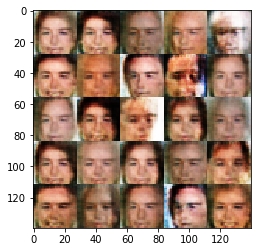

Epoch 1/1... Batch 6110/12662.4375 Discriminator Loss: 1.4363... Generator Loss: 0.6026
Epoch 1/1... Batch 6120/12662.4375 Discriminator Loss: 1.3547... Generator Loss: 0.6782
Epoch 1/1... Batch 6130/12662.4375 Discriminator Loss: 1.5366... Generator Loss: 0.6320
Epoch 1/1... Batch 6140/12662.4375 Discriminator Loss: 1.5233... Generator Loss: 0.6139
Epoch 1/1... Batch 6150/12662.4375 Discriminator Loss: 1.5455... Generator Loss: 0.6152
Epoch 1/1... Batch 6160/12662.4375 Discriminator Loss: 1.2494... Generator Loss: 0.6457
Epoch 1/1... Batch 6170/12662.4375 Discriminator Loss: 1.5854... Generator Loss: 0.5206
Epoch 1/1... Batch 6180/12662.4375 Discriminator Loss: 1.5023... Generator Loss: 0.6545
Epoch 1/1... Batch 6190/12662.4375 Discriminator Loss: 1.4839... Generator Loss: 0.5871
Epoch 1/1... Batch 6200/12662.4375 Discriminator Loss: 1.5030... Generator Loss: 0.6361


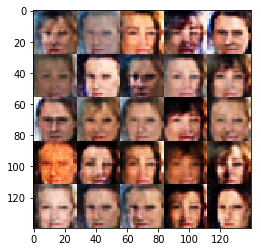

Epoch 1/1... Batch 6210/12662.4375 Discriminator Loss: 1.4194... Generator Loss: 0.6536
Epoch 1/1... Batch 6220/12662.4375 Discriminator Loss: 1.5531... Generator Loss: 0.5519
Epoch 1/1... Batch 6230/12662.4375 Discriminator Loss: 1.5059... Generator Loss: 0.6367
Epoch 1/1... Batch 6240/12662.4375 Discriminator Loss: 1.4630... Generator Loss: 0.5940
Epoch 1/1... Batch 6250/12662.4375 Discriminator Loss: 1.6725... Generator Loss: 0.5626
Epoch 1/1... Batch 6260/12662.4375 Discriminator Loss: 1.6067... Generator Loss: 0.5349
Epoch 1/1... Batch 6270/12662.4375 Discriminator Loss: 1.1916... Generator Loss: 0.7219
Epoch 1/1... Batch 6280/12662.4375 Discriminator Loss: 1.7610... Generator Loss: 0.4654
Epoch 1/1... Batch 6290/12662.4375 Discriminator Loss: 1.5665... Generator Loss: 0.5455
Epoch 1/1... Batch 6300/12662.4375 Discriminator Loss: 1.2925... Generator Loss: 0.7656


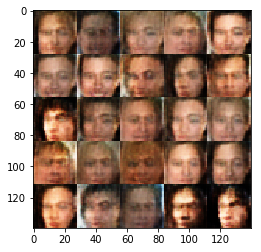

Epoch 1/1... Batch 6310/12662.4375 Discriminator Loss: 1.4558... Generator Loss: 0.5741
Epoch 1/1... Batch 6320/12662.4375 Discriminator Loss: 1.3817... Generator Loss: 0.6295
Epoch 1/1... Batch 6330/12662.4375 Discriminator Loss: 1.4691... Generator Loss: 0.5783
Epoch 1/1... Batch 6340/12662.4375 Discriminator Loss: 1.4650... Generator Loss: 0.6014
Epoch 1/1... Batch 6350/12662.4375 Discriminator Loss: 1.5066... Generator Loss: 0.5605
Epoch 1/1... Batch 6360/12662.4375 Discriminator Loss: 1.6400... Generator Loss: 0.5864
Epoch 1/1... Batch 6370/12662.4375 Discriminator Loss: 1.6172... Generator Loss: 0.4848
Epoch 1/1... Batch 6380/12662.4375 Discriminator Loss: 1.3901... Generator Loss: 0.5893
Epoch 1/1... Batch 6390/12662.4375 Discriminator Loss: 1.4178... Generator Loss: 0.6793
Epoch 1/1... Batch 6400/12662.4375 Discriminator Loss: 1.7441... Generator Loss: 0.5369


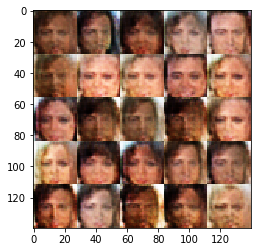

Epoch 1/1... Batch 6410/12662.4375 Discriminator Loss: 1.1593... Generator Loss: 0.8463
Epoch 1/1... Batch 6420/12662.4375 Discriminator Loss: 1.5587... Generator Loss: 0.5537
Epoch 1/1... Batch 6430/12662.4375 Discriminator Loss: 1.4251... Generator Loss: 0.7204
Epoch 1/1... Batch 6440/12662.4375 Discriminator Loss: 1.5621... Generator Loss: 0.6116
Epoch 1/1... Batch 6450/12662.4375 Discriminator Loss: 1.6136... Generator Loss: 0.5428
Epoch 1/1... Batch 6460/12662.4375 Discriminator Loss: 1.4483... Generator Loss: 0.6269
Epoch 1/1... Batch 6470/12662.4375 Discriminator Loss: 1.4077... Generator Loss: 0.6540
Epoch 1/1... Batch 6480/12662.4375 Discriminator Loss: 1.3174... Generator Loss: 0.6537
Epoch 1/1... Batch 6490/12662.4375 Discriminator Loss: 1.4621... Generator Loss: 0.6038
Epoch 1/1... Batch 6500/12662.4375 Discriminator Loss: 1.2992... Generator Loss: 0.6805


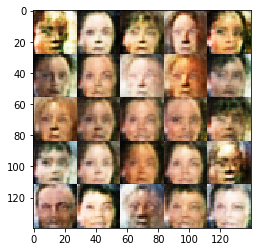

Epoch 1/1... Batch 6510/12662.4375 Discriminator Loss: 1.5614... Generator Loss: 0.5262
Epoch 1/1... Batch 6520/12662.4375 Discriminator Loss: 1.5370... Generator Loss: 0.5605
Epoch 1/1... Batch 6530/12662.4375 Discriminator Loss: 1.5238... Generator Loss: 0.5990
Epoch 1/1... Batch 6540/12662.4375 Discriminator Loss: 1.3739... Generator Loss: 0.6577
Epoch 1/1... Batch 6550/12662.4375 Discriminator Loss: 1.5912... Generator Loss: 0.5998
Epoch 1/1... Batch 6560/12662.4375 Discriminator Loss: 1.3027... Generator Loss: 0.6838
Epoch 1/1... Batch 6570/12662.4375 Discriminator Loss: 1.3784... Generator Loss: 0.6658
Epoch 1/1... Batch 6580/12662.4375 Discriminator Loss: 1.4614... Generator Loss: 0.5868
Epoch 1/1... Batch 6590/12662.4375 Discriminator Loss: 1.2414... Generator Loss: 0.7408
Epoch 1/1... Batch 6600/12662.4375 Discriminator Loss: 1.5769... Generator Loss: 0.5670


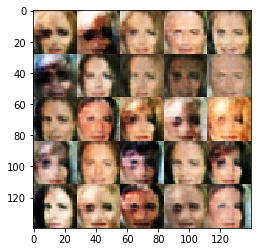

Epoch 1/1... Batch 6610/12662.4375 Discriminator Loss: 1.3156... Generator Loss: 0.6602
Epoch 1/1... Batch 6620/12662.4375 Discriminator Loss: 1.8590... Generator Loss: 0.4580
Epoch 1/1... Batch 6630/12662.4375 Discriminator Loss: 1.5688... Generator Loss: 0.6309
Epoch 1/1... Batch 6640/12662.4375 Discriminator Loss: 1.2605... Generator Loss: 0.7284
Epoch 1/1... Batch 6650/12662.4375 Discriminator Loss: 1.3940... Generator Loss: 0.5472
Epoch 1/1... Batch 6660/12662.4375 Discriminator Loss: 1.3923... Generator Loss: 0.6327
Epoch 1/1... Batch 6670/12662.4375 Discriminator Loss: 1.3671... Generator Loss: 0.6649
Epoch 1/1... Batch 6680/12662.4375 Discriminator Loss: 1.2842... Generator Loss: 0.7971
Epoch 1/1... Batch 6690/12662.4375 Discriminator Loss: 1.3915... Generator Loss: 0.5750
Epoch 1/1... Batch 6700/12662.4375 Discriminator Loss: 1.1395... Generator Loss: 0.7841


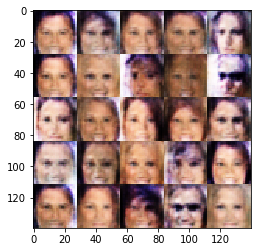

Epoch 1/1... Batch 6710/12662.4375 Discriminator Loss: 1.2898... Generator Loss: 0.6855
Epoch 1/1... Batch 6720/12662.4375 Discriminator Loss: 1.4787... Generator Loss: 0.6328
Epoch 1/1... Batch 6730/12662.4375 Discriminator Loss: 1.5027... Generator Loss: 0.5665
Epoch 1/1... Batch 6740/12662.4375 Discriminator Loss: 1.7098... Generator Loss: 0.4570
Epoch 1/1... Batch 6750/12662.4375 Discriminator Loss: 1.5770... Generator Loss: 0.6231
Epoch 1/1... Batch 6760/12662.4375 Discriminator Loss: 1.3270... Generator Loss: 0.6692
Epoch 1/1... Batch 6770/12662.4375 Discriminator Loss: 1.4976... Generator Loss: 0.6828
Epoch 1/1... Batch 6780/12662.4375 Discriminator Loss: 1.3285... Generator Loss: 0.6572
Epoch 1/1... Batch 6790/12662.4375 Discriminator Loss: 1.3812... Generator Loss: 0.7013
Epoch 1/1... Batch 6800/12662.4375 Discriminator Loss: 1.5041... Generator Loss: 0.5454


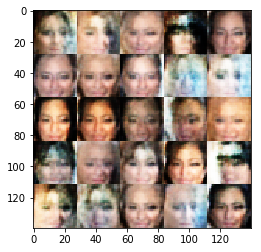

Epoch 1/1... Batch 6810/12662.4375 Discriminator Loss: 1.5344... Generator Loss: 0.5424
Epoch 1/1... Batch 6820/12662.4375 Discriminator Loss: 1.2763... Generator Loss: 0.6877
Epoch 1/1... Batch 6830/12662.4375 Discriminator Loss: 1.4235... Generator Loss: 0.6482
Epoch 1/1... Batch 6840/12662.4375 Discriminator Loss: 1.5870... Generator Loss: 0.5531
Epoch 1/1... Batch 6850/12662.4375 Discriminator Loss: 1.4803... Generator Loss: 0.5470
Epoch 1/1... Batch 6860/12662.4375 Discriminator Loss: 1.4703... Generator Loss: 0.5915
Epoch 1/1... Batch 6870/12662.4375 Discriminator Loss: 1.4748... Generator Loss: 0.6463
Epoch 1/1... Batch 6880/12662.4375 Discriminator Loss: 1.3456... Generator Loss: 0.6170
Epoch 1/1... Batch 6890/12662.4375 Discriminator Loss: 1.5829... Generator Loss: 0.6587
Epoch 1/1... Batch 6900/12662.4375 Discriminator Loss: 1.3686... Generator Loss: 0.6739


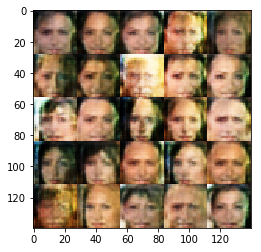

Epoch 1/1... Batch 6910/12662.4375 Discriminator Loss: 1.3064... Generator Loss: 0.6263
Epoch 1/1... Batch 6920/12662.4375 Discriminator Loss: 1.2454... Generator Loss: 0.7244
Epoch 1/1... Batch 6930/12662.4375 Discriminator Loss: 1.3604... Generator Loss: 0.7177
Epoch 1/1... Batch 6940/12662.4375 Discriminator Loss: 1.4242... Generator Loss: 0.6536
Epoch 1/1... Batch 6950/12662.4375 Discriminator Loss: 1.2668... Generator Loss: 0.7194
Epoch 1/1... Batch 6960/12662.4375 Discriminator Loss: 1.4706... Generator Loss: 0.6177
Epoch 1/1... Batch 6970/12662.4375 Discriminator Loss: 1.2761... Generator Loss: 0.6760
Epoch 1/1... Batch 6980/12662.4375 Discriminator Loss: 1.4172... Generator Loss: 0.6591
Epoch 1/1... Batch 6990/12662.4375 Discriminator Loss: 1.3890... Generator Loss: 0.7448
Epoch 1/1... Batch 7000/12662.4375 Discriminator Loss: 1.5389... Generator Loss: 0.6152


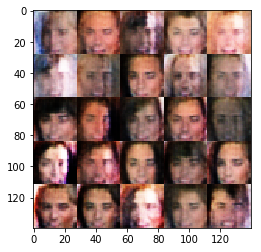

Epoch 1/1... Batch 7010/12662.4375 Discriminator Loss: 1.5165... Generator Loss: 0.4809
Epoch 1/1... Batch 7020/12662.4375 Discriminator Loss: 1.3429... Generator Loss: 0.5811
Epoch 1/1... Batch 7030/12662.4375 Discriminator Loss: 1.3723... Generator Loss: 0.6515
Epoch 1/1... Batch 7040/12662.4375 Discriminator Loss: 1.1711... Generator Loss: 0.6670
Epoch 1/1... Batch 7050/12662.4375 Discriminator Loss: 1.4169... Generator Loss: 0.5481
Epoch 1/1... Batch 7060/12662.4375 Discriminator Loss: 1.4081... Generator Loss: 0.6251
Epoch 1/1... Batch 7070/12662.4375 Discriminator Loss: 1.2862... Generator Loss: 0.6571
Epoch 1/1... Batch 7080/12662.4375 Discriminator Loss: 1.5413... Generator Loss: 0.5363
Epoch 1/1... Batch 7090/12662.4375 Discriminator Loss: 1.5724... Generator Loss: 0.5934
Epoch 1/1... Batch 7100/12662.4375 Discriminator Loss: 1.6450... Generator Loss: 0.5272


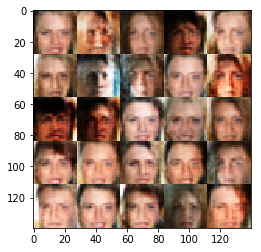

Epoch 1/1... Batch 7110/12662.4375 Discriminator Loss: 1.2352... Generator Loss: 0.6718
Epoch 1/1... Batch 7120/12662.4375 Discriminator Loss: 1.4374... Generator Loss: 0.5825
Epoch 1/1... Batch 7130/12662.4375 Discriminator Loss: 1.4780... Generator Loss: 0.6538
Epoch 1/1... Batch 7140/12662.4375 Discriminator Loss: 1.5276... Generator Loss: 0.5528
Epoch 1/1... Batch 7150/12662.4375 Discriminator Loss: 1.4316... Generator Loss: 0.5934
Epoch 1/1... Batch 7160/12662.4375 Discriminator Loss: 1.6300... Generator Loss: 0.6231
Epoch 1/1... Batch 7170/12662.4375 Discriminator Loss: 1.2445... Generator Loss: 0.7820
Epoch 1/1... Batch 7180/12662.4375 Discriminator Loss: 1.3036... Generator Loss: 0.6516
Epoch 1/1... Batch 7190/12662.4375 Discriminator Loss: 1.4745... Generator Loss: 0.5169
Epoch 1/1... Batch 7200/12662.4375 Discriminator Loss: 1.6098... Generator Loss: 0.6606


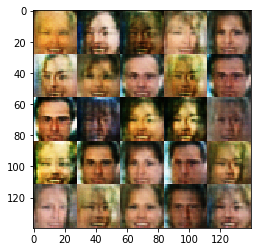

Epoch 1/1... Batch 7210/12662.4375 Discriminator Loss: 1.4660... Generator Loss: 0.6259
Epoch 1/1... Batch 7220/12662.4375 Discriminator Loss: 1.4220... Generator Loss: 0.5574
Epoch 1/1... Batch 7230/12662.4375 Discriminator Loss: 1.1831... Generator Loss: 0.7266
Epoch 1/1... Batch 7240/12662.4375 Discriminator Loss: 1.4511... Generator Loss: 0.6425
Epoch 1/1... Batch 7250/12662.4375 Discriminator Loss: 1.3072... Generator Loss: 0.6145
Epoch 1/1... Batch 7260/12662.4375 Discriminator Loss: 1.5323... Generator Loss: 0.6087
Epoch 1/1... Batch 7270/12662.4375 Discriminator Loss: 1.2852... Generator Loss: 0.7221
Epoch 1/1... Batch 7280/12662.4375 Discriminator Loss: 1.3986... Generator Loss: 0.6240
Epoch 1/1... Batch 7290/12662.4375 Discriminator Loss: 1.1075... Generator Loss: 0.8027
Epoch 1/1... Batch 7300/12662.4375 Discriminator Loss: 1.1612... Generator Loss: 0.6613


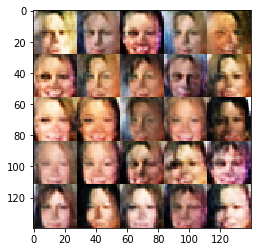

Epoch 1/1... Batch 7310/12662.4375 Discriminator Loss: 1.5627... Generator Loss: 0.5760
Epoch 1/1... Batch 7320/12662.4375 Discriminator Loss: 1.4379... Generator Loss: 0.7147
Epoch 1/1... Batch 7330/12662.4375 Discriminator Loss: 1.5328... Generator Loss: 0.5662
Epoch 1/1... Batch 7340/12662.4375 Discriminator Loss: 1.3127... Generator Loss: 0.6921
Epoch 1/1... Batch 7350/12662.4375 Discriminator Loss: 1.2556... Generator Loss: 0.8030
Epoch 1/1... Batch 7360/12662.4375 Discriminator Loss: 1.6910... Generator Loss: 0.4272
Epoch 1/1... Batch 7370/12662.4375 Discriminator Loss: 1.5028... Generator Loss: 0.6535
Epoch 1/1... Batch 7380/12662.4375 Discriminator Loss: 1.4269... Generator Loss: 0.5030
Epoch 1/1... Batch 7390/12662.4375 Discriminator Loss: 1.3789... Generator Loss: 0.5933
Epoch 1/1... Batch 7400/12662.4375 Discriminator Loss: 1.2106... Generator Loss: 0.7186


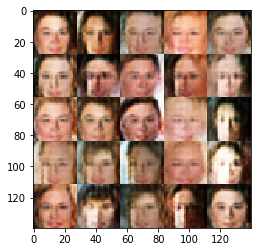

Epoch 1/1... Batch 7410/12662.4375 Discriminator Loss: 1.6455... Generator Loss: 0.6131
Epoch 1/1... Batch 7420/12662.4375 Discriminator Loss: 1.6918... Generator Loss: 0.5026
Epoch 1/1... Batch 7430/12662.4375 Discriminator Loss: 1.4197... Generator Loss: 0.5959
Epoch 1/1... Batch 7440/12662.4375 Discriminator Loss: 1.2892... Generator Loss: 0.6527
Epoch 1/1... Batch 7450/12662.4375 Discriminator Loss: 1.4777... Generator Loss: 0.6458
Epoch 1/1... Batch 7460/12662.4375 Discriminator Loss: 1.2819... Generator Loss: 0.6832
Epoch 1/1... Batch 7470/12662.4375 Discriminator Loss: 1.4214... Generator Loss: 0.6639
Epoch 1/1... Batch 7480/12662.4375 Discriminator Loss: 1.4028... Generator Loss: 0.5693
Epoch 1/1... Batch 7490/12662.4375 Discriminator Loss: 1.3425... Generator Loss: 0.7314
Epoch 1/1... Batch 7500/12662.4375 Discriminator Loss: 1.3729... Generator Loss: 0.5999


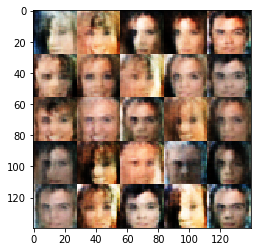

Epoch 1/1... Batch 7510/12662.4375 Discriminator Loss: 1.7020... Generator Loss: 0.4830
Epoch 1/1... Batch 7520/12662.4375 Discriminator Loss: 1.6118... Generator Loss: 0.5886
Epoch 1/1... Batch 7530/12662.4375 Discriminator Loss: 1.2047... Generator Loss: 0.6941
Epoch 1/1... Batch 7540/12662.4375 Discriminator Loss: 1.2382... Generator Loss: 0.6627
Epoch 1/1... Batch 7550/12662.4375 Discriminator Loss: 1.3897... Generator Loss: 0.5626
Epoch 1/1... Batch 7560/12662.4375 Discriminator Loss: 1.5096... Generator Loss: 0.6616
Epoch 1/1... Batch 7570/12662.4375 Discriminator Loss: 1.4743... Generator Loss: 0.5958
Epoch 1/1... Batch 7580/12662.4375 Discriminator Loss: 1.4768... Generator Loss: 0.5649
Epoch 1/1... Batch 7590/12662.4375 Discriminator Loss: 1.5655... Generator Loss: 0.5503
Epoch 1/1... Batch 7600/12662.4375 Discriminator Loss: 1.3381... Generator Loss: 0.6300


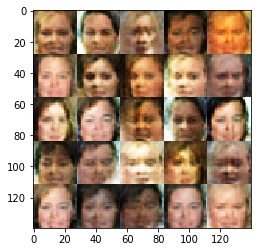

Epoch 1/1... Batch 7610/12662.4375 Discriminator Loss: 1.4633... Generator Loss: 0.6259
Epoch 1/1... Batch 7620/12662.4375 Discriminator Loss: 1.4293... Generator Loss: 0.5778
Epoch 1/1... Batch 7630/12662.4375 Discriminator Loss: 1.6178... Generator Loss: 0.5487
Epoch 1/1... Batch 7640/12662.4375 Discriminator Loss: 1.4786... Generator Loss: 0.5795
Epoch 1/1... Batch 7650/12662.4375 Discriminator Loss: 1.4455... Generator Loss: 0.6310
Epoch 1/1... Batch 7660/12662.4375 Discriminator Loss: 1.4951... Generator Loss: 0.5746
Epoch 1/1... Batch 7670/12662.4375 Discriminator Loss: 1.4652... Generator Loss: 0.6126
Epoch 1/1... Batch 7680/12662.4375 Discriminator Loss: 1.4049... Generator Loss: 0.6098
Epoch 1/1... Batch 7690/12662.4375 Discriminator Loss: 1.4248... Generator Loss: 0.6412
Epoch 1/1... Batch 7700/12662.4375 Discriminator Loss: 1.2439... Generator Loss: 0.6877


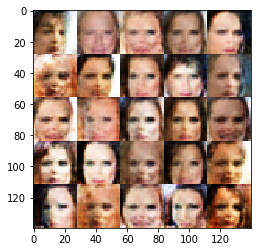

Epoch 1/1... Batch 7710/12662.4375 Discriminator Loss: 1.3502... Generator Loss: 0.5926
Epoch 1/1... Batch 7720/12662.4375 Discriminator Loss: 1.4531... Generator Loss: 0.5807
Epoch 1/1... Batch 7730/12662.4375 Discriminator Loss: 1.3514... Generator Loss: 0.7337
Epoch 1/1... Batch 7740/12662.4375 Discriminator Loss: 1.3571... Generator Loss: 0.6757
Epoch 1/1... Batch 7750/12662.4375 Discriminator Loss: 1.4939... Generator Loss: 0.5888
Epoch 1/1... Batch 7760/12662.4375 Discriminator Loss: 1.2794... Generator Loss: 0.7449
Epoch 1/1... Batch 7770/12662.4375 Discriminator Loss: 1.4370... Generator Loss: 0.6178
Epoch 1/1... Batch 7780/12662.4375 Discriminator Loss: 1.4043... Generator Loss: 0.5563
Epoch 1/1... Batch 7790/12662.4375 Discriminator Loss: 1.3859... Generator Loss: 0.6639
Epoch 1/1... Batch 7800/12662.4375 Discriminator Loss: 1.5846... Generator Loss: 0.5043


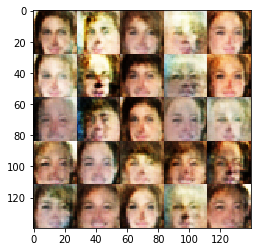

Epoch 1/1... Batch 7810/12662.4375 Discriminator Loss: 1.5919... Generator Loss: 0.6339
Epoch 1/1... Batch 7820/12662.4375 Discriminator Loss: 1.2460... Generator Loss: 0.6572
Epoch 1/1... Batch 7830/12662.4375 Discriminator Loss: 1.5026... Generator Loss: 0.5154
Epoch 1/1... Batch 7840/12662.4375 Discriminator Loss: 1.4434... Generator Loss: 0.5926
Epoch 1/1... Batch 7850/12662.4375 Discriminator Loss: 1.4855... Generator Loss: 0.5855
Epoch 1/1... Batch 7860/12662.4375 Discriminator Loss: 1.5667... Generator Loss: 0.5755
Epoch 1/1... Batch 7870/12662.4375 Discriminator Loss: 1.5031... Generator Loss: 0.6340
Epoch 1/1... Batch 7880/12662.4375 Discriminator Loss: 1.3534... Generator Loss: 0.7020
Epoch 1/1... Batch 7890/12662.4375 Discriminator Loss: 1.2558... Generator Loss: 0.6267
Epoch 1/1... Batch 7900/12662.4375 Discriminator Loss: 1.4584... Generator Loss: 0.5340


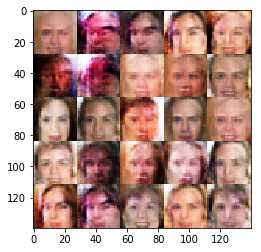

Epoch 1/1... Batch 7910/12662.4375 Discriminator Loss: 1.5219... Generator Loss: 0.6014
Epoch 1/1... Batch 7920/12662.4375 Discriminator Loss: 1.3297... Generator Loss: 0.5758
Epoch 1/1... Batch 7930/12662.4375 Discriminator Loss: 1.4026... Generator Loss: 0.5480
Epoch 1/1... Batch 7940/12662.4375 Discriminator Loss: 1.0826... Generator Loss: 0.7521
Epoch 1/1... Batch 7950/12662.4375 Discriminator Loss: 1.5080... Generator Loss: 0.5776
Epoch 1/1... Batch 7960/12662.4375 Discriminator Loss: 1.5507... Generator Loss: 0.5201
Epoch 1/1... Batch 7970/12662.4375 Discriminator Loss: 1.4875... Generator Loss: 0.5536
Epoch 1/1... Batch 7980/12662.4375 Discriminator Loss: 1.4847... Generator Loss: 0.6216
Epoch 1/1... Batch 7990/12662.4375 Discriminator Loss: 1.3632... Generator Loss: 0.6028
Epoch 1/1... Batch 8000/12662.4375 Discriminator Loss: 1.4832... Generator Loss: 0.6214


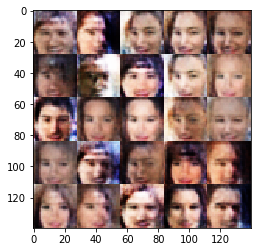

Epoch 1/1... Batch 8010/12662.4375 Discriminator Loss: 1.4075... Generator Loss: 0.5893
Epoch 1/1... Batch 8020/12662.4375 Discriminator Loss: 1.1193... Generator Loss: 0.7949
Epoch 1/1... Batch 8030/12662.4375 Discriminator Loss: 1.5295... Generator Loss: 0.6058
Epoch 1/1... Batch 8040/12662.4375 Discriminator Loss: 1.3194... Generator Loss: 0.5981
Epoch 1/1... Batch 8050/12662.4375 Discriminator Loss: 1.5554... Generator Loss: 0.6129
Epoch 1/1... Batch 8060/12662.4375 Discriminator Loss: 1.3779... Generator Loss: 0.5904
Epoch 1/1... Batch 8070/12662.4375 Discriminator Loss: 1.2940... Generator Loss: 0.6410
Epoch 1/1... Batch 8080/12662.4375 Discriminator Loss: 1.6895... Generator Loss: 0.5776
Epoch 1/1... Batch 8090/12662.4375 Discriminator Loss: 1.3238... Generator Loss: 0.6764
Epoch 1/1... Batch 8100/12662.4375 Discriminator Loss: 1.2735... Generator Loss: 0.6901


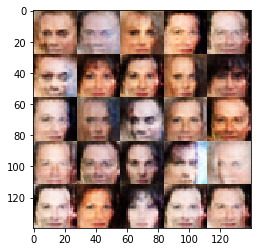

Epoch 1/1... Batch 8110/12662.4375 Discriminator Loss: 1.4096... Generator Loss: 0.5697
Epoch 1/1... Batch 8120/12662.4375 Discriminator Loss: 1.6016... Generator Loss: 0.6299
Epoch 1/1... Batch 8130/12662.4375 Discriminator Loss: 1.3171... Generator Loss: 0.6720
Epoch 1/1... Batch 8140/12662.4375 Discriminator Loss: 1.5527... Generator Loss: 0.5922
Epoch 1/1... Batch 8150/12662.4375 Discriminator Loss: 1.7897... Generator Loss: 0.5497
Epoch 1/1... Batch 8160/12662.4375 Discriminator Loss: 1.4709... Generator Loss: 0.6240
Epoch 1/1... Batch 8170/12662.4375 Discriminator Loss: 1.5985... Generator Loss: 0.5531
Epoch 1/1... Batch 8180/12662.4375 Discriminator Loss: 1.2788... Generator Loss: 0.7000
Epoch 1/1... Batch 8190/12662.4375 Discriminator Loss: 1.6914... Generator Loss: 0.5452
Epoch 1/1... Batch 8200/12662.4375 Discriminator Loss: 1.5788... Generator Loss: 0.5355


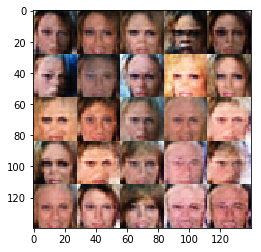

Epoch 1/1... Batch 8210/12662.4375 Discriminator Loss: 1.2881... Generator Loss: 0.6913
Epoch 1/1... Batch 8220/12662.4375 Discriminator Loss: 1.4563... Generator Loss: 0.5840
Epoch 1/1... Batch 8230/12662.4375 Discriminator Loss: 1.5712... Generator Loss: 0.5065
Epoch 1/1... Batch 8240/12662.4375 Discriminator Loss: 1.3208... Generator Loss: 0.6581
Epoch 1/1... Batch 8250/12662.4375 Discriminator Loss: 1.4232... Generator Loss: 0.5145
Epoch 1/1... Batch 8260/12662.4375 Discriminator Loss: 1.3169... Generator Loss: 0.6759
Epoch 1/1... Batch 8270/12662.4375 Discriminator Loss: 1.4234... Generator Loss: 0.5456
Epoch 1/1... Batch 8280/12662.4375 Discriminator Loss: 1.2384... Generator Loss: 0.7076
Epoch 1/1... Batch 8290/12662.4375 Discriminator Loss: 1.4645... Generator Loss: 0.6706
Epoch 1/1... Batch 8300/12662.4375 Discriminator Loss: 1.3824... Generator Loss: 0.5801


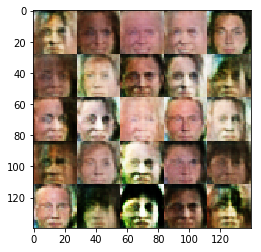

Epoch 1/1... Batch 8310/12662.4375 Discriminator Loss: 1.4090... Generator Loss: 0.5995
Epoch 1/1... Batch 8320/12662.4375 Discriminator Loss: 1.3251... Generator Loss: 0.6040
Epoch 1/1... Batch 8330/12662.4375 Discriminator Loss: 1.2660... Generator Loss: 0.7053
Epoch 1/1... Batch 8340/12662.4375 Discriminator Loss: 1.2275... Generator Loss: 0.6262
Epoch 1/1... Batch 8350/12662.4375 Discriminator Loss: 1.1482... Generator Loss: 0.7830
Epoch 1/1... Batch 8360/12662.4375 Discriminator Loss: 1.5371... Generator Loss: 0.5033
Epoch 1/1... Batch 8370/12662.4375 Discriminator Loss: 1.3834... Generator Loss: 0.4828
Epoch 1/1... Batch 8380/12662.4375 Discriminator Loss: 1.7267... Generator Loss: 0.4849
Epoch 1/1... Batch 8390/12662.4375 Discriminator Loss: 1.5927... Generator Loss: 0.5791
Epoch 1/1... Batch 8400/12662.4375 Discriminator Loss: 1.4311... Generator Loss: 0.5940


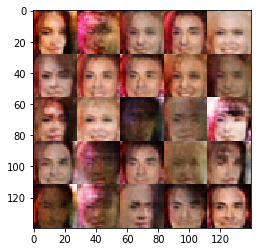

Epoch 1/1... Batch 8410/12662.4375 Discriminator Loss: 1.5136... Generator Loss: 0.6397
Epoch 1/1... Batch 8420/12662.4375 Discriminator Loss: 1.3745... Generator Loss: 0.7139
Epoch 1/1... Batch 8430/12662.4375 Discriminator Loss: 1.4221... Generator Loss: 0.5975
Epoch 1/1... Batch 8440/12662.4375 Discriminator Loss: 1.5874... Generator Loss: 0.5592
Epoch 1/1... Batch 8450/12662.4375 Discriminator Loss: 1.4202... Generator Loss: 0.5846
Epoch 1/1... Batch 8460/12662.4375 Discriminator Loss: 1.6637... Generator Loss: 0.5601
Epoch 1/1... Batch 8470/12662.4375 Discriminator Loss: 1.2660... Generator Loss: 0.6289
Epoch 1/1... Batch 8480/12662.4375 Discriminator Loss: 1.4975... Generator Loss: 0.5633
Epoch 1/1... Batch 8490/12662.4375 Discriminator Loss: 1.3289... Generator Loss: 0.6865
Epoch 1/1... Batch 8500/12662.4375 Discriminator Loss: 1.1307... Generator Loss: 0.6527


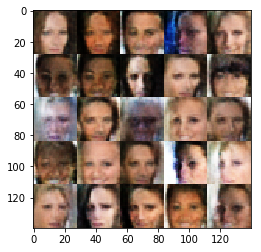

Epoch 1/1... Batch 8510/12662.4375 Discriminator Loss: 1.2476... Generator Loss: 0.6436
Epoch 1/1... Batch 8520/12662.4375 Discriminator Loss: 1.3027... Generator Loss: 0.6569
Epoch 1/1... Batch 8530/12662.4375 Discriminator Loss: 1.4188... Generator Loss: 0.6910
Epoch 1/1... Batch 8540/12662.4375 Discriminator Loss: 1.4179... Generator Loss: 0.7308
Epoch 1/1... Batch 8550/12662.4375 Discriminator Loss: 1.5410... Generator Loss: 0.5558
Epoch 1/1... Batch 8560/12662.4375 Discriminator Loss: 1.4818... Generator Loss: 0.6208
Epoch 1/1... Batch 8570/12662.4375 Discriminator Loss: 1.4698... Generator Loss: 0.6130
Epoch 1/1... Batch 8580/12662.4375 Discriminator Loss: 1.6877... Generator Loss: 0.4941
Epoch 1/1... Batch 8590/12662.4375 Discriminator Loss: 1.4616... Generator Loss: 0.5936
Epoch 1/1... Batch 8600/12662.4375 Discriminator Loss: 1.4461... Generator Loss: 0.5824


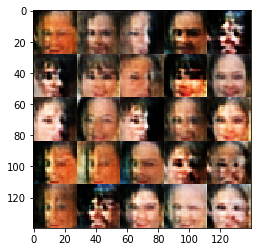

Epoch 1/1... Batch 8610/12662.4375 Discriminator Loss: 1.1084... Generator Loss: 0.7700
Epoch 1/1... Batch 8620/12662.4375 Discriminator Loss: 1.6433... Generator Loss: 0.5193
Epoch 1/1... Batch 8630/12662.4375 Discriminator Loss: 1.4453... Generator Loss: 0.6617
Epoch 1/1... Batch 8640/12662.4375 Discriminator Loss: 1.6204... Generator Loss: 0.5800
Epoch 1/1... Batch 8650/12662.4375 Discriminator Loss: 1.4502... Generator Loss: 0.5710
Epoch 1/1... Batch 8660/12662.4375 Discriminator Loss: 1.5298... Generator Loss: 0.5229
Epoch 1/1... Batch 8670/12662.4375 Discriminator Loss: 1.4316... Generator Loss: 0.5928
Epoch 1/1... Batch 8680/12662.4375 Discriminator Loss: 1.5474... Generator Loss: 0.6102
Epoch 1/1... Batch 8690/12662.4375 Discriminator Loss: 1.3669... Generator Loss: 0.6602
Epoch 1/1... Batch 8700/12662.4375 Discriminator Loss: 1.5335... Generator Loss: 0.6069


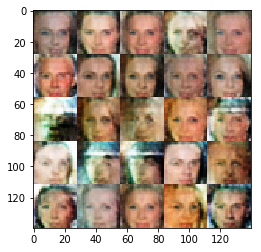

Epoch 1/1... Batch 8710/12662.4375 Discriminator Loss: 1.4580... Generator Loss: 0.6355
Epoch 1/1... Batch 8720/12662.4375 Discriminator Loss: 1.2884... Generator Loss: 0.6079
Epoch 1/1... Batch 8730/12662.4375 Discriminator Loss: 1.4744... Generator Loss: 0.6621
Epoch 1/1... Batch 8740/12662.4375 Discriminator Loss: 1.3079... Generator Loss: 0.7202
Epoch 1/1... Batch 8750/12662.4375 Discriminator Loss: 1.4319... Generator Loss: 0.6244
Epoch 1/1... Batch 8760/12662.4375 Discriminator Loss: 1.2016... Generator Loss: 0.7162
Epoch 1/1... Batch 8770/12662.4375 Discriminator Loss: 1.6406... Generator Loss: 0.5741
Epoch 1/1... Batch 8780/12662.4375 Discriminator Loss: 1.3284... Generator Loss: 0.6222
Epoch 1/1... Batch 8790/12662.4375 Discriminator Loss: 1.5741... Generator Loss: 0.5402
Epoch 1/1... Batch 8800/12662.4375 Discriminator Loss: 1.5191... Generator Loss: 0.5629


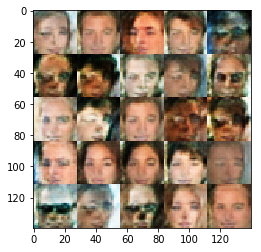

Epoch 1/1... Batch 8810/12662.4375 Discriminator Loss: 1.5219... Generator Loss: 0.5583
Epoch 1/1... Batch 8820/12662.4375 Discriminator Loss: 1.1304... Generator Loss: 0.8197
Epoch 1/1... Batch 8830/12662.4375 Discriminator Loss: 1.3355... Generator Loss: 0.5919
Epoch 1/1... Batch 8840/12662.4375 Discriminator Loss: 1.3406... Generator Loss: 0.5341
Epoch 1/1... Batch 8850/12662.4375 Discriminator Loss: 1.7240... Generator Loss: 0.4237
Epoch 1/1... Batch 8860/12662.4375 Discriminator Loss: 1.4259... Generator Loss: 0.6210
Epoch 1/1... Batch 8870/12662.4375 Discriminator Loss: 1.3052... Generator Loss: 0.6510
Epoch 1/1... Batch 8880/12662.4375 Discriminator Loss: 1.4444... Generator Loss: 0.6037
Epoch 1/1... Batch 8890/12662.4375 Discriminator Loss: 1.3957... Generator Loss: 0.6061
Epoch 1/1... Batch 8900/12662.4375 Discriminator Loss: 1.5384... Generator Loss: 0.5723


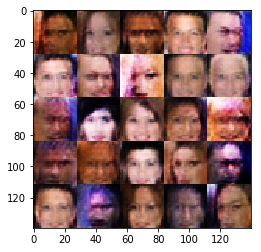

Epoch 1/1... Batch 8910/12662.4375 Discriminator Loss: 1.0984... Generator Loss: 0.7411
Epoch 1/1... Batch 8920/12662.4375 Discriminator Loss: 1.3417... Generator Loss: 0.6742
Epoch 1/1... Batch 8930/12662.4375 Discriminator Loss: 1.4349... Generator Loss: 0.6056
Epoch 1/1... Batch 8940/12662.4375 Discriminator Loss: 1.2858... Generator Loss: 0.6629
Epoch 1/1... Batch 8950/12662.4375 Discriminator Loss: 1.5347... Generator Loss: 0.5263
Epoch 1/1... Batch 8960/12662.4375 Discriminator Loss: 1.5152... Generator Loss: 0.6047
Epoch 1/1... Batch 8970/12662.4375 Discriminator Loss: 1.5258... Generator Loss: 0.6058
Epoch 1/1... Batch 8980/12662.4375 Discriminator Loss: 1.1411... Generator Loss: 0.6991
Epoch 1/1... Batch 8990/12662.4375 Discriminator Loss: 1.2538... Generator Loss: 0.7581
Epoch 1/1... Batch 9000/12662.4375 Discriminator Loss: 1.3455... Generator Loss: 0.6974


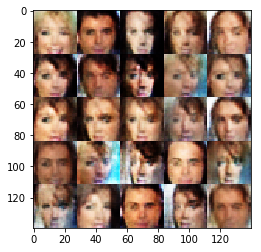

Epoch 1/1... Batch 9010/12662.4375 Discriminator Loss: 1.5481... Generator Loss: 0.5096
Epoch 1/1... Batch 9020/12662.4375 Discriminator Loss: 1.2752... Generator Loss: 0.7011
Epoch 1/1... Batch 9030/12662.4375 Discriminator Loss: 1.3172... Generator Loss: 0.5907
Epoch 1/1... Batch 9040/12662.4375 Discriminator Loss: 1.2983... Generator Loss: 0.6571
Epoch 1/1... Batch 9050/12662.4375 Discriminator Loss: 1.6217... Generator Loss: 0.5590
Epoch 1/1... Batch 9060/12662.4375 Discriminator Loss: 1.1719... Generator Loss: 0.7358
Epoch 1/1... Batch 9070/12662.4375 Discriminator Loss: 1.3103... Generator Loss: 0.6929
Epoch 1/1... Batch 9080/12662.4375 Discriminator Loss: 1.5096... Generator Loss: 0.5544
Epoch 1/1... Batch 9090/12662.4375 Discriminator Loss: 1.6395... Generator Loss: 0.4664
Epoch 1/1... Batch 9100/12662.4375 Discriminator Loss: 1.3282... Generator Loss: 0.6282


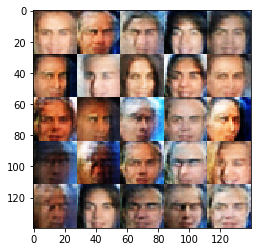

Epoch 1/1... Batch 9110/12662.4375 Discriminator Loss: 1.4977... Generator Loss: 0.6450
Epoch 1/1... Batch 9120/12662.4375 Discriminator Loss: 1.6004... Generator Loss: 0.5893
Epoch 1/1... Batch 9130/12662.4375 Discriminator Loss: 1.4471... Generator Loss: 0.6180
Epoch 1/1... Batch 9140/12662.4375 Discriminator Loss: 1.6143... Generator Loss: 0.5452
Epoch 1/1... Batch 9150/12662.4375 Discriminator Loss: 1.3085... Generator Loss: 0.5848
Epoch 1/1... Batch 9160/12662.4375 Discriminator Loss: 1.2410... Generator Loss: 0.6339
Epoch 1/1... Batch 9170/12662.4375 Discriminator Loss: 1.2820... Generator Loss: 0.6556
Epoch 1/1... Batch 9180/12662.4375 Discriminator Loss: 1.3837... Generator Loss: 0.6548
Epoch 1/1... Batch 9190/12662.4375 Discriminator Loss: 1.2324... Generator Loss: 0.7088
Epoch 1/1... Batch 9200/12662.4375 Discriminator Loss: 1.3452... Generator Loss: 0.5971


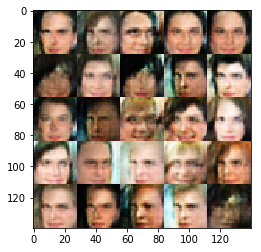

Epoch 1/1... Batch 9210/12662.4375 Discriminator Loss: 1.5011... Generator Loss: 0.5286
Epoch 1/1... Batch 9220/12662.4375 Discriminator Loss: 1.4446... Generator Loss: 0.5330
Epoch 1/1... Batch 9230/12662.4375 Discriminator Loss: 1.2814... Generator Loss: 0.6686
Epoch 1/1... Batch 9240/12662.4375 Discriminator Loss: 1.4268... Generator Loss: 0.5866
Epoch 1/1... Batch 9250/12662.4375 Discriminator Loss: 1.8208... Generator Loss: 0.4604
Epoch 1/1... Batch 9260/12662.4375 Discriminator Loss: 1.4847... Generator Loss: 0.6588
Epoch 1/1... Batch 9270/12662.4375 Discriminator Loss: 1.2810... Generator Loss: 0.6899
Epoch 1/1... Batch 9280/12662.4375 Discriminator Loss: 1.2869... Generator Loss: 0.6148
Epoch 1/1... Batch 9290/12662.4375 Discriminator Loss: 1.7248... Generator Loss: 0.5071
Epoch 1/1... Batch 9300/12662.4375 Discriminator Loss: 1.6442... Generator Loss: 0.5135


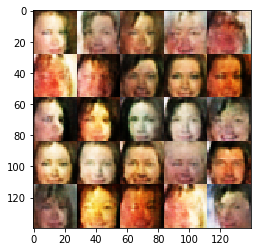

Epoch 1/1... Batch 9310/12662.4375 Discriminator Loss: 1.2849... Generator Loss: 0.6691
Epoch 1/1... Batch 9320/12662.4375 Discriminator Loss: 1.4709... Generator Loss: 0.6209
Epoch 1/1... Batch 9330/12662.4375 Discriminator Loss: 1.2518... Generator Loss: 0.7013
Epoch 1/1... Batch 9340/12662.4375 Discriminator Loss: 1.3164... Generator Loss: 0.6046
Epoch 1/1... Batch 9350/12662.4375 Discriminator Loss: 1.3564... Generator Loss: 0.6418
Epoch 1/1... Batch 9360/12662.4375 Discriminator Loss: 1.1972... Generator Loss: 0.8256
Epoch 1/1... Batch 9370/12662.4375 Discriminator Loss: 1.3110... Generator Loss: 0.6428
Epoch 1/1... Batch 9380/12662.4375 Discriminator Loss: 1.6016... Generator Loss: 0.5270
Epoch 1/1... Batch 9390/12662.4375 Discriminator Loss: 1.3207... Generator Loss: 0.6298
Epoch 1/1... Batch 9400/12662.4375 Discriminator Loss: 1.2950... Generator Loss: 0.7510


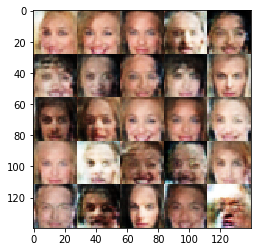

Epoch 1/1... Batch 9410/12662.4375 Discriminator Loss: 1.3208... Generator Loss: 0.5859
Epoch 1/1... Batch 9420/12662.4375 Discriminator Loss: 1.4631... Generator Loss: 0.5502
Epoch 1/1... Batch 9430/12662.4375 Discriminator Loss: 1.4287... Generator Loss: 0.6194
Epoch 1/1... Batch 9440/12662.4375 Discriminator Loss: 1.5439... Generator Loss: 0.5439
Epoch 1/1... Batch 9450/12662.4375 Discriminator Loss: 1.6880... Generator Loss: 0.4841
Epoch 1/1... Batch 9460/12662.4375 Discriminator Loss: 1.2316... Generator Loss: 0.5883
Epoch 1/1... Batch 9470/12662.4375 Discriminator Loss: 1.3953... Generator Loss: 0.6098
Epoch 1/1... Batch 9480/12662.4375 Discriminator Loss: 1.5063... Generator Loss: 0.6119
Epoch 1/1... Batch 9490/12662.4375 Discriminator Loss: 1.2857... Generator Loss: 0.7186
Epoch 1/1... Batch 9500/12662.4375 Discriminator Loss: 1.3324... Generator Loss: 0.6678


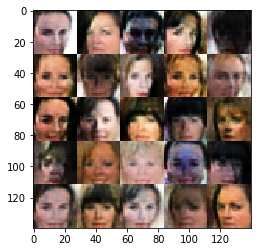

Epoch 1/1... Batch 9510/12662.4375 Discriminator Loss: 1.4834... Generator Loss: 0.5442
Epoch 1/1... Batch 9520/12662.4375 Discriminator Loss: 1.1870... Generator Loss: 0.7085
Epoch 1/1... Batch 9530/12662.4375 Discriminator Loss: 1.3698... Generator Loss: 0.6323
Epoch 1/1... Batch 9540/12662.4375 Discriminator Loss: 1.3918... Generator Loss: 0.5998
Epoch 1/1... Batch 9550/12662.4375 Discriminator Loss: 1.2227... Generator Loss: 0.5998
Epoch 1/1... Batch 9560/12662.4375 Discriminator Loss: 1.3037... Generator Loss: 0.5703
Epoch 1/1... Batch 9570/12662.4375 Discriminator Loss: 1.5347... Generator Loss: 0.4905
Epoch 1/1... Batch 9580/12662.4375 Discriminator Loss: 1.3536... Generator Loss: 0.6760
Epoch 1/1... Batch 9590/12662.4375 Discriminator Loss: 1.3957... Generator Loss: 0.6905
Epoch 1/1... Batch 9600/12662.4375 Discriminator Loss: 1.2170... Generator Loss: 0.7838


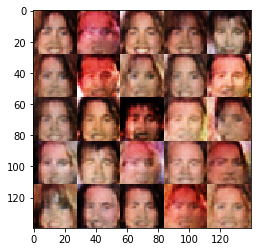

Epoch 1/1... Batch 9610/12662.4375 Discriminator Loss: 1.3975... Generator Loss: 0.5358
Epoch 1/1... Batch 9620/12662.4375 Discriminator Loss: 1.4113... Generator Loss: 0.5585
Epoch 1/1... Batch 9630/12662.4375 Discriminator Loss: 1.2956... Generator Loss: 0.5874
Epoch 1/1... Batch 9640/12662.4375 Discriminator Loss: 1.3869... Generator Loss: 0.6183
Epoch 1/1... Batch 9650/12662.4375 Discriminator Loss: 1.3340... Generator Loss: 0.6414
Epoch 1/1... Batch 9660/12662.4375 Discriminator Loss: 1.6096... Generator Loss: 0.4745
Epoch 1/1... Batch 9670/12662.4375 Discriminator Loss: 1.7951... Generator Loss: 0.4259
Epoch 1/1... Batch 9680/12662.4375 Discriminator Loss: 1.3359... Generator Loss: 0.6184
Epoch 1/1... Batch 9690/12662.4375 Discriminator Loss: 1.4905... Generator Loss: 0.5706
Epoch 1/1... Batch 9700/12662.4375 Discriminator Loss: 1.5261... Generator Loss: 0.5398


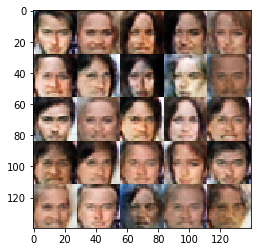

Epoch 1/1... Batch 9710/12662.4375 Discriminator Loss: 1.5732... Generator Loss: 0.6293
Epoch 1/1... Batch 9720/12662.4375 Discriminator Loss: 1.4354... Generator Loss: 0.5673
Epoch 1/1... Batch 9730/12662.4375 Discriminator Loss: 1.4673... Generator Loss: 0.5930
Epoch 1/1... Batch 9740/12662.4375 Discriminator Loss: 1.1526... Generator Loss: 0.7907
Epoch 1/1... Batch 9750/12662.4375 Discriminator Loss: 1.2420... Generator Loss: 0.6818
Epoch 1/1... Batch 9760/12662.4375 Discriminator Loss: 1.3722... Generator Loss: 0.6387
Epoch 1/1... Batch 9770/12662.4375 Discriminator Loss: 1.4195... Generator Loss: 0.5308
Epoch 1/1... Batch 9780/12662.4375 Discriminator Loss: 1.5063... Generator Loss: 0.5788
Epoch 1/1... Batch 9790/12662.4375 Discriminator Loss: 1.5360... Generator Loss: 0.4671
Epoch 1/1... Batch 9800/12662.4375 Discriminator Loss: 1.3909... Generator Loss: 0.5840


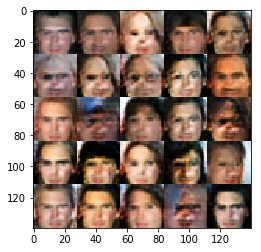

Epoch 1/1... Batch 9810/12662.4375 Discriminator Loss: 1.2729... Generator Loss: 0.6620
Epoch 1/1... Batch 9820/12662.4375 Discriminator Loss: 1.3607... Generator Loss: 0.5233
Epoch 1/1... Batch 9830/12662.4375 Discriminator Loss: 1.6224... Generator Loss: 0.4738
Epoch 1/1... Batch 9840/12662.4375 Discriminator Loss: 1.3555... Generator Loss: 0.6312
Epoch 1/1... Batch 9850/12662.4375 Discriminator Loss: 1.3688... Generator Loss: 0.6268
Epoch 1/1... Batch 9860/12662.4375 Discriminator Loss: 1.1384... Generator Loss: 0.8285
Epoch 1/1... Batch 9870/12662.4375 Discriminator Loss: 1.4361... Generator Loss: 0.5798
Epoch 1/1... Batch 9880/12662.4375 Discriminator Loss: 1.3173... Generator Loss: 0.6392
Epoch 1/1... Batch 9890/12662.4375 Discriminator Loss: 1.4988... Generator Loss: 0.5445
Epoch 1/1... Batch 9900/12662.4375 Discriminator Loss: 1.1405... Generator Loss: 0.7048


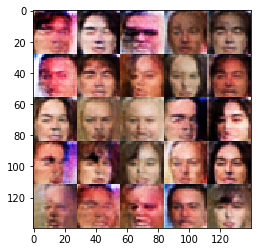

Epoch 1/1... Batch 9910/12662.4375 Discriminator Loss: 1.4693... Generator Loss: 0.5981
Epoch 1/1... Batch 9920/12662.4375 Discriminator Loss: 1.5661... Generator Loss: 0.5851
Epoch 1/1... Batch 9930/12662.4375 Discriminator Loss: 1.3417... Generator Loss: 0.6905
Epoch 1/1... Batch 9940/12662.4375 Discriminator Loss: 1.4885... Generator Loss: 0.5638
Epoch 1/1... Batch 9950/12662.4375 Discriminator Loss: 1.5725... Generator Loss: 0.5031
Epoch 1/1... Batch 9960/12662.4375 Discriminator Loss: 1.4140... Generator Loss: 0.6132
Epoch 1/1... Batch 9970/12662.4375 Discriminator Loss: 1.3694... Generator Loss: 0.5664
Epoch 1/1... Batch 9980/12662.4375 Discriminator Loss: 1.3786... Generator Loss: 0.5938
Epoch 1/1... Batch 9990/12662.4375 Discriminator Loss: 1.5880... Generator Loss: 0.5044
Epoch 1/1... Batch 10000/12662.4375 Discriminator Loss: 1.1687... Generator Loss: 0.6475


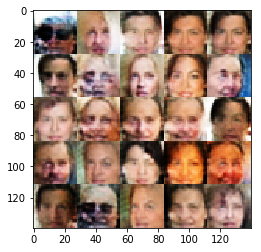

Epoch 1/1... Batch 10010/12662.4375 Discriminator Loss: 1.4859... Generator Loss: 0.5476
Epoch 1/1... Batch 10020/12662.4375 Discriminator Loss: 1.0862... Generator Loss: 0.7288
Epoch 1/1... Batch 10030/12662.4375 Discriminator Loss: 1.4931... Generator Loss: 0.5637
Epoch 1/1... Batch 10040/12662.4375 Discriminator Loss: 1.2237... Generator Loss: 0.7222
Epoch 1/1... Batch 10050/12662.4375 Discriminator Loss: 1.7653... Generator Loss: 0.5131
Epoch 1/1... Batch 10060/12662.4375 Discriminator Loss: 1.3671... Generator Loss: 0.6219
Epoch 1/1... Batch 10070/12662.4375 Discriminator Loss: 1.4523... Generator Loss: 0.6013
Epoch 1/1... Batch 10080/12662.4375 Discriminator Loss: 1.5305... Generator Loss: 0.5552
Epoch 1/1... Batch 10090/12662.4375 Discriminator Loss: 1.3909... Generator Loss: 0.6663
Epoch 1/1... Batch 10100/12662.4375 Discriminator Loss: 1.2763... Generator Loss: 0.6539


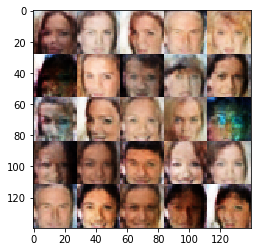

Epoch 1/1... Batch 10110/12662.4375 Discriminator Loss: 1.3938... Generator Loss: 0.6278
Epoch 1/1... Batch 10120/12662.4375 Discriminator Loss: 1.3506... Generator Loss: 0.6185
Epoch 1/1... Batch 10130/12662.4375 Discriminator Loss: 1.4371... Generator Loss: 0.6253
Epoch 1/1... Batch 10140/12662.4375 Discriminator Loss: 1.3540... Generator Loss: 0.5442
Epoch 1/1... Batch 10150/12662.4375 Discriminator Loss: 1.3705... Generator Loss: 0.5826
Epoch 1/1... Batch 10160/12662.4375 Discriminator Loss: 1.3520... Generator Loss: 0.6122
Epoch 1/1... Batch 10170/12662.4375 Discriminator Loss: 1.2052... Generator Loss: 0.7447
Epoch 1/1... Batch 10180/12662.4375 Discriminator Loss: 1.4021... Generator Loss: 0.5986
Epoch 1/1... Batch 10190/12662.4375 Discriminator Loss: 1.3502... Generator Loss: 0.5530
Epoch 1/1... Batch 10200/12662.4375 Discriminator Loss: 1.0994... Generator Loss: 0.7315


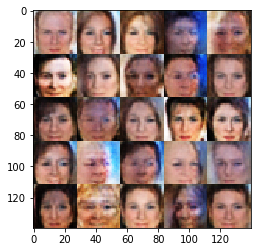

Epoch 1/1... Batch 10210/12662.4375 Discriminator Loss: 1.2408... Generator Loss: 0.6703
Epoch 1/1... Batch 10220/12662.4375 Discriminator Loss: 1.2709... Generator Loss: 0.7537
Epoch 1/1... Batch 10230/12662.4375 Discriminator Loss: 1.4176... Generator Loss: 0.6465
Epoch 1/1... Batch 10240/12662.4375 Discriminator Loss: 1.3062... Generator Loss: 0.6820
Epoch 1/1... Batch 10250/12662.4375 Discriminator Loss: 1.3968... Generator Loss: 0.7052
Epoch 1/1... Batch 10260/12662.4375 Discriminator Loss: 1.2729... Generator Loss: 0.7322
Epoch 1/1... Batch 10270/12662.4375 Discriminator Loss: 1.5381... Generator Loss: 0.5123
Epoch 1/1... Batch 10280/12662.4375 Discriminator Loss: 1.3913... Generator Loss: 0.6978
Epoch 1/1... Batch 10290/12662.4375 Discriminator Loss: 1.3134... Generator Loss: 0.6370
Epoch 1/1... Batch 10300/12662.4375 Discriminator Loss: 1.4639... Generator Loss: 0.5765


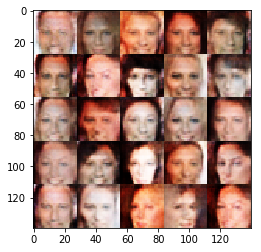

Epoch 1/1... Batch 10310/12662.4375 Discriminator Loss: 1.3102... Generator Loss: 0.5937
Epoch 1/1... Batch 10320/12662.4375 Discriminator Loss: 1.4332... Generator Loss: 0.7313
Epoch 1/1... Batch 10330/12662.4375 Discriminator Loss: 1.2331... Generator Loss: 0.6475
Epoch 1/1... Batch 10340/12662.4375 Discriminator Loss: 1.3319... Generator Loss: 0.6199
Epoch 1/1... Batch 10350/12662.4375 Discriminator Loss: 1.2022... Generator Loss: 0.7744
Epoch 1/1... Batch 10360/12662.4375 Discriminator Loss: 1.1885... Generator Loss: 0.7090
Epoch 1/1... Batch 10370/12662.4375 Discriminator Loss: 1.4141... Generator Loss: 0.6251
Epoch 1/1... Batch 10380/12662.4375 Discriminator Loss: 1.2212... Generator Loss: 0.5837
Epoch 1/1... Batch 10390/12662.4375 Discriminator Loss: 1.4171... Generator Loss: 0.6060
Epoch 1/1... Batch 10400/12662.4375 Discriminator Loss: 1.0782... Generator Loss: 0.7120


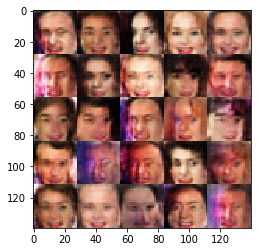

Epoch 1/1... Batch 10410/12662.4375 Discriminator Loss: 1.1880... Generator Loss: 0.6787
Epoch 1/1... Batch 10420/12662.4375 Discriminator Loss: 1.3146... Generator Loss: 0.6825
Epoch 1/1... Batch 10430/12662.4375 Discriminator Loss: 1.3610... Generator Loss: 0.7007
Epoch 1/1... Batch 10440/12662.4375 Discriminator Loss: 1.2481... Generator Loss: 0.6401
Epoch 1/1... Batch 10450/12662.4375 Discriminator Loss: 1.2824... Generator Loss: 0.6452
Epoch 1/1... Batch 10460/12662.4375 Discriminator Loss: 1.3727... Generator Loss: 0.5902
Epoch 1/1... Batch 10470/12662.4375 Discriminator Loss: 1.9316... Generator Loss: 0.5279
Epoch 1/1... Batch 10480/12662.4375 Discriminator Loss: 1.1748... Generator Loss: 0.7187
Epoch 1/1... Batch 10490/12662.4375 Discriminator Loss: 1.5668... Generator Loss: 0.4895
Epoch 1/1... Batch 10500/12662.4375 Discriminator Loss: 1.3140... Generator Loss: 0.6202


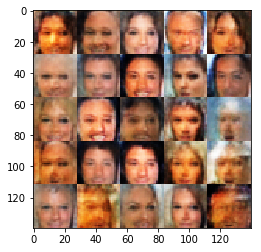

Epoch 1/1... Batch 10510/12662.4375 Discriminator Loss: 1.2962... Generator Loss: 0.6198
Epoch 1/1... Batch 10520/12662.4375 Discriminator Loss: 1.3475... Generator Loss: 0.6256
Epoch 1/1... Batch 10530/12662.4375 Discriminator Loss: 1.1110... Generator Loss: 0.7291
Epoch 1/1... Batch 10540/12662.4375 Discriminator Loss: 1.2607... Generator Loss: 0.6677
Epoch 1/1... Batch 10550/12662.4375 Discriminator Loss: 1.2712... Generator Loss: 0.6395
Epoch 1/1... Batch 10560/12662.4375 Discriminator Loss: 1.4519... Generator Loss: 0.5952
Epoch 1/1... Batch 10570/12662.4375 Discriminator Loss: 1.3516... Generator Loss: 0.6230
Epoch 1/1... Batch 10580/12662.4375 Discriminator Loss: 1.4235... Generator Loss: 0.5556
Epoch 1/1... Batch 10590/12662.4375 Discriminator Loss: 1.3291... Generator Loss: 0.6223
Epoch 1/1... Batch 10600/12662.4375 Discriminator Loss: 1.3078... Generator Loss: 0.8108


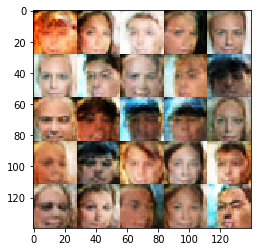

Epoch 1/1... Batch 10610/12662.4375 Discriminator Loss: 1.3479... Generator Loss: 0.7213
Epoch 1/1... Batch 10620/12662.4375 Discriminator Loss: 1.4758... Generator Loss: 0.5606
Epoch 1/1... Batch 10630/12662.4375 Discriminator Loss: 1.0744... Generator Loss: 0.8646
Epoch 1/1... Batch 10640/12662.4375 Discriminator Loss: 1.1857... Generator Loss: 0.7949
Epoch 1/1... Batch 10650/12662.4375 Discriminator Loss: 1.3225... Generator Loss: 0.5639
Epoch 1/1... Batch 10660/12662.4375 Discriminator Loss: 1.6076... Generator Loss: 0.6522
Epoch 1/1... Batch 10670/12662.4375 Discriminator Loss: 1.3088... Generator Loss: 0.6818
Epoch 1/1... Batch 10680/12662.4375 Discriminator Loss: 1.3016... Generator Loss: 0.6253
Epoch 1/1... Batch 10690/12662.4375 Discriminator Loss: 1.1452... Generator Loss: 0.7311
Epoch 1/1... Batch 10700/12662.4375 Discriminator Loss: 1.4671... Generator Loss: 0.5142


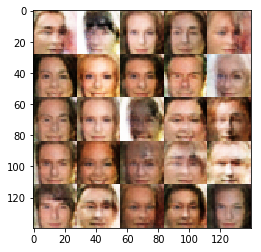

Epoch 1/1... Batch 10710/12662.4375 Discriminator Loss: 1.2072... Generator Loss: 0.7485
Epoch 1/1... Batch 10720/12662.4375 Discriminator Loss: 1.4755... Generator Loss: 0.4581
Epoch 1/1... Batch 10730/12662.4375 Discriminator Loss: 1.0748... Generator Loss: 0.7989
Epoch 1/1... Batch 10740/12662.4375 Discriminator Loss: 1.3255... Generator Loss: 0.5837
Epoch 1/1... Batch 10750/12662.4375 Discriminator Loss: 1.3531... Generator Loss: 0.5687
Epoch 1/1... Batch 10760/12662.4375 Discriminator Loss: 1.2746... Generator Loss: 0.6684
Epoch 1/1... Batch 10770/12662.4375 Discriminator Loss: 1.5452... Generator Loss: 0.6023
Epoch 1/1... Batch 10780/12662.4375 Discriminator Loss: 1.2667... Generator Loss: 0.6207
Epoch 1/1... Batch 10790/12662.4375 Discriminator Loss: 1.2769... Generator Loss: 0.6952
Epoch 1/1... Batch 10800/12662.4375 Discriminator Loss: 1.5057... Generator Loss: 0.5615


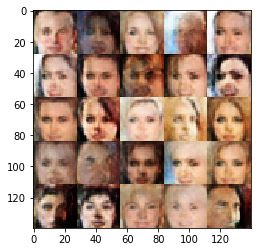

Epoch 1/1... Batch 10810/12662.4375 Discriminator Loss: 1.3969... Generator Loss: 0.6512
Epoch 1/1... Batch 10820/12662.4375 Discriminator Loss: 1.3405... Generator Loss: 0.6552
Epoch 1/1... Batch 10830/12662.4375 Discriminator Loss: 1.2747... Generator Loss: 0.6548
Epoch 1/1... Batch 10840/12662.4375 Discriminator Loss: 1.4485... Generator Loss: 0.6782
Epoch 1/1... Batch 10850/12662.4375 Discriminator Loss: 1.4212... Generator Loss: 0.4724
Epoch 1/1... Batch 10860/12662.4375 Discriminator Loss: 1.4307... Generator Loss: 0.5632
Epoch 1/1... Batch 10870/12662.4375 Discriminator Loss: 1.5613... Generator Loss: 0.5143
Epoch 1/1... Batch 10880/12662.4375 Discriminator Loss: 1.4124... Generator Loss: 0.5706
Epoch 1/1... Batch 10890/12662.4375 Discriminator Loss: 1.2868... Generator Loss: 0.6325
Epoch 1/1... Batch 10900/12662.4375 Discriminator Loss: 1.2667... Generator Loss: 0.6573


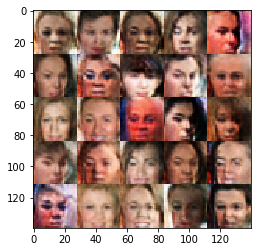

Epoch 1/1... Batch 10910/12662.4375 Discriminator Loss: 1.3835... Generator Loss: 0.4910
Epoch 1/1... Batch 10920/12662.4375 Discriminator Loss: 1.4615... Generator Loss: 0.5692
Epoch 1/1... Batch 10930/12662.4375 Discriminator Loss: 1.2828... Generator Loss: 0.7011
Epoch 1/1... Batch 10940/12662.4375 Discriminator Loss: 1.7125... Generator Loss: 0.5128
Epoch 1/1... Batch 10950/12662.4375 Discriminator Loss: 1.0545... Generator Loss: 0.7335
Epoch 1/1... Batch 10960/12662.4375 Discriminator Loss: 1.3835... Generator Loss: 0.5906
Epoch 1/1... Batch 10970/12662.4375 Discriminator Loss: 1.5079... Generator Loss: 0.5911
Epoch 1/1... Batch 10980/12662.4375 Discriminator Loss: 1.3247... Generator Loss: 0.6702
Epoch 1/1... Batch 10990/12662.4375 Discriminator Loss: 1.0935... Generator Loss: 0.7549
Epoch 1/1... Batch 11000/12662.4375 Discriminator Loss: 1.5170... Generator Loss: 0.6565


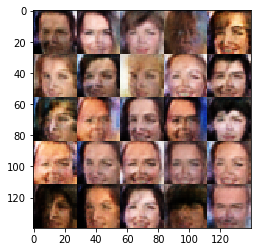

Epoch 1/1... Batch 11010/12662.4375 Discriminator Loss: 1.0899... Generator Loss: 0.8525
Epoch 1/1... Batch 11020/12662.4375 Discriminator Loss: 1.3250... Generator Loss: 0.5391
Epoch 1/1... Batch 11030/12662.4375 Discriminator Loss: 1.2472... Generator Loss: 0.6217
Epoch 1/1... Batch 11040/12662.4375 Discriminator Loss: 1.2216... Generator Loss: 0.6251
Epoch 1/1... Batch 11050/12662.4375 Discriminator Loss: 1.1708... Generator Loss: 0.6464
Epoch 1/1... Batch 11060/12662.4375 Discriminator Loss: 1.5885... Generator Loss: 0.4987
Epoch 1/1... Batch 11070/12662.4375 Discriminator Loss: 1.4387... Generator Loss: 0.5907
Epoch 1/1... Batch 11080/12662.4375 Discriminator Loss: 1.4345... Generator Loss: 0.7193
Epoch 1/1... Batch 11090/12662.4375 Discriminator Loss: 1.2781... Generator Loss: 0.6309
Epoch 1/1... Batch 11100/12662.4375 Discriminator Loss: 1.2958... Generator Loss: 0.6347


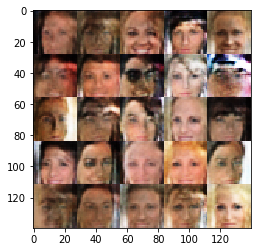

Epoch 1/1... Batch 11110/12662.4375 Discriminator Loss: 1.2949... Generator Loss: 0.6485
Epoch 1/1... Batch 11120/12662.4375 Discriminator Loss: 1.0980... Generator Loss: 0.8065
Epoch 1/1... Batch 11130/12662.4375 Discriminator Loss: 1.4945... Generator Loss: 0.6003
Epoch 1/1... Batch 11140/12662.4375 Discriminator Loss: 1.2740... Generator Loss: 0.5819
Epoch 1/1... Batch 11150/12662.4375 Discriminator Loss: 1.1986... Generator Loss: 0.6898
Epoch 1/1... Batch 11160/12662.4375 Discriminator Loss: 1.4527... Generator Loss: 0.6199
Epoch 1/1... Batch 11170/12662.4375 Discriminator Loss: 1.0670... Generator Loss: 0.7182
Epoch 1/1... Batch 11180/12662.4375 Discriminator Loss: 1.2066... Generator Loss: 0.6842
Epoch 1/1... Batch 11190/12662.4375 Discriminator Loss: 1.4085... Generator Loss: 0.4594
Epoch 1/1... Batch 11200/12662.4375 Discriminator Loss: 1.5921... Generator Loss: 0.5991


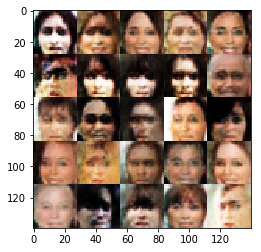

Epoch 1/1... Batch 11210/12662.4375 Discriminator Loss: 1.2518... Generator Loss: 0.7070
Epoch 1/1... Batch 11220/12662.4375 Discriminator Loss: 1.2750... Generator Loss: 0.6472
Epoch 1/1... Batch 11230/12662.4375 Discriminator Loss: 1.5976... Generator Loss: 0.4826
Epoch 1/1... Batch 11240/12662.4375 Discriminator Loss: 1.4326... Generator Loss: 0.5772
Epoch 1/1... Batch 11250/12662.4375 Discriminator Loss: 1.3272... Generator Loss: 0.5652
Epoch 1/1... Batch 11260/12662.4375 Discriminator Loss: 1.5789... Generator Loss: 0.4655
Epoch 1/1... Batch 11270/12662.4375 Discriminator Loss: 1.3891... Generator Loss: 0.5427
Epoch 1/1... Batch 11280/12662.4375 Discriminator Loss: 1.0084... Generator Loss: 0.7631
Epoch 1/1... Batch 11290/12662.4375 Discriminator Loss: 1.2023... Generator Loss: 0.5816
Epoch 1/1... Batch 11300/12662.4375 Discriminator Loss: 1.5888... Generator Loss: 0.5048


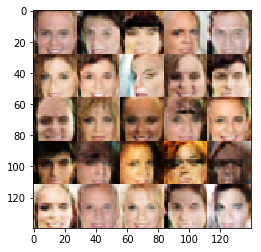

Epoch 1/1... Batch 11310/12662.4375 Discriminator Loss: 1.4674... Generator Loss: 0.5427
Epoch 1/1... Batch 11320/12662.4375 Discriminator Loss: 1.4569... Generator Loss: 0.5871
Epoch 1/1... Batch 11330/12662.4375 Discriminator Loss: 1.2939... Generator Loss: 0.6995
Epoch 1/1... Batch 11340/12662.4375 Discriminator Loss: 1.1083... Generator Loss: 0.7074
Epoch 1/1... Batch 11350/12662.4375 Discriminator Loss: 1.3012... Generator Loss: 0.6822
Epoch 1/1... Batch 11360/12662.4375 Discriminator Loss: 1.3369... Generator Loss: 0.6720
Epoch 1/1... Batch 11370/12662.4375 Discriminator Loss: 1.4629... Generator Loss: 0.4857
Epoch 1/1... Batch 11380/12662.4375 Discriminator Loss: 1.4131... Generator Loss: 0.6025
Epoch 1/1... Batch 11390/12662.4375 Discriminator Loss: 1.4119... Generator Loss: 0.6405
Epoch 1/1... Batch 11400/12662.4375 Discriminator Loss: 1.3382... Generator Loss: 0.7212


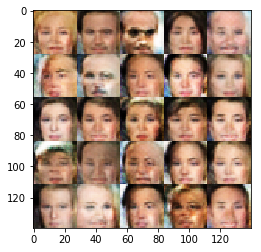

Epoch 1/1... Batch 11410/12662.4375 Discriminator Loss: 1.2575... Generator Loss: 0.7895
Epoch 1/1... Batch 11420/12662.4375 Discriminator Loss: 1.2943... Generator Loss: 0.6594
Epoch 1/1... Batch 11430/12662.4375 Discriminator Loss: 1.3987... Generator Loss: 0.6432
Epoch 1/1... Batch 11440/12662.4375 Discriminator Loss: 1.2277... Generator Loss: 0.6545
Epoch 1/1... Batch 11450/12662.4375 Discriminator Loss: 1.1394... Generator Loss: 0.8734
Epoch 1/1... Batch 11460/12662.4375 Discriminator Loss: 1.1510... Generator Loss: 0.6659
Epoch 1/1... Batch 11470/12662.4375 Discriminator Loss: 1.1854... Generator Loss: 0.7381
Epoch 1/1... Batch 11480/12662.4375 Discriminator Loss: 1.3243... Generator Loss: 0.6487
Epoch 1/1... Batch 11490/12662.4375 Discriminator Loss: 1.1712... Generator Loss: 0.7367
Epoch 1/1... Batch 11500/12662.4375 Discriminator Loss: 1.3197... Generator Loss: 0.7245


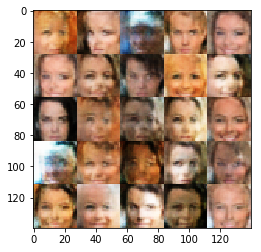

Epoch 1/1... Batch 11510/12662.4375 Discriminator Loss: 1.0969... Generator Loss: 0.8309
Epoch 1/1... Batch 11520/12662.4375 Discriminator Loss: 1.4221... Generator Loss: 0.5418
Epoch 1/1... Batch 11530/12662.4375 Discriminator Loss: 1.3780... Generator Loss: 0.6721
Epoch 1/1... Batch 11540/12662.4375 Discriminator Loss: 1.2049... Generator Loss: 0.6164
Epoch 1/1... Batch 11550/12662.4375 Discriminator Loss: 1.2911... Generator Loss: 0.6744
Epoch 1/1... Batch 11560/12662.4375 Discriminator Loss: 1.4703... Generator Loss: 0.5365
Epoch 1/1... Batch 11570/12662.4375 Discriminator Loss: 1.3216... Generator Loss: 0.7524
Epoch 1/1... Batch 11580/12662.4375 Discriminator Loss: 1.2439... Generator Loss: 0.6098
Epoch 1/1... Batch 11590/12662.4375 Discriminator Loss: 1.3499... Generator Loss: 0.6606
Epoch 1/1... Batch 11600/12662.4375 Discriminator Loss: 1.2703... Generator Loss: 0.6406


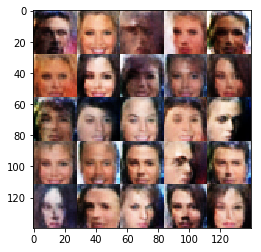

Epoch 1/1... Batch 11610/12662.4375 Discriminator Loss: 1.3390... Generator Loss: 0.6368
Epoch 1/1... Batch 11620/12662.4375 Discriminator Loss: 1.1706... Generator Loss: 0.7457
Epoch 1/1... Batch 11630/12662.4375 Discriminator Loss: 1.1651... Generator Loss: 0.7069
Epoch 1/1... Batch 11640/12662.4375 Discriminator Loss: 1.3996... Generator Loss: 0.5891
Epoch 1/1... Batch 11650/12662.4375 Discriminator Loss: 0.9017... Generator Loss: 0.9715
Epoch 1/1... Batch 11660/12662.4375 Discriminator Loss: 1.2203... Generator Loss: 0.5870
Epoch 1/1... Batch 11670/12662.4375 Discriminator Loss: 1.3443... Generator Loss: 0.7089
Epoch 1/1... Batch 11680/12662.4375 Discriminator Loss: 1.7001... Generator Loss: 0.5195
Epoch 1/1... Batch 11690/12662.4375 Discriminator Loss: 1.5351... Generator Loss: 0.4680
Epoch 1/1... Batch 11700/12662.4375 Discriminator Loss: 1.1925... Generator Loss: 0.6283


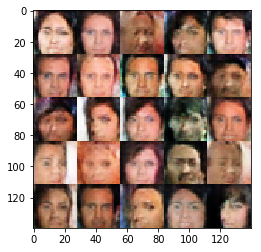

Epoch 1/1... Batch 11710/12662.4375 Discriminator Loss: 1.4048... Generator Loss: 0.5306
Epoch 1/1... Batch 11720/12662.4375 Discriminator Loss: 1.2366... Generator Loss: 0.6730
Epoch 1/1... Batch 11730/12662.4375 Discriminator Loss: 1.2416... Generator Loss: 0.6031
Epoch 1/1... Batch 11740/12662.4375 Discriminator Loss: 1.3062... Generator Loss: 0.6642
Epoch 1/1... Batch 11750/12662.4375 Discriminator Loss: 1.4133... Generator Loss: 0.5153
Epoch 1/1... Batch 11760/12662.4375 Discriminator Loss: 1.3411... Generator Loss: 0.6212
Epoch 1/1... Batch 11770/12662.4375 Discriminator Loss: 1.4908... Generator Loss: 0.5464
Epoch 1/1... Batch 11780/12662.4375 Discriminator Loss: 1.1513... Generator Loss: 0.7089
Epoch 1/1... Batch 11790/12662.4375 Discriminator Loss: 1.2454... Generator Loss: 0.6608
Epoch 1/1... Batch 11800/12662.4375 Discriminator Loss: 1.3721... Generator Loss: 0.5573


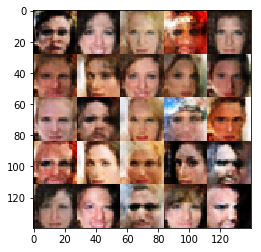

Epoch 1/1... Batch 11810/12662.4375 Discriminator Loss: 1.4716... Generator Loss: 0.5121
Epoch 1/1... Batch 11820/12662.4375 Discriminator Loss: 1.1789... Generator Loss: 0.6400
Epoch 1/1... Batch 11830/12662.4375 Discriminator Loss: 1.2457... Generator Loss: 0.6679
Epoch 1/1... Batch 11840/12662.4375 Discriminator Loss: 1.6024... Generator Loss: 0.4843
Epoch 1/1... Batch 11850/12662.4375 Discriminator Loss: 1.3279... Generator Loss: 0.6478
Epoch 1/1... Batch 11860/12662.4375 Discriminator Loss: 1.3818... Generator Loss: 0.4911
Epoch 1/1... Batch 11870/12662.4375 Discriminator Loss: 1.5012... Generator Loss: 0.5386
Epoch 1/1... Batch 11880/12662.4375 Discriminator Loss: 1.4540... Generator Loss: 0.5268
Epoch 1/1... Batch 11890/12662.4375 Discriminator Loss: 1.1125... Generator Loss: 0.8153
Epoch 1/1... Batch 11900/12662.4375 Discriminator Loss: 1.3335... Generator Loss: 0.6267


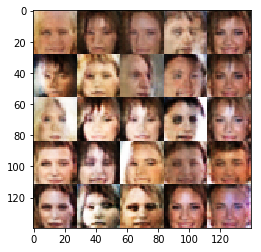

Epoch 1/1... Batch 11910/12662.4375 Discriminator Loss: 1.5422... Generator Loss: 0.5406
Epoch 1/1... Batch 11920/12662.4375 Discriminator Loss: 1.4195... Generator Loss: 0.5472
Epoch 1/1... Batch 11930/12662.4375 Discriminator Loss: 1.4324... Generator Loss: 0.5801
Epoch 1/1... Batch 11940/12662.4375 Discriminator Loss: 1.2612... Generator Loss: 0.5671
Epoch 1/1... Batch 11950/12662.4375 Discriminator Loss: 1.6146... Generator Loss: 0.5610
Epoch 1/1... Batch 11960/12662.4375 Discriminator Loss: 1.0087... Generator Loss: 0.8247
Epoch 1/1... Batch 11970/12662.4375 Discriminator Loss: 1.5261... Generator Loss: 0.5237
Epoch 1/1... Batch 11980/12662.4375 Discriminator Loss: 1.3649... Generator Loss: 0.6473
Epoch 1/1... Batch 11990/12662.4375 Discriminator Loss: 1.2789... Generator Loss: 0.6304
Epoch 1/1... Batch 12000/12662.4375 Discriminator Loss: 1.3155... Generator Loss: 0.5434


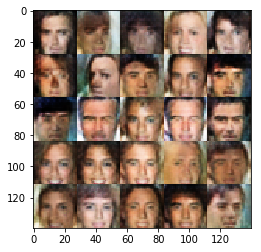

Epoch 1/1... Batch 12010/12662.4375 Discriminator Loss: 1.1864... Generator Loss: 0.6346
Epoch 1/1... Batch 12020/12662.4375 Discriminator Loss: 1.4018... Generator Loss: 0.5565
Epoch 1/1... Batch 12030/12662.4375 Discriminator Loss: 1.1929... Generator Loss: 0.6291
Epoch 1/1... Batch 12040/12662.4375 Discriminator Loss: 1.2788... Generator Loss: 0.6452
Epoch 1/1... Batch 12050/12662.4375 Discriminator Loss: 1.4495... Generator Loss: 0.6572
Epoch 1/1... Batch 12060/12662.4375 Discriminator Loss: 1.2145... Generator Loss: 0.7191
Epoch 1/1... Batch 12070/12662.4375 Discriminator Loss: 1.4798... Generator Loss: 0.4321
Epoch 1/1... Batch 12080/12662.4375 Discriminator Loss: 1.5785... Generator Loss: 0.5082
Epoch 1/1... Batch 12090/12662.4375 Discriminator Loss: 1.3172... Generator Loss: 0.7115
Epoch 1/1... Batch 12100/12662.4375 Discriminator Loss: 1.3504... Generator Loss: 0.5242


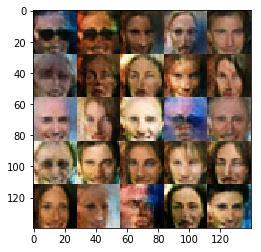

Epoch 1/1... Batch 12110/12662.4375 Discriminator Loss: 1.5285... Generator Loss: 0.4904
Epoch 1/1... Batch 12120/12662.4375 Discriminator Loss: 1.3123... Generator Loss: 0.7079
Epoch 1/1... Batch 12130/12662.4375 Discriminator Loss: 1.0863... Generator Loss: 0.7795
Epoch 1/1... Batch 12140/12662.4375 Discriminator Loss: 1.3464... Generator Loss: 0.6198
Epoch 1/1... Batch 12150/12662.4375 Discriminator Loss: 1.3417... Generator Loss: 0.5514
Epoch 1/1... Batch 12160/12662.4375 Discriminator Loss: 1.1589... Generator Loss: 0.6169
Epoch 1/1... Batch 12170/12662.4375 Discriminator Loss: 1.5137... Generator Loss: 0.5229
Epoch 1/1... Batch 12180/12662.4375 Discriminator Loss: 1.3098... Generator Loss: 0.5694
Epoch 1/1... Batch 12190/12662.4375 Discriminator Loss: 1.0836... Generator Loss: 0.8275
Epoch 1/1... Batch 12200/12662.4375 Discriminator Loss: 1.3811... Generator Loss: 0.6405


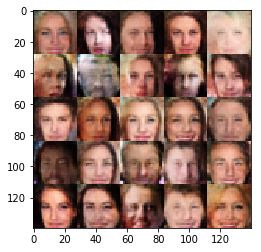

Epoch 1/1... Batch 12210/12662.4375 Discriminator Loss: 1.3683... Generator Loss: 0.6612
Epoch 1/1... Batch 12220/12662.4375 Discriminator Loss: 1.3049... Generator Loss: 0.6638
Epoch 1/1... Batch 12230/12662.4375 Discriminator Loss: 1.2063... Generator Loss: 0.6164
Epoch 1/1... Batch 12240/12662.4375 Discriminator Loss: 1.4092... Generator Loss: 0.6568
Epoch 1/1... Batch 12250/12662.4375 Discriminator Loss: 1.0760... Generator Loss: 0.7427
Epoch 1/1... Batch 12260/12662.4375 Discriminator Loss: 1.2452... Generator Loss: 0.6504
Epoch 1/1... Batch 12270/12662.4375 Discriminator Loss: 1.1366... Generator Loss: 0.7463
Epoch 1/1... Batch 12280/12662.4375 Discriminator Loss: 1.2942... Generator Loss: 0.6541
Epoch 1/1... Batch 12290/12662.4375 Discriminator Loss: 1.2296... Generator Loss: 0.6210
Epoch 1/1... Batch 12300/12662.4375 Discriminator Loss: 1.0600... Generator Loss: 0.6974


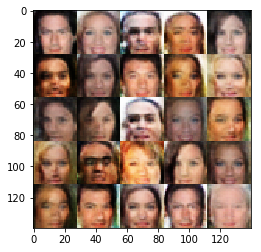

Epoch 1/1... Batch 12310/12662.4375 Discriminator Loss: 1.1182... Generator Loss: 0.8134
Epoch 1/1... Batch 12320/12662.4375 Discriminator Loss: 1.2676... Generator Loss: 0.6838
Epoch 1/1... Batch 12330/12662.4375 Discriminator Loss: 1.3298... Generator Loss: 0.5580
Epoch 1/1... Batch 12340/12662.4375 Discriminator Loss: 1.4405... Generator Loss: 0.5388
Epoch 1/1... Batch 12350/12662.4375 Discriminator Loss: 1.5767... Generator Loss: 0.4890
Epoch 1/1... Batch 12360/12662.4375 Discriminator Loss: 1.4393... Generator Loss: 0.4916
Epoch 1/1... Batch 12370/12662.4375 Discriminator Loss: 1.2619... Generator Loss: 0.6914
Epoch 1/1... Batch 12380/12662.4375 Discriminator Loss: 1.3301... Generator Loss: 0.6096
Epoch 1/1... Batch 12390/12662.4375 Discriminator Loss: 1.2870... Generator Loss: 0.7212
Epoch 1/1... Batch 12400/12662.4375 Discriminator Loss: 1.1995... Generator Loss: 0.6908


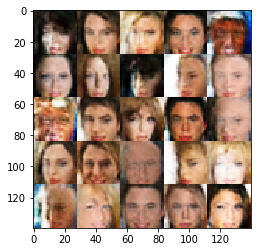

Epoch 1/1... Batch 12410/12662.4375 Discriminator Loss: 1.3949... Generator Loss: 0.5502
Epoch 1/1... Batch 12420/12662.4375 Discriminator Loss: 1.1083... Generator Loss: 0.7418
Epoch 1/1... Batch 12430/12662.4375 Discriminator Loss: 1.2370... Generator Loss: 0.6126
Epoch 1/1... Batch 12440/12662.4375 Discriminator Loss: 1.5891... Generator Loss: 0.5455
Epoch 1/1... Batch 12450/12662.4375 Discriminator Loss: 1.2044... Generator Loss: 0.6966
Epoch 1/1... Batch 12460/12662.4375 Discriminator Loss: 1.4802... Generator Loss: 0.4627
Epoch 1/1... Batch 12470/12662.4375 Discriminator Loss: 1.2019... Generator Loss: 0.7139
Epoch 1/1... Batch 12480/12662.4375 Discriminator Loss: 1.3743... Generator Loss: 0.7089
Epoch 1/1... Batch 12490/12662.4375 Discriminator Loss: 1.1529... Generator Loss: 0.6615
Epoch 1/1... Batch 12500/12662.4375 Discriminator Loss: 1.2519... Generator Loss: 0.5851


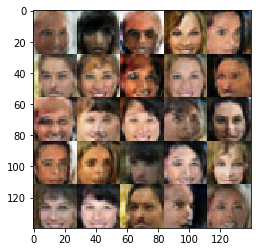

Epoch 1/1... Batch 12510/12662.4375 Discriminator Loss: 1.6479... Generator Loss: 0.4168
Epoch 1/1... Batch 12520/12662.4375 Discriminator Loss: 1.7514... Generator Loss: 0.4371
Epoch 1/1... Batch 12530/12662.4375 Discriminator Loss: 1.1228... Generator Loss: 0.7012
Epoch 1/1... Batch 12540/12662.4375 Discriminator Loss: 1.3550... Generator Loss: 0.6617
Epoch 1/1... Batch 12550/12662.4375 Discriminator Loss: 1.2561... Generator Loss: 0.5772
Epoch 1/1... Batch 12560/12662.4375 Discriminator Loss: 1.0479... Generator Loss: 0.8074
Epoch 1/1... Batch 12570/12662.4375 Discriminator Loss: 1.1543... Generator Loss: 0.7181
Epoch 1/1... Batch 12580/12662.4375 Discriminator Loss: 1.1933... Generator Loss: 0.5804
Epoch 1/1... Batch 12590/12662.4375 Discriminator Loss: 1.2990... Generator Loss: 0.6561
Epoch 1/1... Batch 12600/12662.4375 Discriminator Loss: 1.2177... Generator Loss: 0.7626


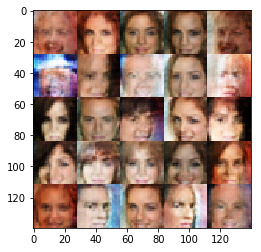

Epoch 1/1... Batch 12610/12662.4375 Discriminator Loss: 1.2803... Generator Loss: 0.6612
Epoch 1/1... Batch 12620/12662.4375 Discriminator Loss: 1.4245... Generator Loss: 0.5738
Epoch 1/1... Batch 12630/12662.4375 Discriminator Loss: 1.2279... Generator Loss: 0.6009
Epoch 1/1... Batch 12640/12662.4375 Discriminator Loss: 1.3292... Generator Loss: 0.6086
Epoch 1/1... Batch 12650/12662.4375 Discriminator Loss: 1.4703... Generator Loss: 0.5848
Epoch 1/1... Batch 12660/12662.4375 Discriminator Loss: 1.3286... Generator Loss: 0.6678


In [20]:
batch_size = 16
z_dim = 256
learning_rate = 0.00005
beta1 = 0.6


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.